# Analysis and Evaluation of Classification Models

This notebook aims to explore and compare the performance of different machine learning models for a classification problem. The main objectives are:

1.  **Evaluate baseline models:** Analyze the performance of classifiers such as **Logistic Regression**, **Random Forest**, and **XGBoost** using the entire feature set.
2.  **Perform feature selection:** Identify and use the 10 most relevant features to retrain the models, with the goal of improving efficiency and performance.
3.  **Optimize parameters:** Find the best hyperparameters for each model using optimization techniques.
4.  **Build and evaluate an ensemble:** Combine the optimized models into a **VotingClassifier** to leverage the collective strength of different algorithms and achieve more robust results.

Each section of the notebook is dedicated to a specific model, with charts and reports that document the different evaluation phases.

## 1) Setup and initialization

In [71]:
%load_ext autoreload
%autoreload 2

from libraries.embeddings_utils import *
import ipynbname
from scipy.stats import randint
from sklearn.ensemble import VotingClassifier
from libraries.classifier_utils import *
from libraries.file_manager_utils import *
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import uniform

project_dir = f"{os.getcwd().split('SIDS_revelation_project')[0]}SIDS_revelation_project/"
image_dataset_path = f"{project_dir}datasets/onback_onstomach_v3"
model_path_fd = f"{project_dir}/models/4.fd_weights/best.pt"
model_path_pe = f"{project_dir}/models/2.pe_weights/best.pt"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [72]:
emb_builder = EmbeddingBuilder(model_path_fd, image_dataset_path, "load",weights_path_pe=model_path_pe)
embeddings = emb_builder.create_embedding(flags=True,positions=True, positions_normalized=True, geometric_info=True,k_positions_normalized=True ,k_geometric_info=True)


Extracting dataset info from .coco.json file:---------------------------------------------
Dataset contains 4158 valid samples, and labels are {'baby_on_back': 1, 'baby_on_stomach': 2}
------------------------------------------------------------------------------------------

Loading features from .csv----------------------------------------------------------------
Features loaded succesfully, in particular there are 4158 files in the dataset
------------------------------------------------------------------------------------------

Embedding builder initialized successfully------------------------------------------------
Face detection model: 4 (YOLOv8)
Dataset: /Users/lorenzodimaio/Download/SIDS_revelation_project/datasets/onback_onstomach_v3
Dataset dimension: 4158
Dataset labels: {'baby_safe': 0, 'baby_unsafe': 1}
------------------------------------------------------------------------------------------

Embedding creation-----------------------------------------------------------

In [73]:
clf = Classifier(embeddings, emb_builder.y, emb_builder.classes_bs,figsize = (10, 6))

# 2) Logistic Regression

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


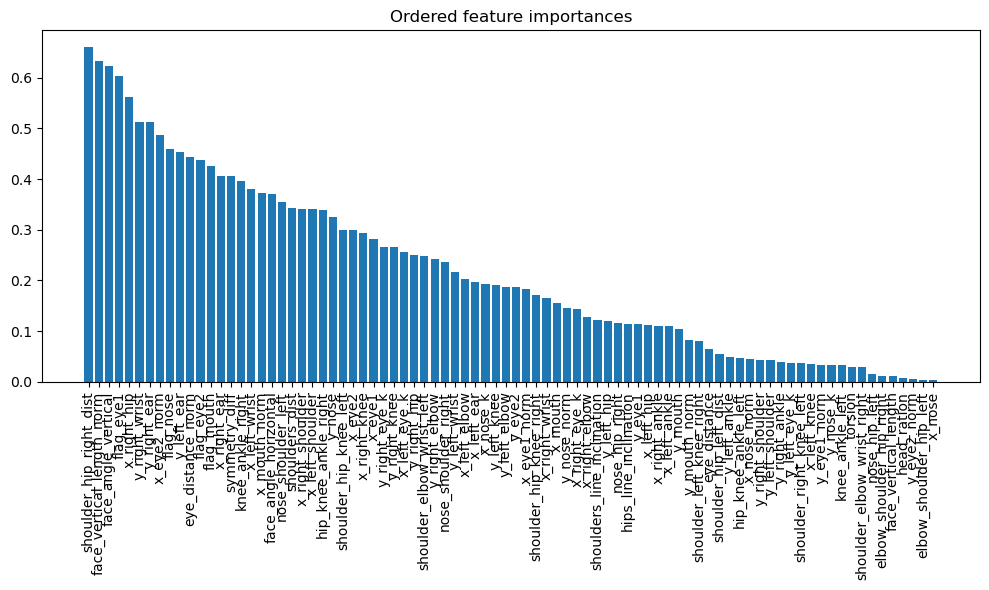

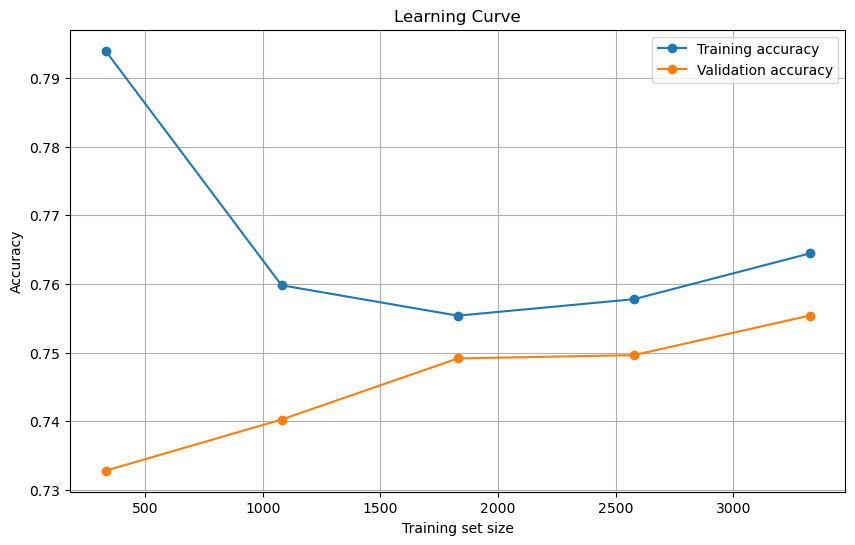


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.74      0.71      0.72       423
 baby_unsafe       0.71      0.75      0.73       409

    accuracy                           0.73       832
   macro avg       0.73      0.73      0.73       832
weighted avg       0.73      0.73      0.73       832

Confusion matrix---------------------------------------


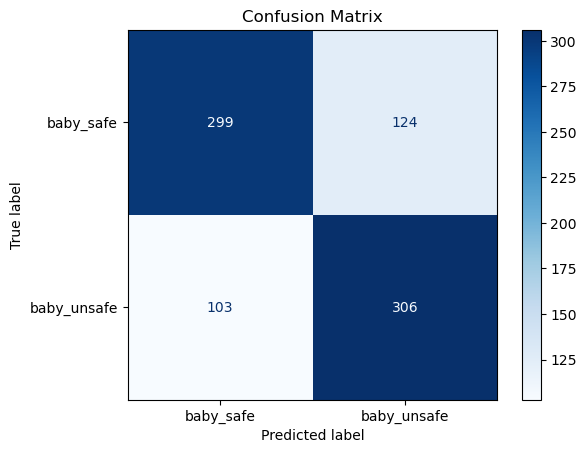

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


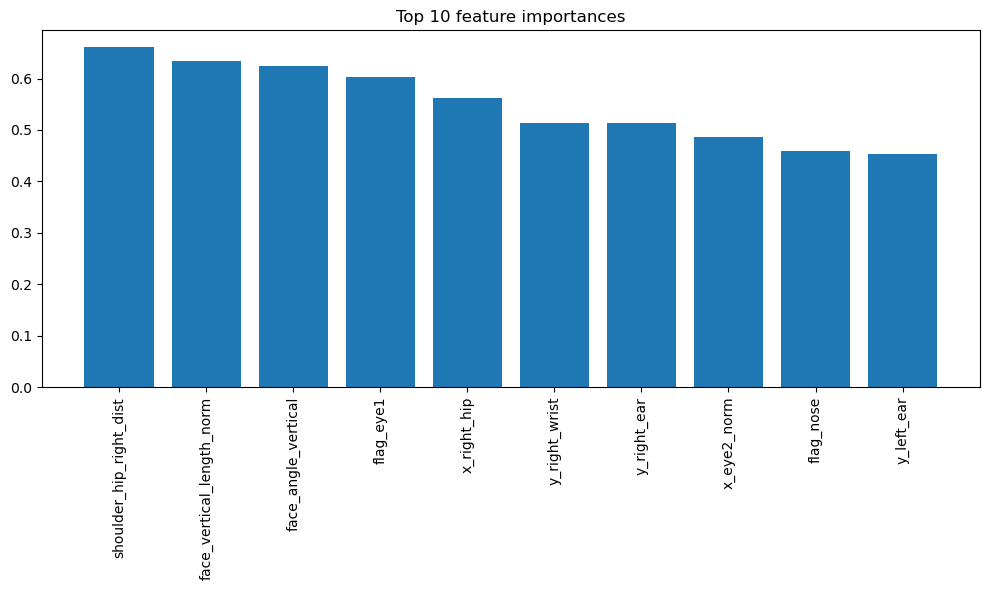

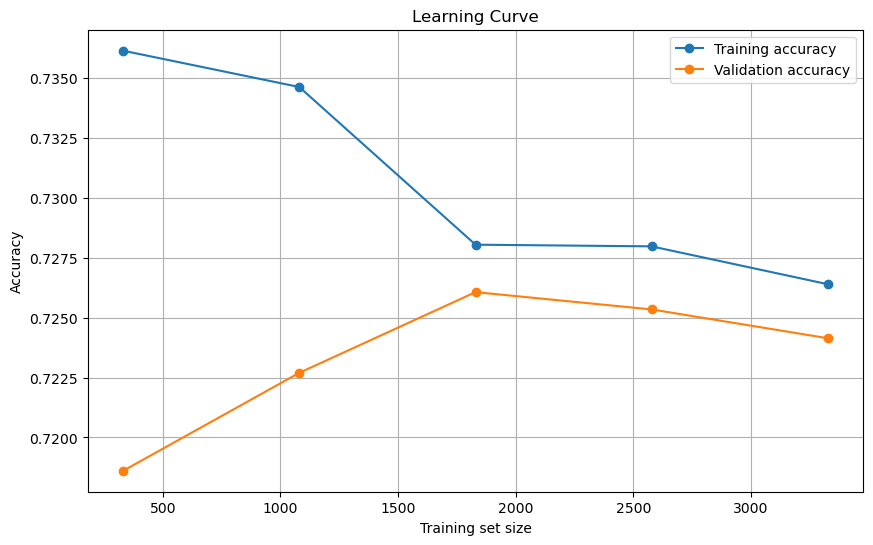


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.70      0.73      0.71       423
 baby_unsafe       0.70      0.68      0.69       409

    accuracy                           0.70       832
   macro avg       0.70      0.70      0.70       832
weighted avg       0.70      0.70      0.70       832

Confusion matrix---------------------------------------


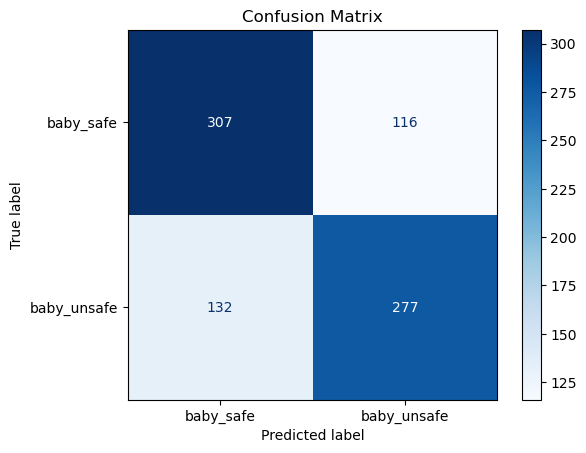

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


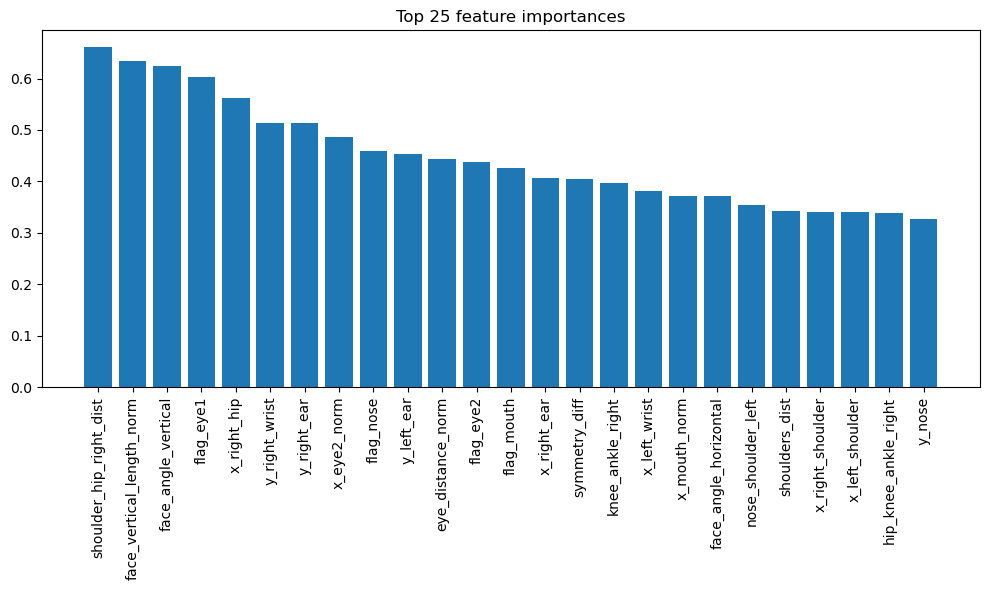

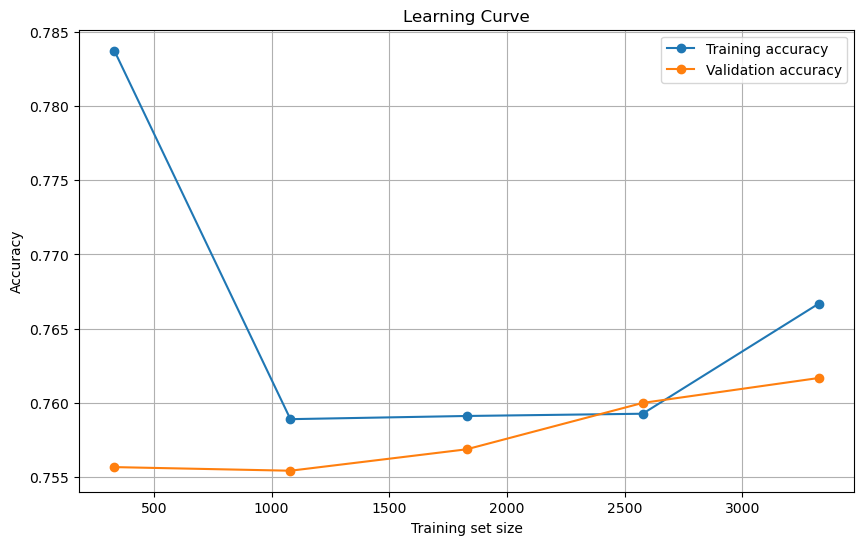


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.77      0.69      0.73       423
 baby_unsafe       0.71      0.79      0.75       409

    accuracy                           0.74       832
   macro avg       0.74      0.74      0.74       832
weighted avg       0.74      0.74      0.74       832

Confusion matrix---------------------------------------


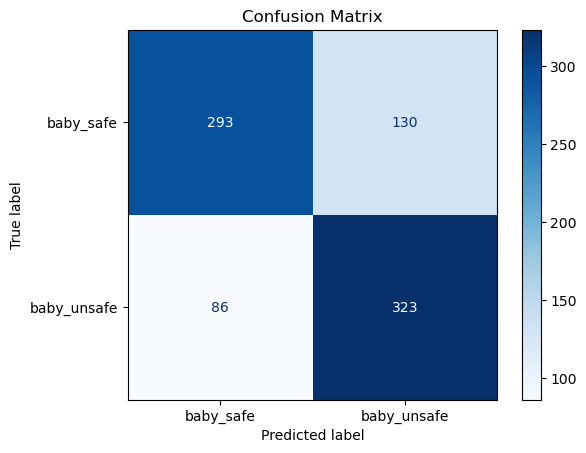

In [74]:
lr_1, results_lr_1 = clf.logistic_regression(verbose=True)


Start random search...

Random Search Results:
Best parameters found:  {'C': np.float64(1.6068111664741074), 'penalty': 'l2', 'solver': 'liblinear'}
Best mean cross-validation accuracy:  0.7612666802140486
------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


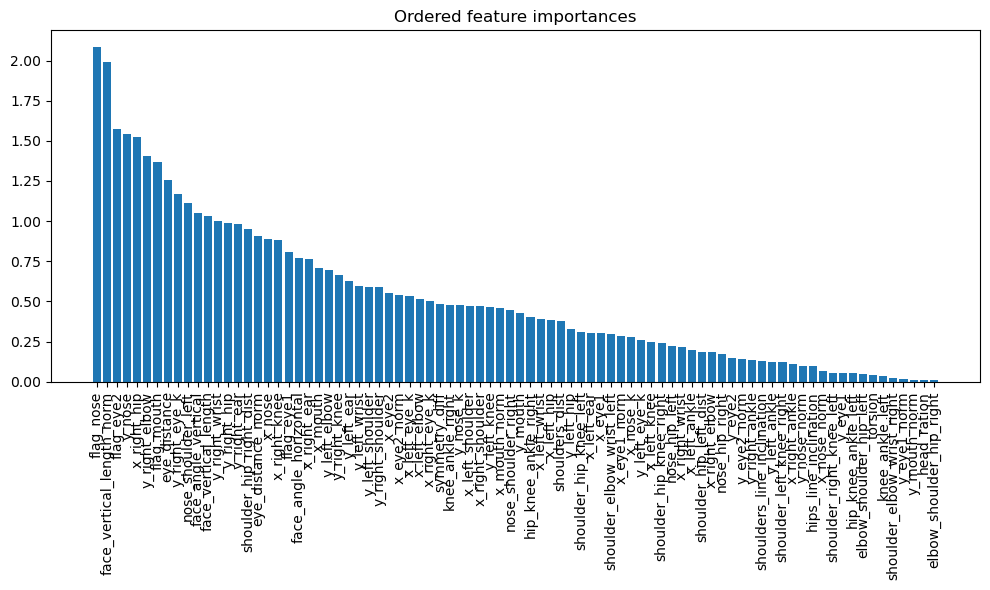

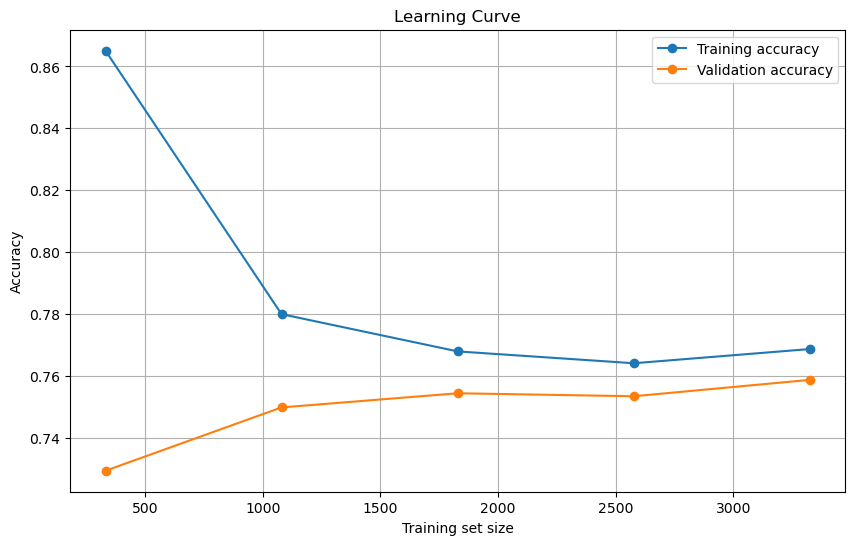


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.76      0.71      0.74       423
 baby_unsafe       0.72      0.77      0.74       409

    accuracy                           0.74       832
   macro avg       0.74      0.74      0.74       832
weighted avg       0.74      0.74      0.74       832

Confusion matrix---------------------------------------


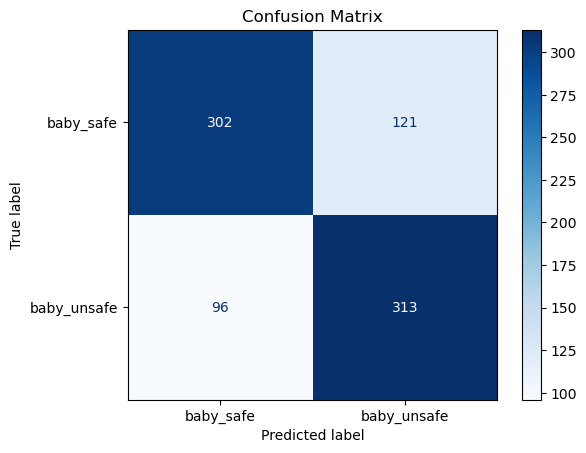

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


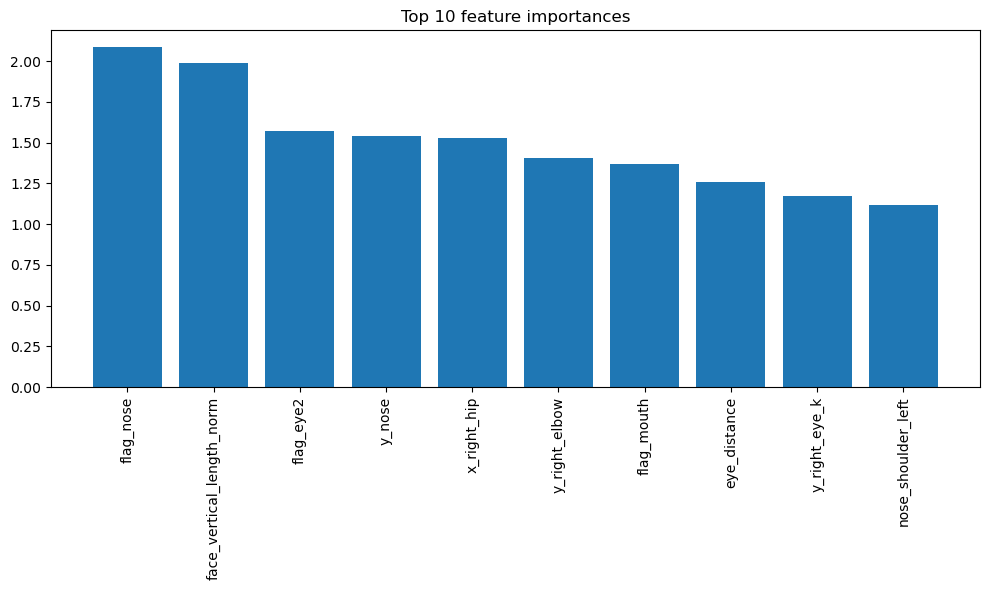

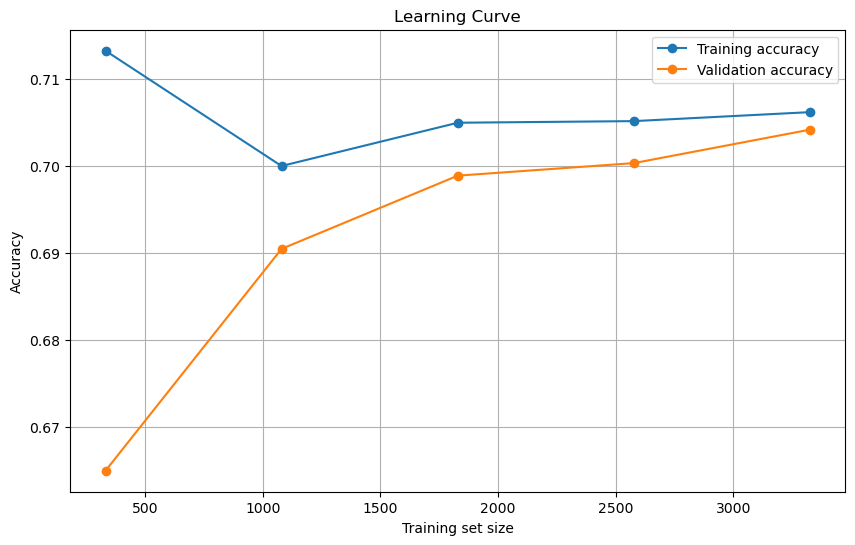


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.73      0.56      0.63       423
 baby_unsafe       0.63      0.78      0.70       409

    accuracy                           0.67       832
   macro avg       0.68      0.67      0.67       832
weighted avg       0.68      0.67      0.67       832

Confusion matrix---------------------------------------


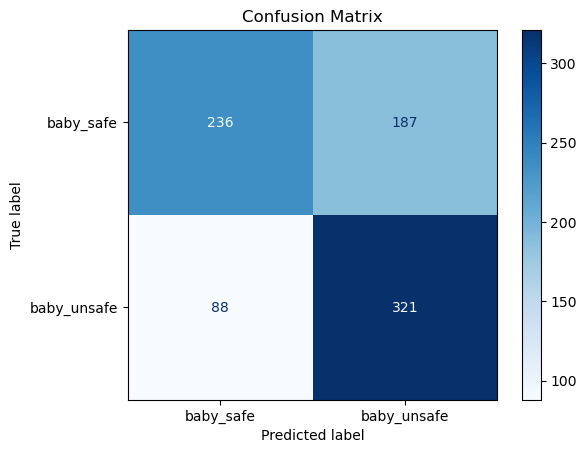

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


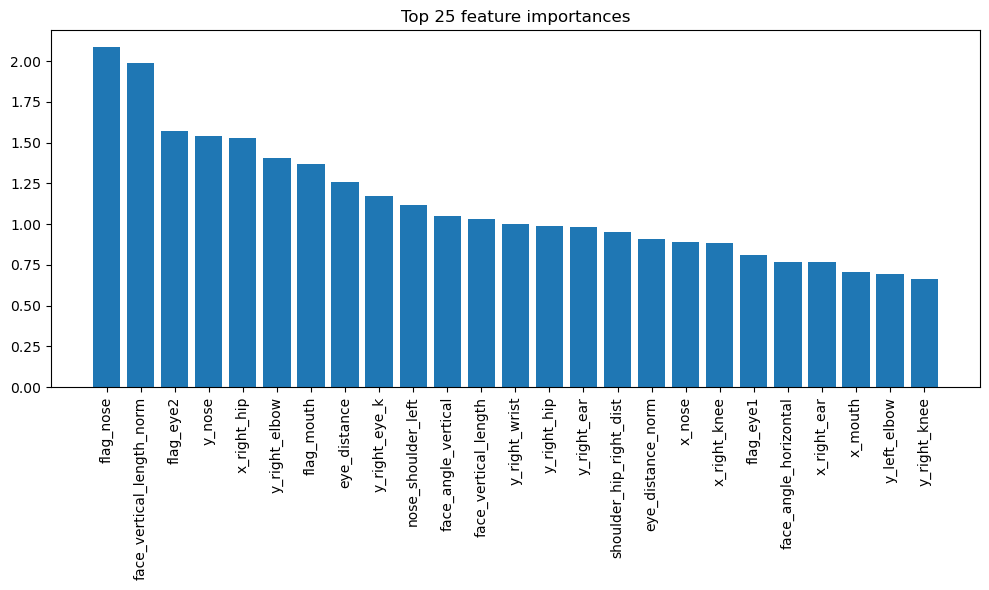

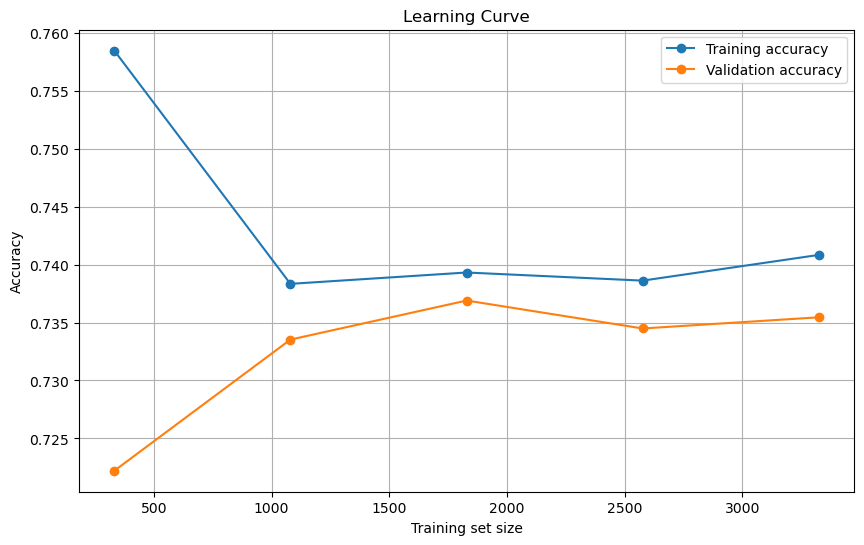


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.72      0.72      0.72       423
 baby_unsafe       0.71      0.71      0.71       409

    accuracy                           0.72       832
   macro avg       0.72      0.72      0.72       832
weighted avg       0.72      0.72      0.72       832

Confusion matrix---------------------------------------


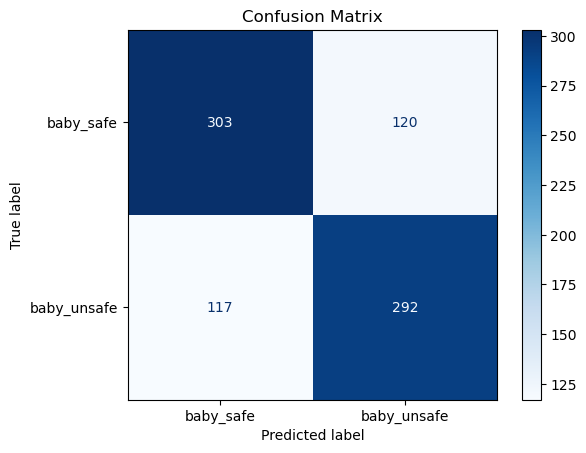

In [75]:
from scipy.stats import loguniform
from sklearn.linear_model import LogisticRegression

from scipy.stats import loguniform

param_grid = [
    {
        'solver': ['liblinear'],
        'penalty': ['l1', 'l2'],
        'C': loguniform(0.001, 1000)
    },
    {
        'solver': ['saga'],
        'penalty': ['l1', 'l2'],
        'C': loguniform(0.001, 1000)
    },
    {
        'solver': ['saga'],
        'penalty': ['elasticnet'],
        'C': loguniform(0.001, 1000),
        'l1_ratio': [0.1, 0.5, 0.9]
    }
]
best_params = clf.optimize_model(lr_1, param_grid,verbose=False)
lr_2 = LogisticRegression(**best_params)
results_lr_2 = clf.evaluation_pipeline(lr_2,verbose=True)

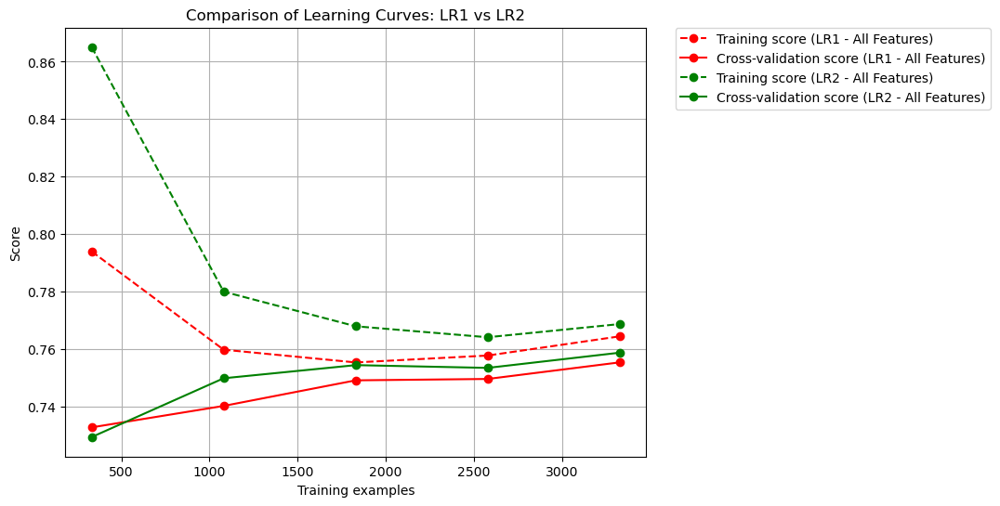

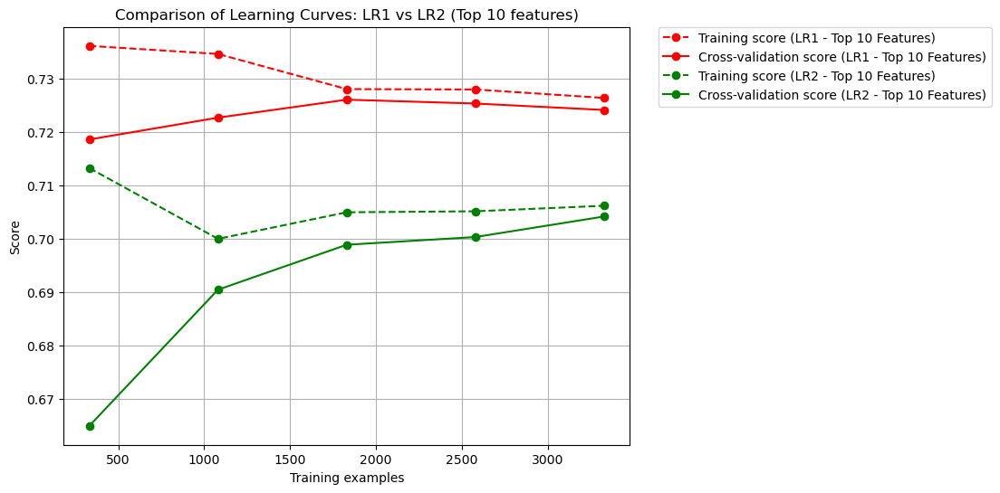

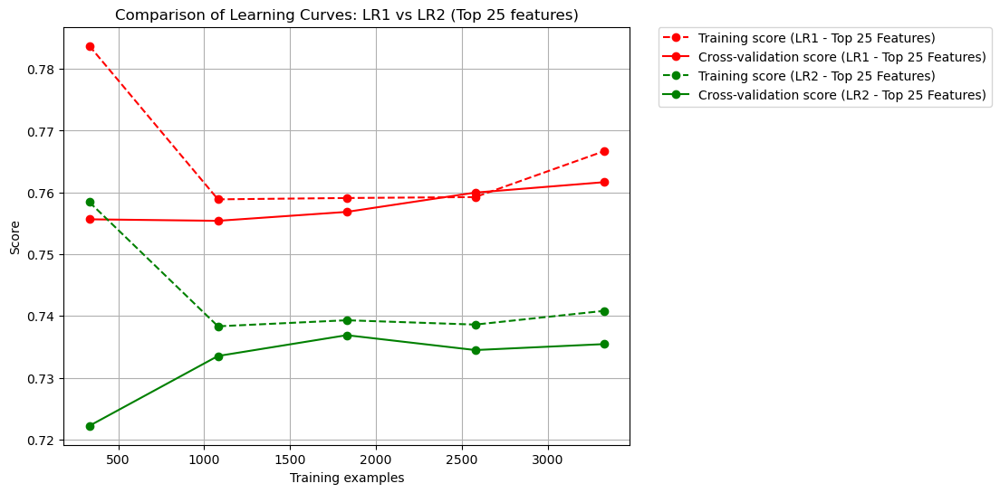

In [81]:
# Graph 1:
data_to_plot_1 = [
    (results_lr_1['all_features']['model'], "LR1 - All Features", results_lr_1['all_features']['X'], results_lr_1['all_features']['y']),
    (results_lr_2['all_features']['model'], "LR2 - All Features", results_lr_2['all_features']['X'], results_lr_2['all_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_1,
    title="Comparison of Learning Curves: LR1 vs LR2"
)

# Graph 2:
data_to_plot_2 = [
    (results_lr_1['top_10_features']['model'], "LR1 - Top 10 Features", results_lr_1['top_10_features']['X'], results_lr_1['top_10_features']['y']),
    (results_lr_2['top_10_features']['model'], "LR2 - Top 10 Features", results_lr_2['top_10_features']['X'], results_lr_2['top_10_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_2,
    title="Comparison of Learning Curves: LR1 vs LR2 (Top 10 features)"
)


# Graph 3:
data_to_plot_3 = [
    (results_lr_1['top_25_features']['model'], "LR1 - Top 25 Features", results_lr_1['top_25_features']['X'], results_lr_1['top_25_features']['y']),
    (results_lr_2['top_25_features']['model'], "LR2 - Top 25 Features", results_lr_2['top_25_features']['X'], results_lr_2['top_25_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_3,
    title="Comparison of Learning Curves: LR1 vs LR2 (Top 25 features)"
)

# 3) Random Forest


------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


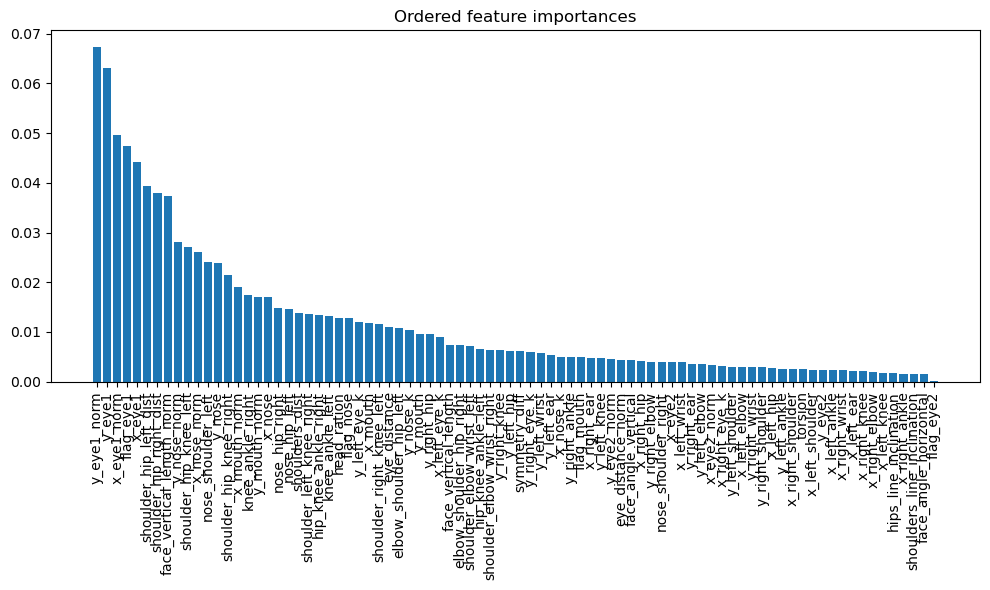

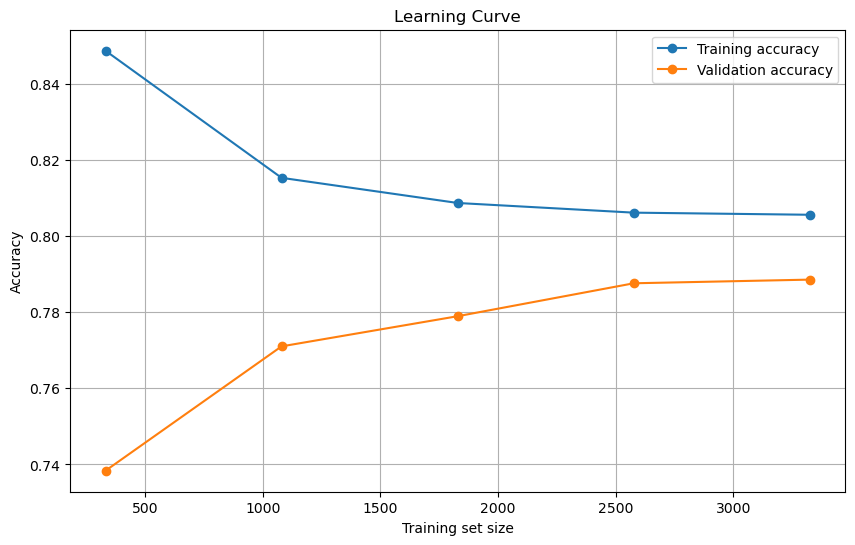


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.86      0.68      0.76       423
 baby_unsafe       0.73      0.89      0.80       409

    accuracy                           0.78       832
   macro avg       0.80      0.78      0.78       832
weighted avg       0.80      0.78      0.78       832

Confusion matrix---------------------------------------


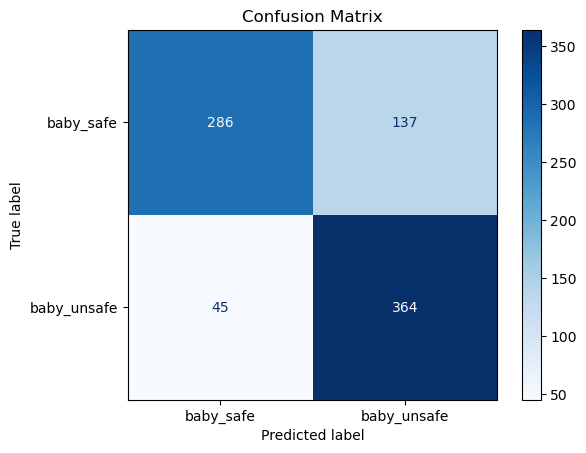

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


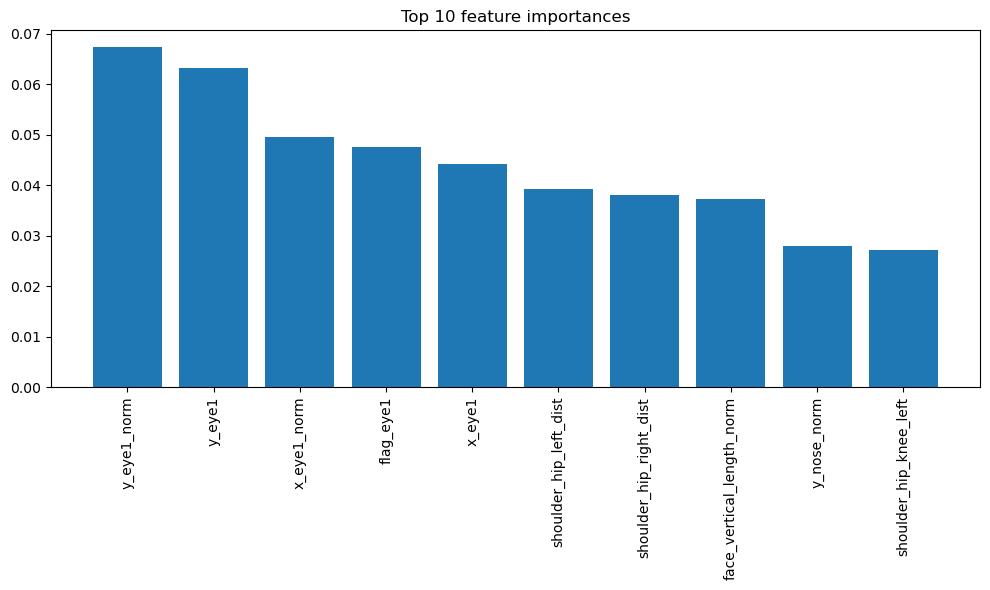

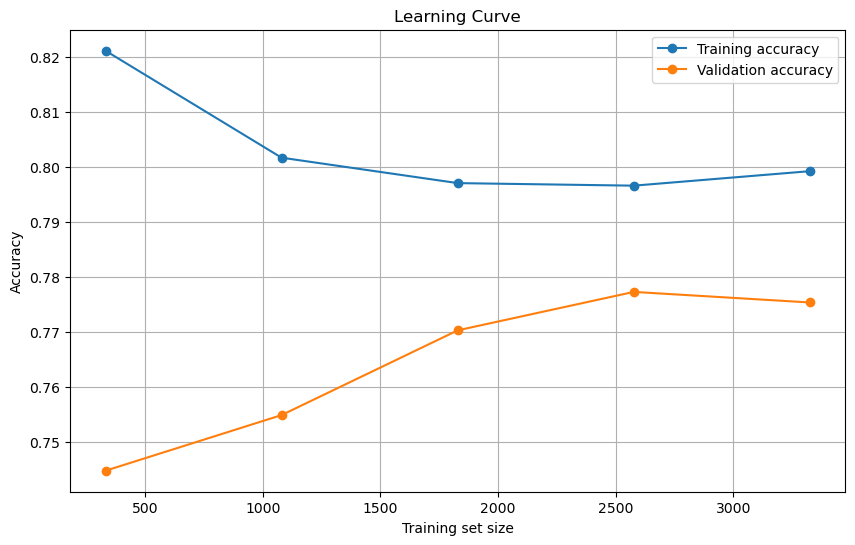


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.84      0.71      0.77       423
 baby_unsafe       0.74      0.86      0.80       409

    accuracy                           0.78       832
   macro avg       0.79      0.78      0.78       832
weighted avg       0.79      0.78      0.78       832

Confusion matrix---------------------------------------


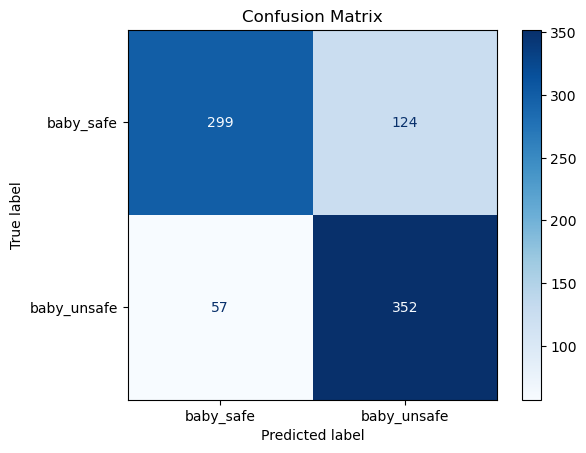

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


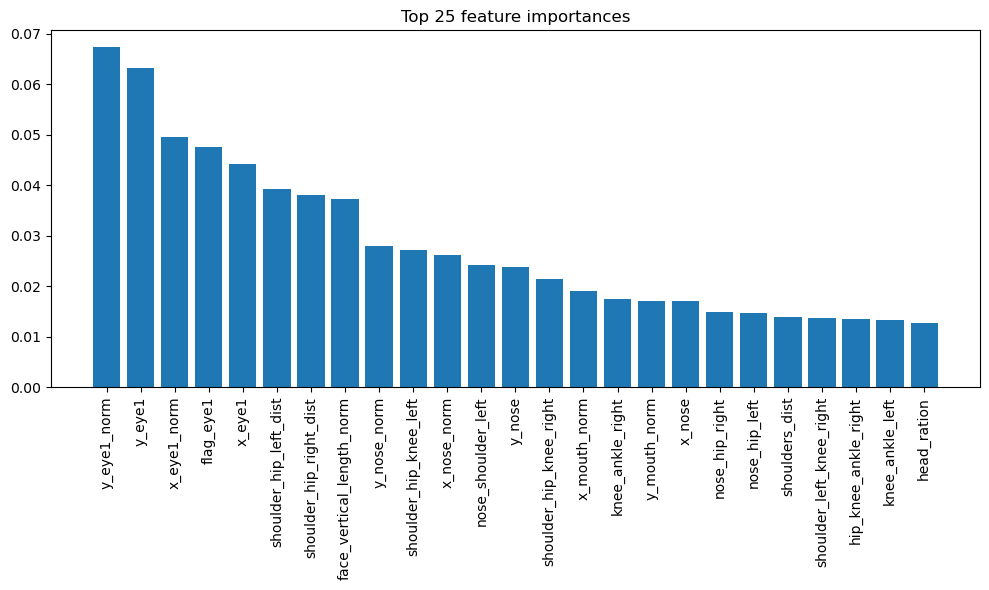

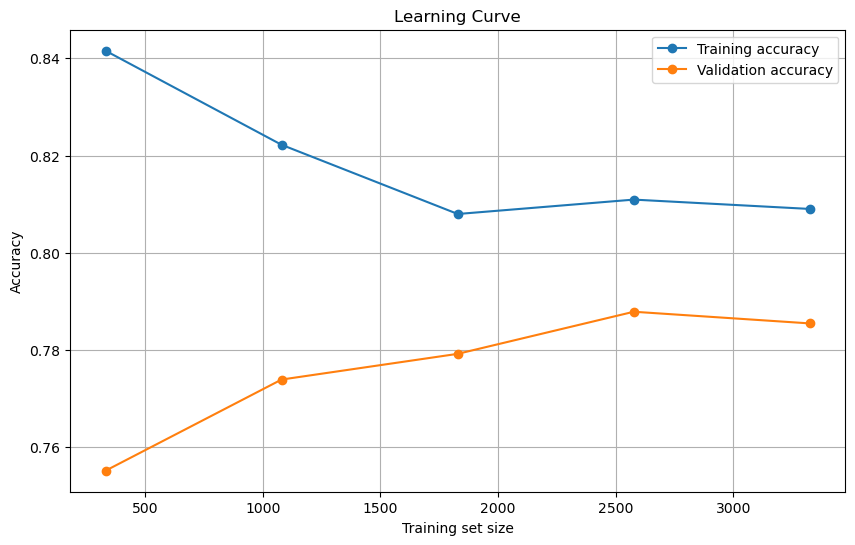


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.86      0.69      0.76       423
 baby_unsafe       0.73      0.88      0.80       409

    accuracy                           0.78       832
   macro avg       0.79      0.78      0.78       832
weighted avg       0.79      0.78      0.78       832

Confusion matrix---------------------------------------


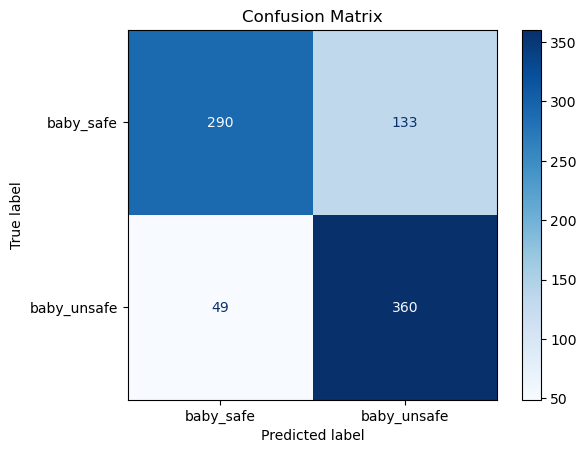

In [77]:
random_forest_1, results_rf1 = clf.random_forest(verbose=True)


Start random search...

Random Search Results:
Best parameters found:  {'bootstrap': False, 'criterion': 'entropy', 'max_depth': 23, 'max_features': 'log2', 'max_samples': None, 'min_samples_leaf': 1, 'min_samples_split': 15, 'n_estimators': 570}
Best mean cross-validation accuracy:  0.8911580753686017
------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


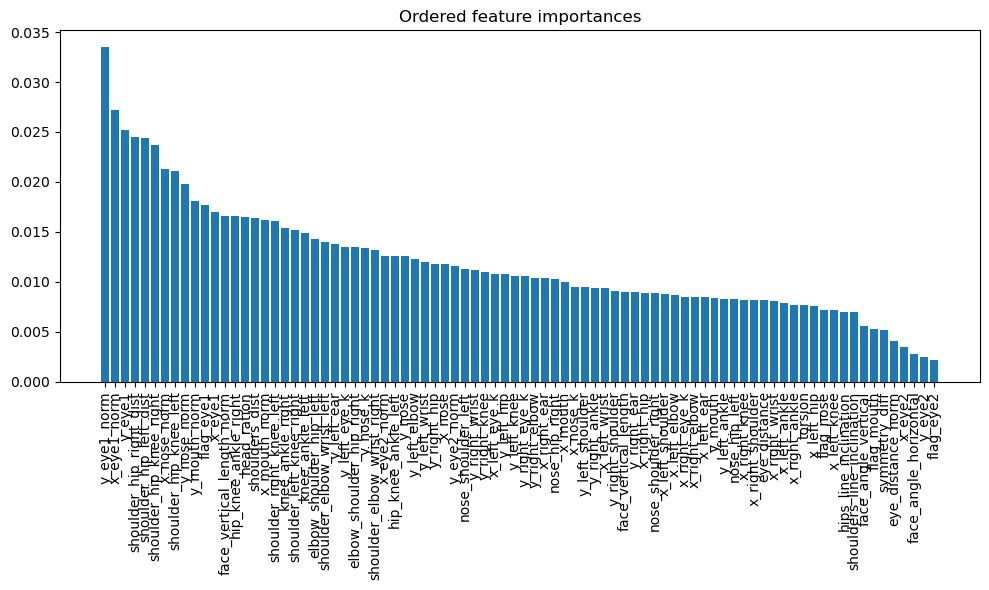

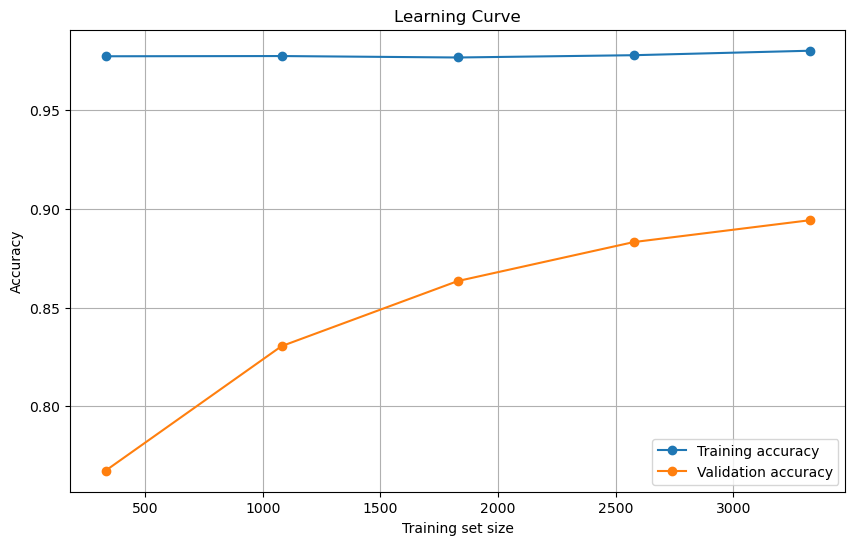


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.86      0.88       423
 baby_unsafe       0.86      0.90      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


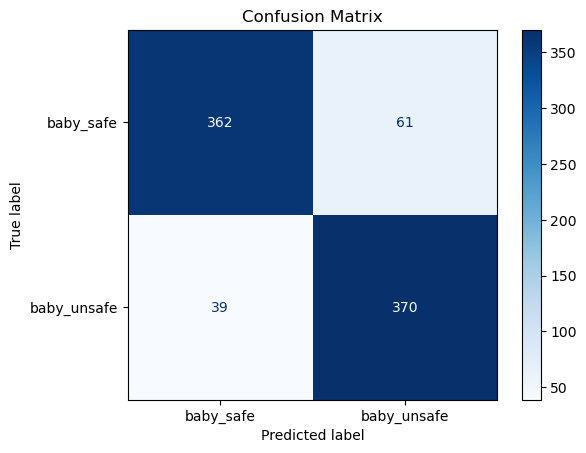

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


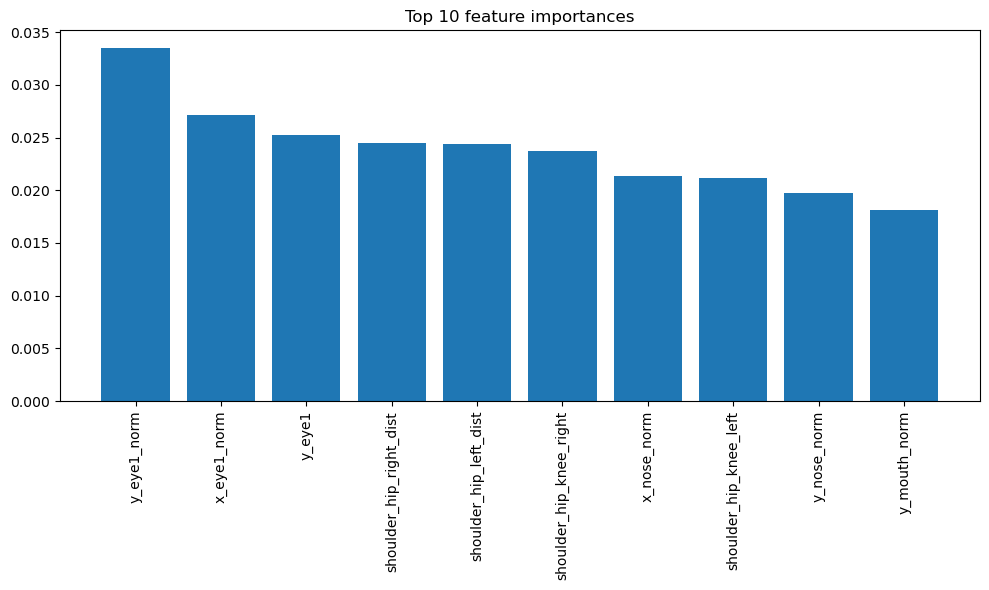

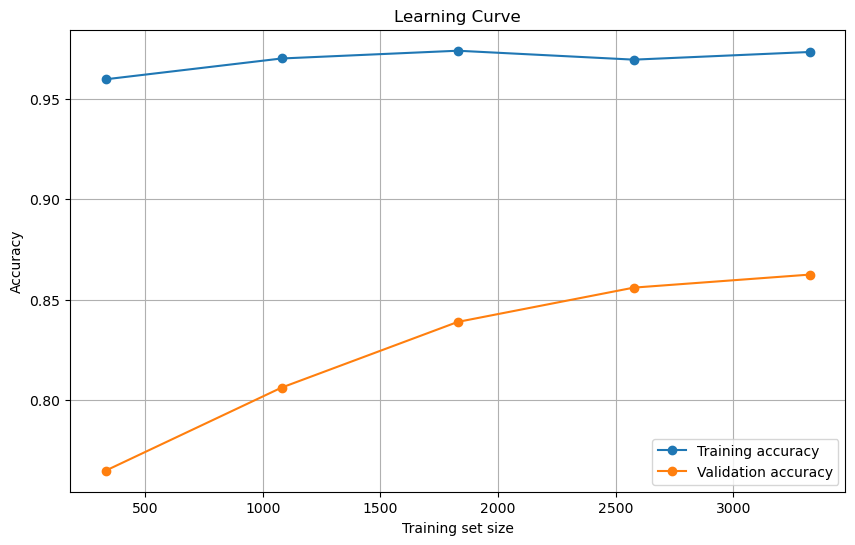


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.88      0.84      0.86       423
 baby_unsafe       0.84      0.88      0.86       409

    accuracy                           0.86       832
   macro avg       0.86      0.86      0.86       832
weighted avg       0.86      0.86      0.86       832

Confusion matrix---------------------------------------


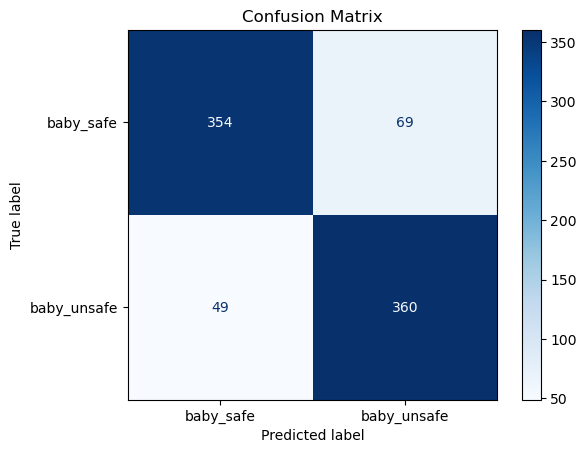

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


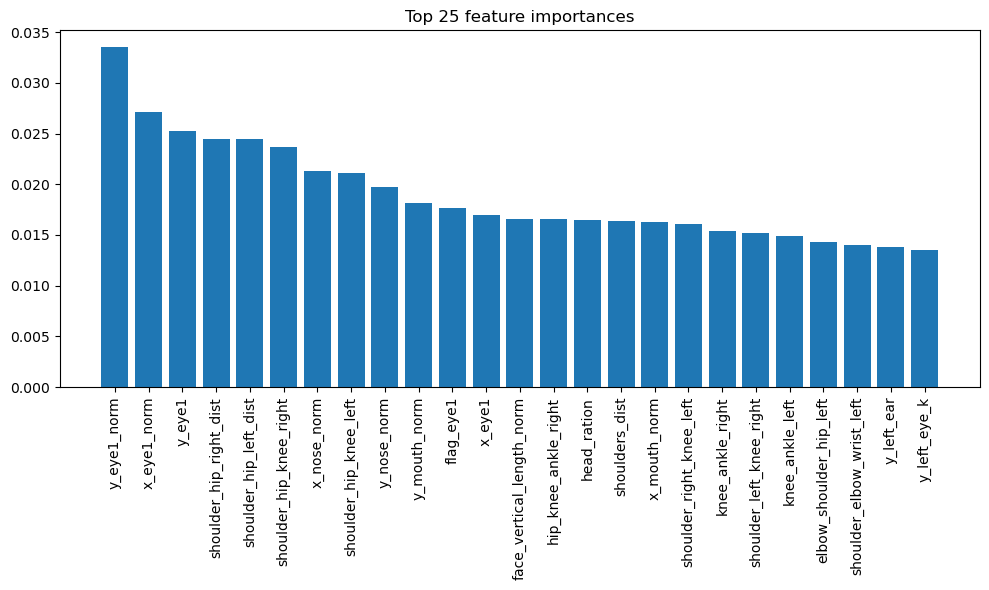

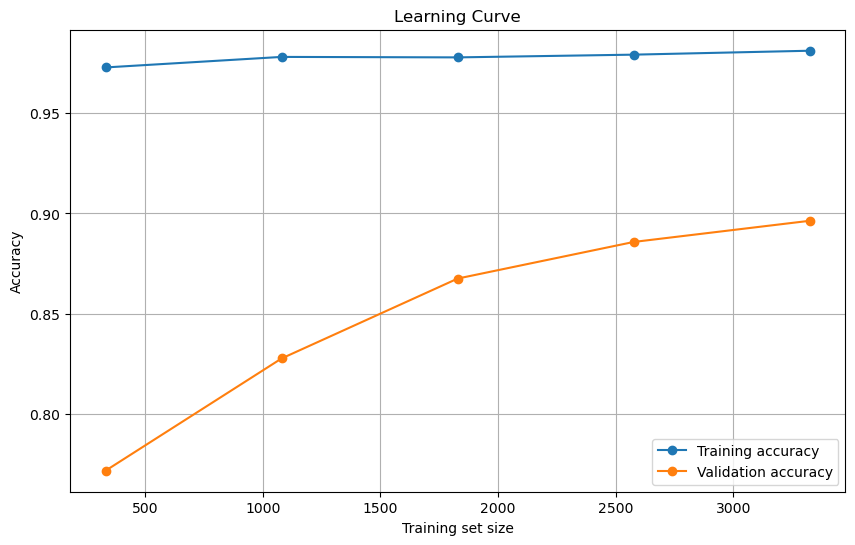


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.86      0.88       423
 baby_unsafe       0.86      0.90      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


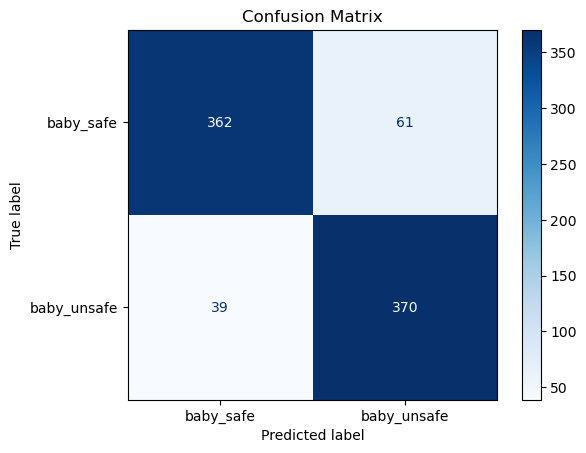

In [78]:
param_dist = [
    # Bootstrap = True (max_samples valido)
    {
        'n_estimators': randint(200, 1000),
        'max_depth': randint(5, 50),
        'min_samples_split': randint(2, 40),
        'min_samples_leaf': randint(1, 25),
        'max_features': ['sqrt', 'log2', 0.5, 0.7, 0.9, None],
        'criterion': ['gini', 'entropy'],
        'bootstrap': [True],
        'max_samples': uniform(0.5, 0.5)  # fra 0.5 e 1.0
    },
    # Bootstrap = False (max_samples deve essere None)
    {
        'n_estimators': randint(200, 1000),
        'max_depth': randint(5, 50),
        'min_samples_split': randint(2, 40),
        'min_samples_leaf': randint(1, 25),
        'max_features': ['sqrt', 'log2', 0.5, 0.7, 0.9, None],
        'criterion': ['gini', 'entropy'],
        'bootstrap': [False],
        'max_samples': [None]
    }
]

best_params = clf.optimize_model(random_forest_1, param_dist,verbose=False)
random_forest_2 = RandomForestClassifier(**best_params)
results_rf2 = clf.evaluation_pipeline(random_forest_2,verbose=True)

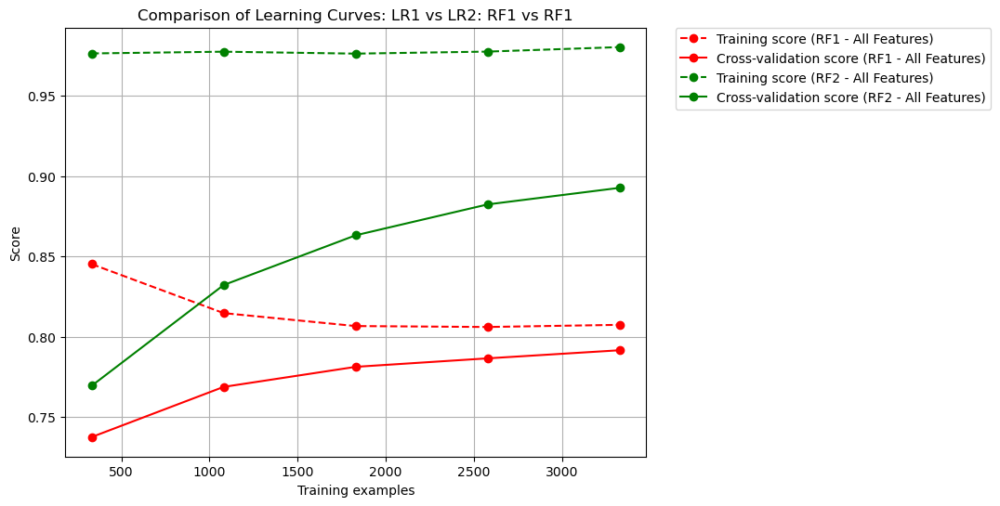

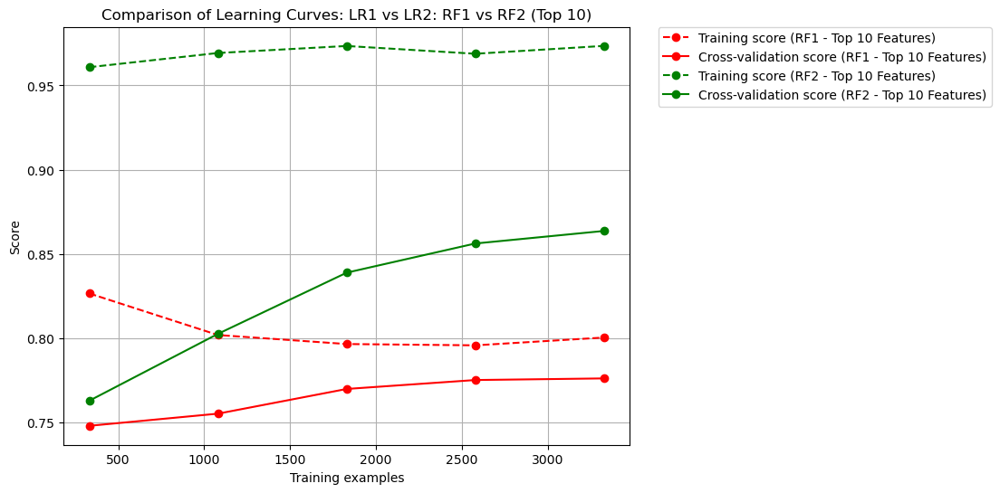

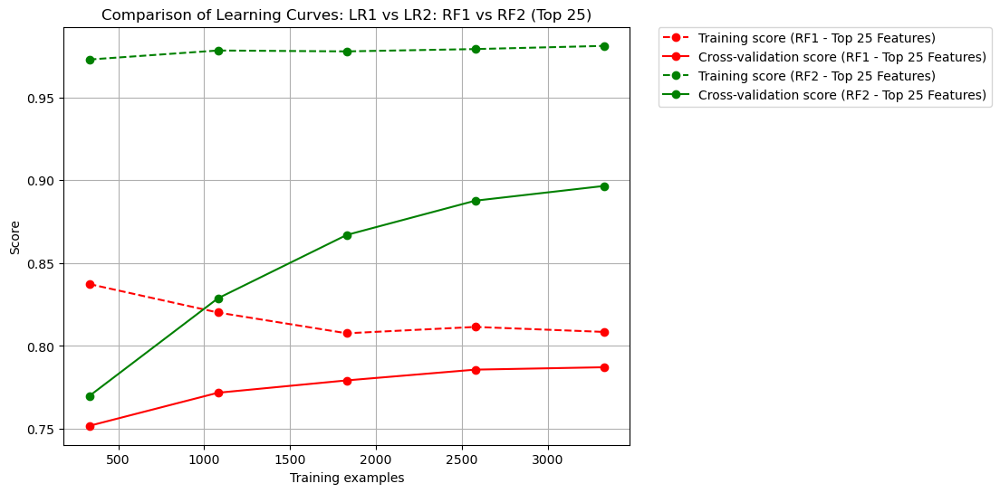

In [82]:
# Graph 1:
data_to_plot_1 = [
    (results_rf1['all_features']['model'], "RF1 - All Features", results_rf1['all_features']['X'], results_rf1['all_features']['y']),
    (results_rf2['all_features']['model'], "RF2 - All Features", results_rf2['all_features']['X'], results_rf2['all_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_1,
    title="Comparison of Learning Curves: LR1 vs LR2: RF1 vs RF1"
)

# Graph 2:
data_to_plot_2 = [
    (results_rf1['top_10_features']['model'], "RF1 - Top 10 Features", results_rf1['top_10_features']['X'], results_rf1['top_10_features']['y']),
    (results_rf2['top_10_features']['model'], "RF2 - Top 10 Features", results_rf2['top_10_features']['X'], results_rf2['top_10_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_2,
    title="Comparison of Learning Curves: LR1 vs LR2: RF1 vs RF2 (Top 10)"
)

# Graph 3:
data_to_plot_2 = [
    (results_rf1['top_25_features']['model'], "RF1 - Top 25 Features", results_rf1['top_25_features']['X'], results_rf1['top_25_features']['y']),
    (results_rf2['top_25_features']['model'], "RF2 - Top 25 Features", results_rf2['top_25_features']['X'], results_rf2['top_25_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_2,
    title="Comparison of Learning Curves: LR1 vs LR2: RF1 vs RF2 (Top 25)"
)

# 4) XGBC

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


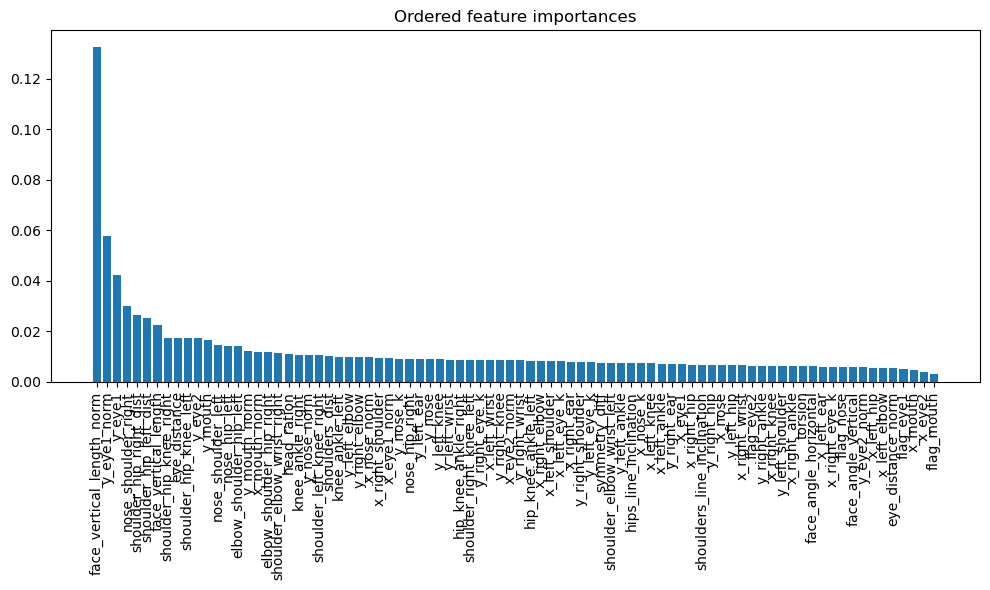

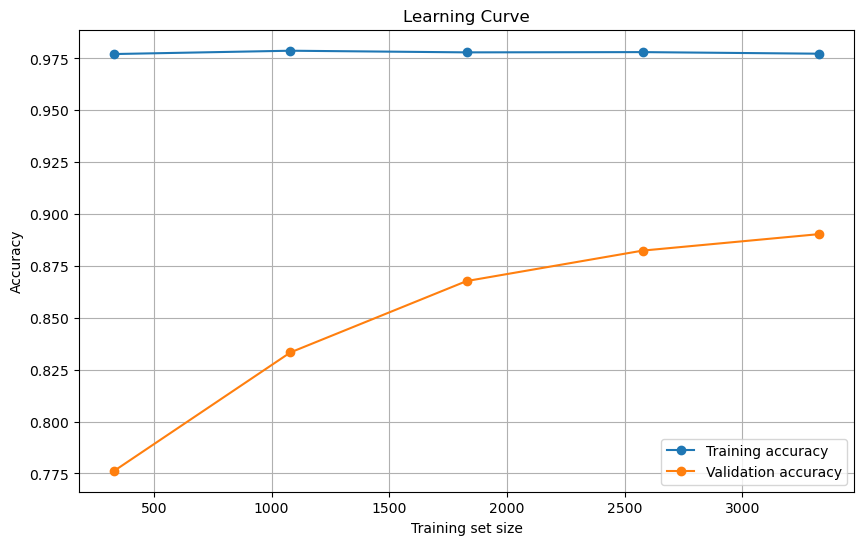


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.92      0.87      0.89       423
 baby_unsafe       0.87      0.92      0.89       409

    accuracy                           0.89       832
   macro avg       0.89      0.89      0.89       832
weighted avg       0.90      0.89      0.89       832

Confusion matrix---------------------------------------


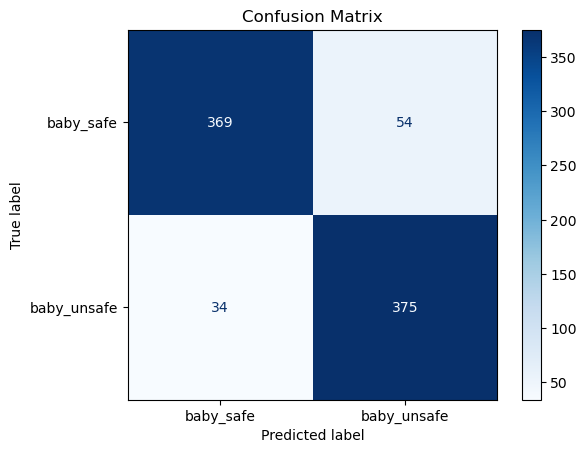

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


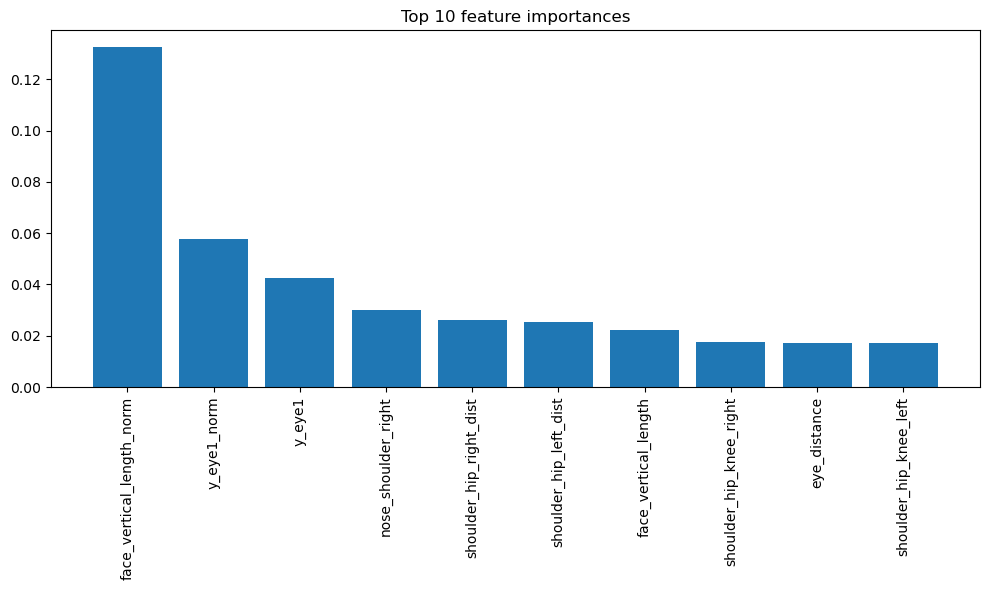

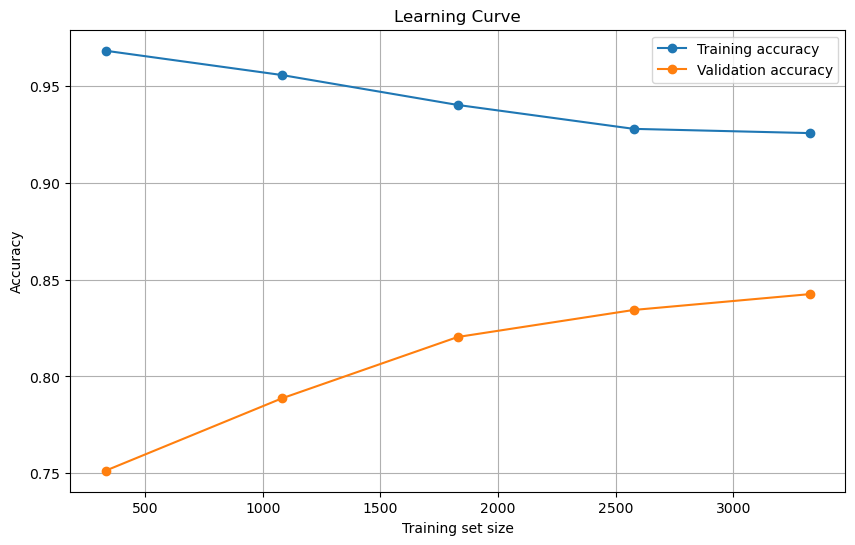


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.85      0.80      0.83       423
 baby_unsafe       0.81      0.86      0.83       409

    accuracy                           0.83       832
   macro avg       0.83      0.83      0.83       832
weighted avg       0.83      0.83      0.83       832

Confusion matrix---------------------------------------


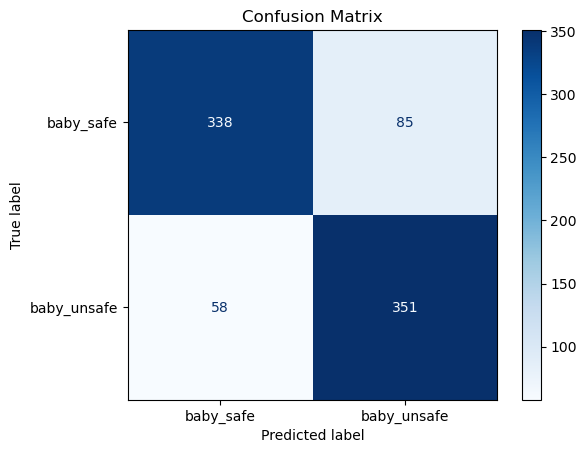

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


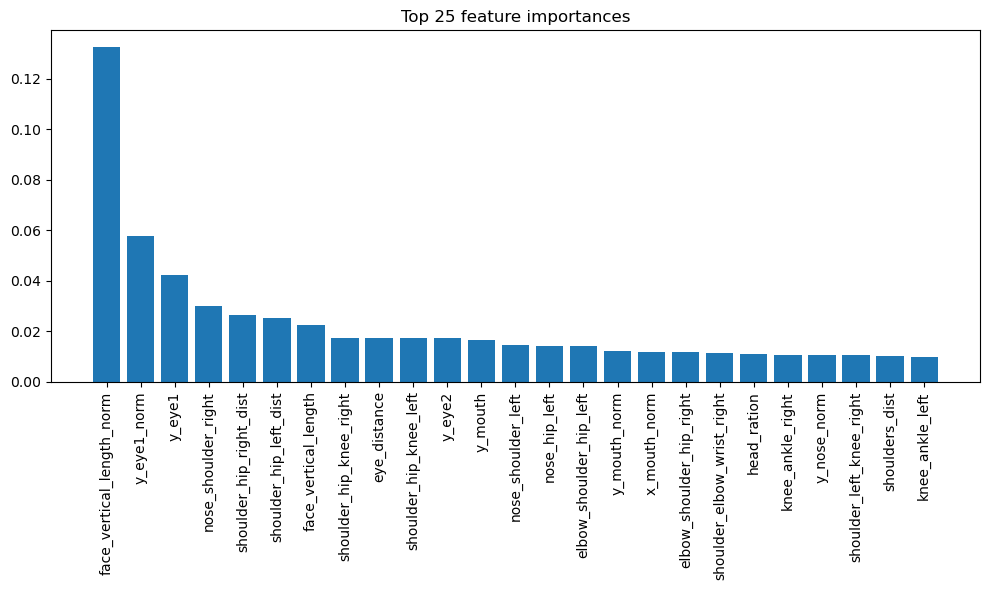

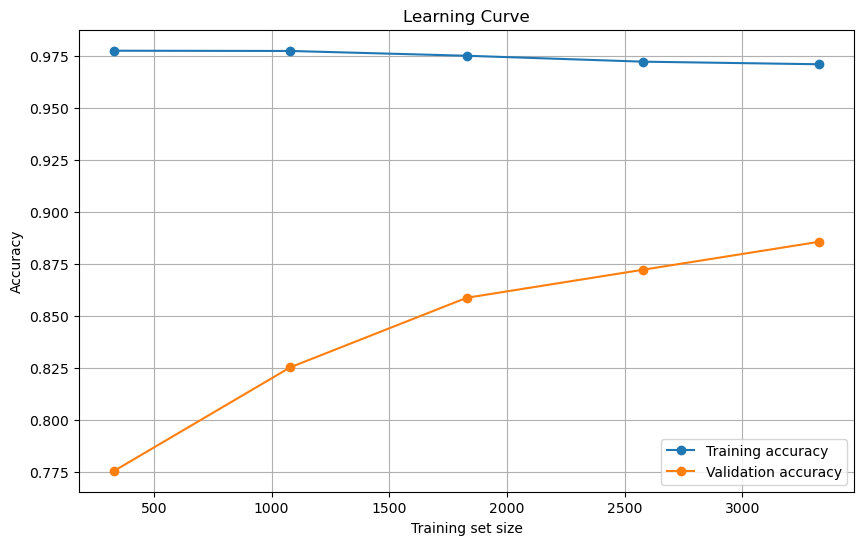


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.89      0.85      0.87       423
 baby_unsafe       0.85      0.89      0.87       409

    accuracy                           0.87       832
   macro avg       0.87      0.87      0.87       832
weighted avg       0.87      0.87      0.87       832

Confusion matrix---------------------------------------


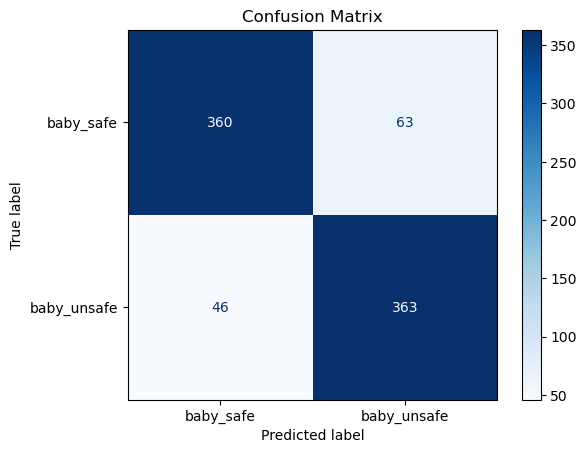

In [4]:
xgbc_1, results_xgbc_1 = clf.XGBC(verbose=True)


Start random search...

Random Search Results:
Best parameters found:  {'colsample_bytree': np.float64(0.9942601816442402), 'gamma': np.float64(0.1210276357557502), 'learning_rate': np.float64(0.21164066422176356), 'max_depth': 5, 'n_estimators': 283, 'subsample': np.float64(0.6950550175969599)}
Best mean cross-validation accuracy:  0.89837341100499
------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


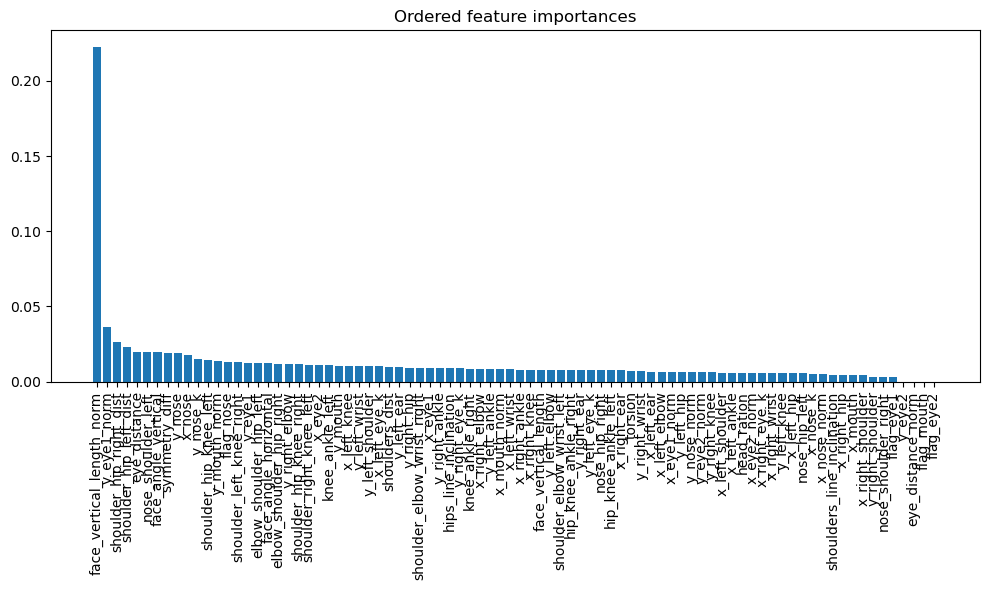

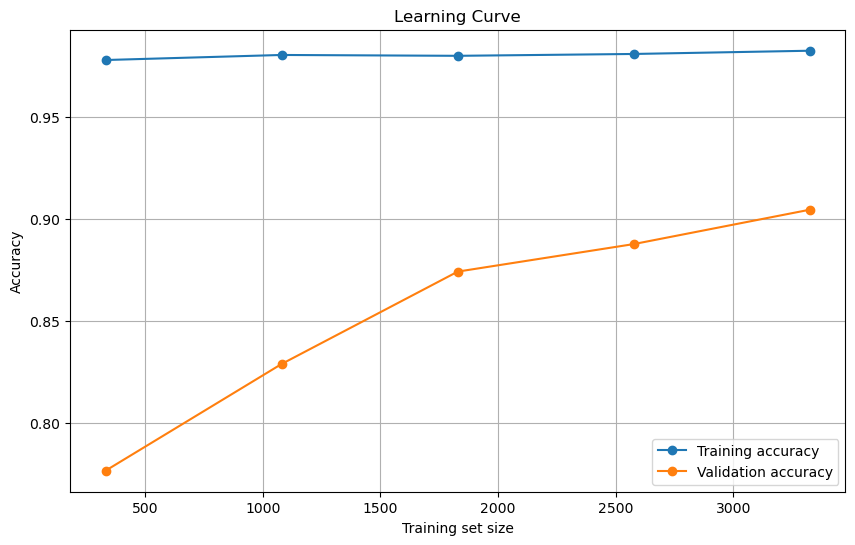


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.91      0.88      0.89       423
 baby_unsafe       0.88      0.91      0.89       409

    accuracy                           0.89       832
   macro avg       0.89      0.89      0.89       832
weighted avg       0.89      0.89      0.89       832

Confusion matrix---------------------------------------


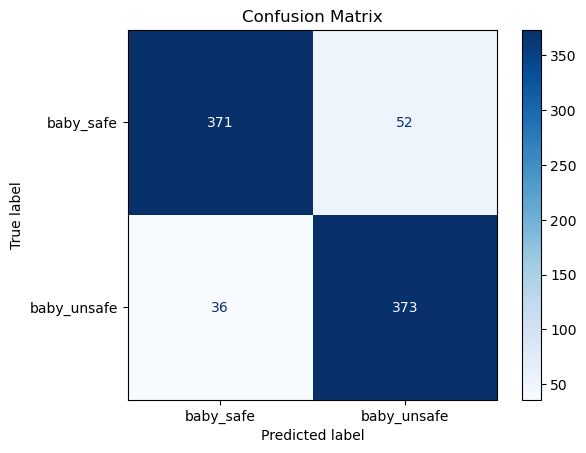

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


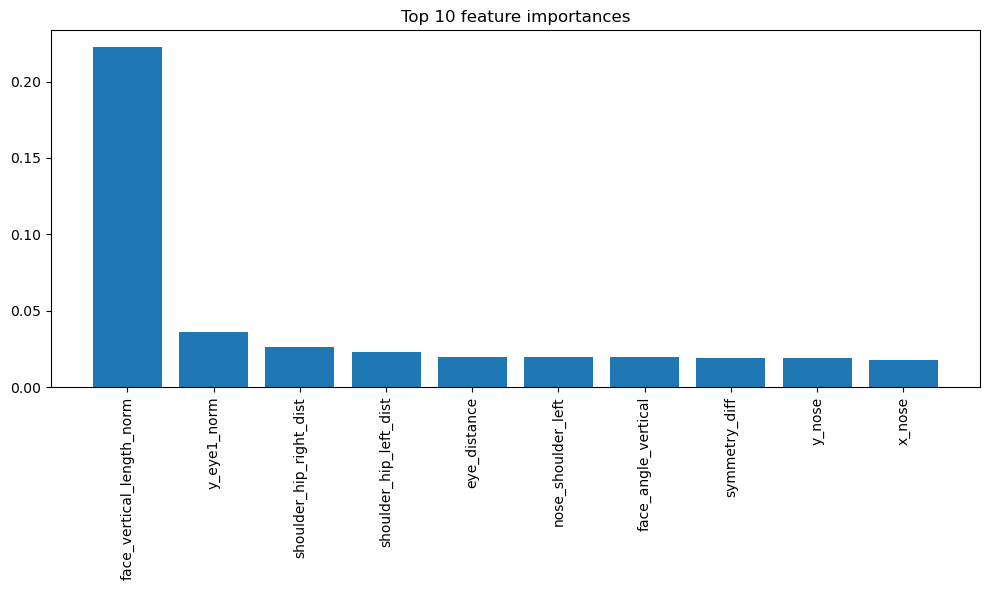

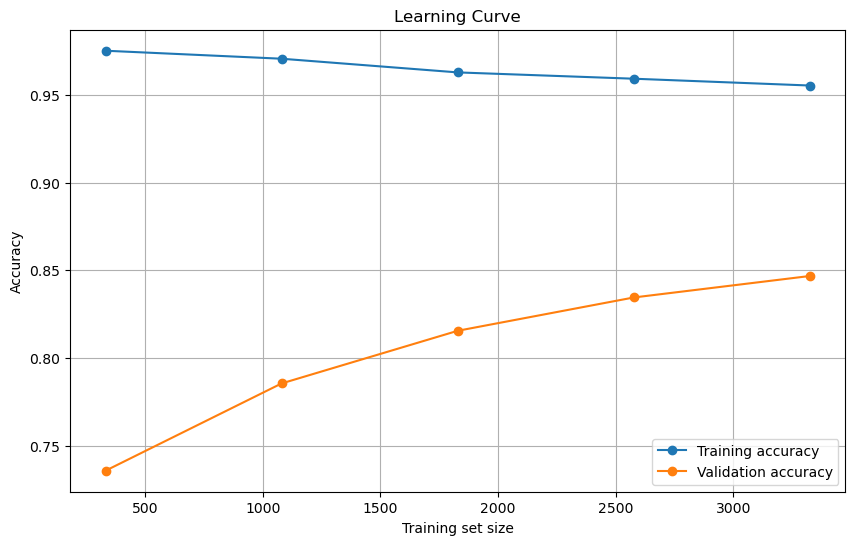


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.82      0.82      0.82       423
 baby_unsafe       0.81      0.82      0.82       409

    accuracy                           0.82       832
   macro avg       0.82      0.82      0.82       832
weighted avg       0.82      0.82      0.82       832

Confusion matrix---------------------------------------


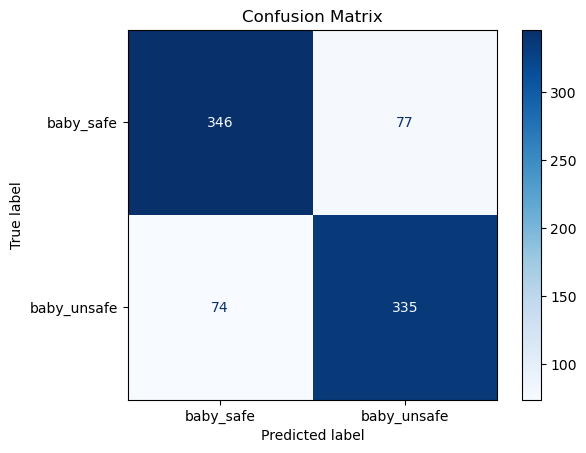

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


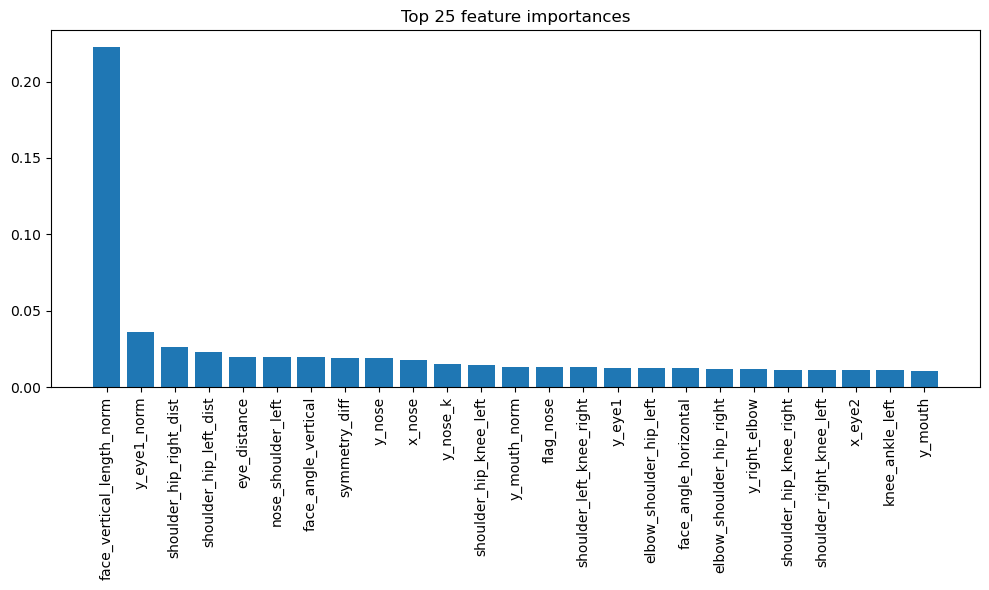

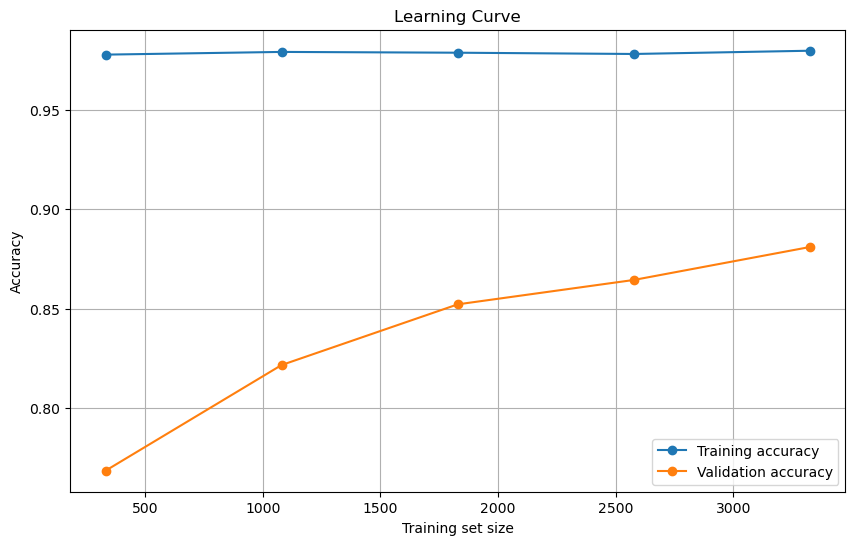


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.88      0.86      0.87       423
 baby_unsafe       0.86      0.88      0.87       409

    accuracy                           0.87       832
   macro avg       0.87      0.87      0.87       832
weighted avg       0.87      0.87      0.87       832

Confusion matrix---------------------------------------


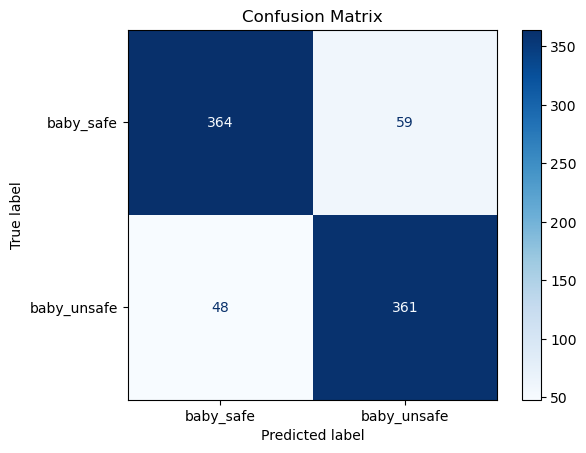

In [7]:
param_dist = {
    'n_estimators': randint(100, 500), # Numero di alberi da costruire
    'learning_rate': uniform(0.01, 0.3), # Passo di apprendimento
    'max_depth': randint(3, 10), # Profondità massima di un albero
    'subsample': uniform(0.6, 0.4), # Frazione di campioni da usare per l'addestramento
    'colsample_bytree': uniform(0.6, 0.4), # Frazione di feature da usare per la costruzione di ogni albero
    'gamma': uniform(0, 0.5) # Riduzione minima della perdita richiesta per fare un'ulteriore partizione
    }
best_params_xgbc = clf.optimize_model(xgbc_1, param_dist,verbose=False)
xgbc_2 = XGBClassifier(**best_params_xgbc)
results_xgbc_2 = clf.evaluation_pipeline(xgbc_2,verbose=True)

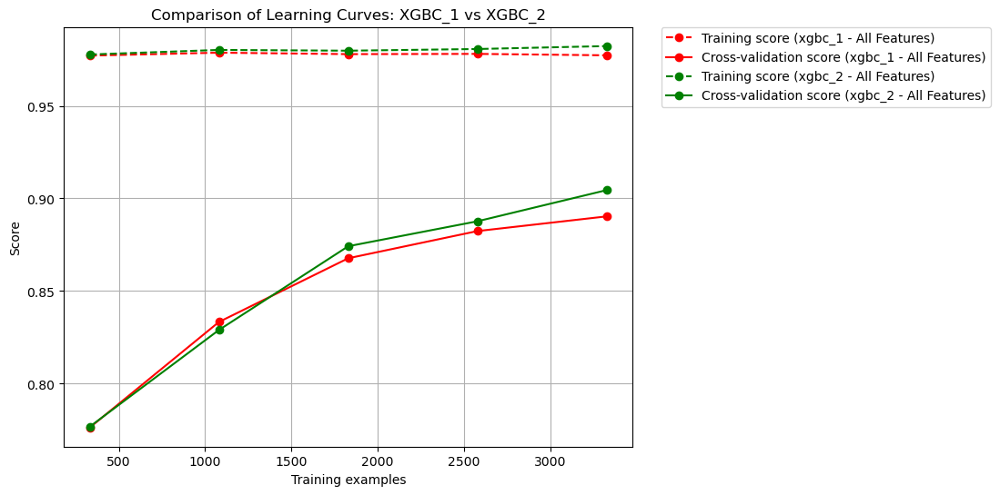

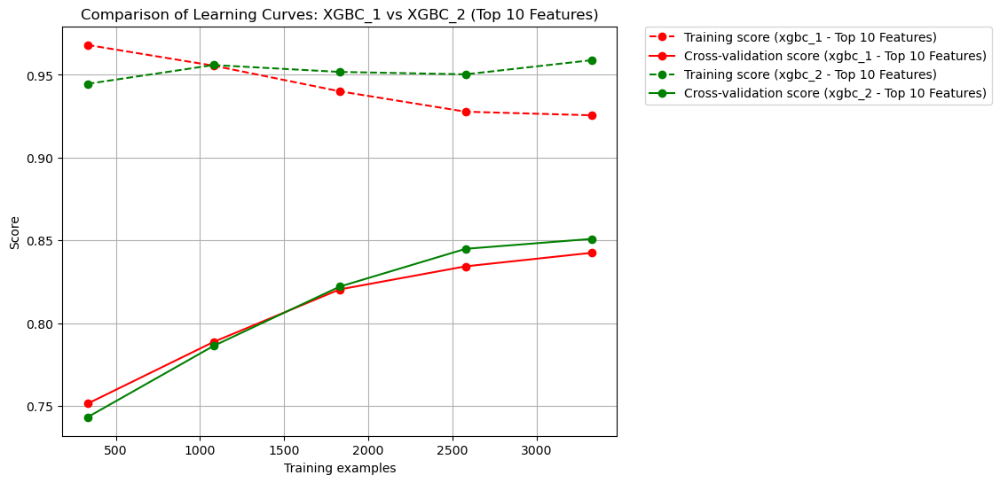

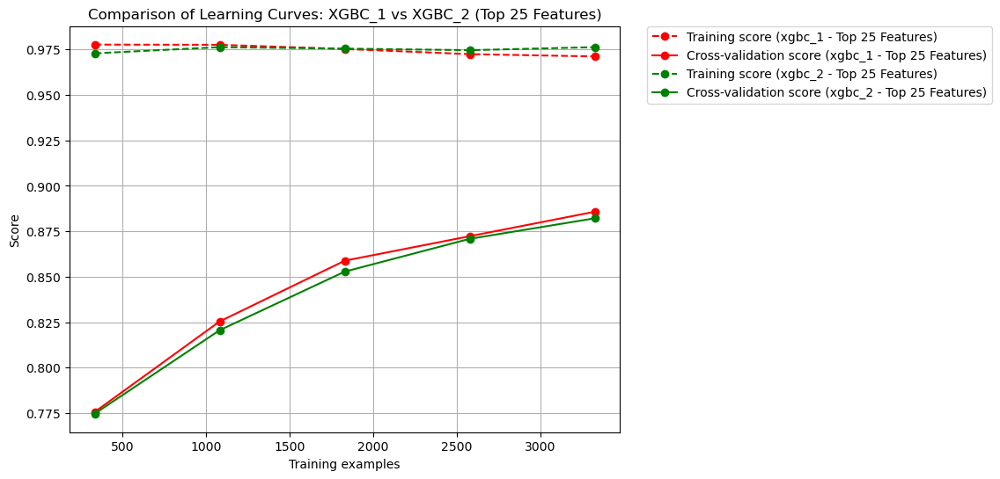

In [83]:
# Graph 1:
data_to_plot_1 = [
    (results_xgbc_1['all_features']['model'], "xgbc_1 - All Features", results_xgbc_1['all_features']['X'], results_xgbc_1['all_features']['y']),
    (results_xgbc_2['all_features']['model'], "xgbc_2 - All Features", results_xgbc_2['all_features']['X'], results_xgbc_2['all_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_1,
    title="Comparison of Learning Curves: XGBC_1 vs XGBC_2"
)

# Graph 2:
data_to_plot_2 = [
    (results_xgbc_1['top_10_features']['model'], "xgbc_1 - Top 10 Features", results_xgbc_1['top_10_features']['X'], results_xgbc_1['top_10_features']['y']),
    (results_rf2['top_10_features']['model'], "xgbc_2 - Top 10 Features", results_xgbc_2['top_10_features']['X'], results_xgbc_2['top_10_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_2,
    title="Comparison of Learning Curves: XGBC_1 vs XGBC_2 (Top 10 Features)"
)

# Graph 3:
data_to_plot_2 = [
    (results_xgbc_1['top_25_features']['model'], "xgbc_1 - Top 25 Features", results_xgbc_1['top_25_features']['X'], results_xgbc_1['top_25_features']['y']),
    (results_rf2['top_25_features']['model'], "xgbc_2 - Top 25 Features", results_xgbc_2['top_25_features']['X'], results_xgbc_2['top_25_features']['y'])
]

clf.plot_learning_curve_comparison(
    data_sets=data_to_plot_2,
    title="Comparison of Learning Curves: XGBC_1 vs XGBC_2 (Top 25 Features)"
)

# 5) Bagging

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


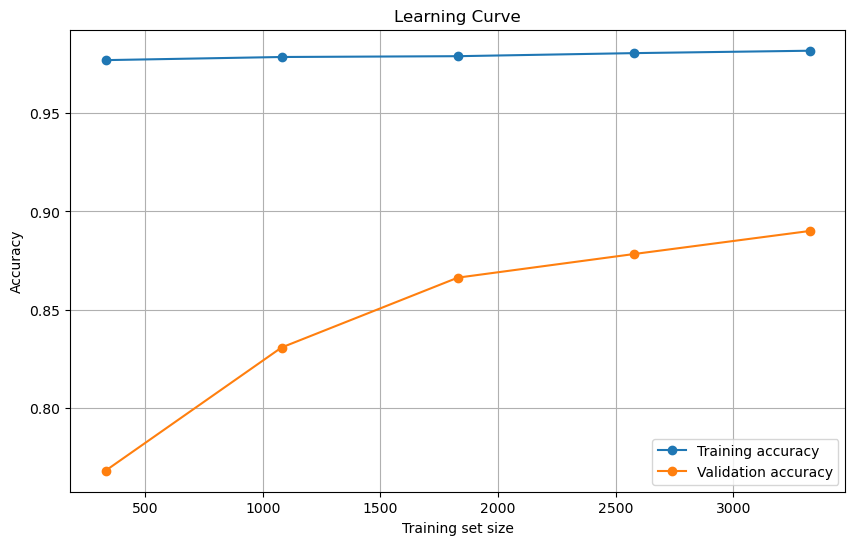


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.86      0.88       423
 baby_unsafe       0.86      0.90      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


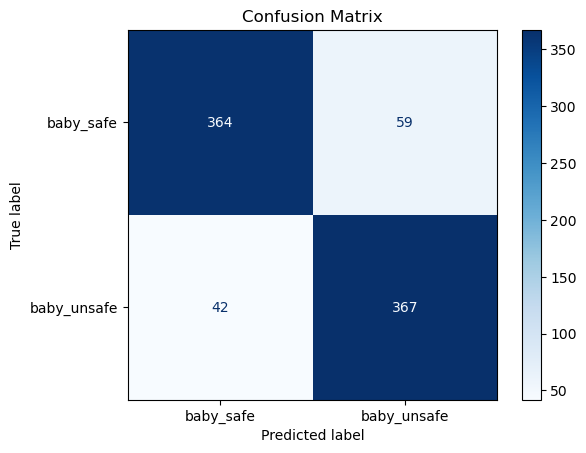

In [84]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
base_clf = DecisionTreeClassifier(random_state=42)
bagging_1, results_bag_1 = clf.bagging(base_clf=base_clf,verbose=True)


Start random search...


/opt/anaconda3/envs/SIDS_revelation_project/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
745 fits failed out of a total of 1000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/envs/SIDS_revelation_project/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/SIDS_revelation_project/lib/python3.11/site-packages/sklearn/base.py", line 1358, in wrapper
    estimator._validate_params()
  File "/opt/anaconda3/envs/SIDS_revelation_project/lib/python3.11/site-packages/sklearn/base.


Random Search Results:
Best parameters found:  {'bootstrap_features': False, 'estimator__max_depth': 26, 'estimator__min_samples_split': 5, 'max_features': np.float64(0.9636984049399822), 'max_samples': np.float64(0.8533522280260528), 'n_estimators': 277}
Best mean cross-validation accuracy:  0.8899555194292038
------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


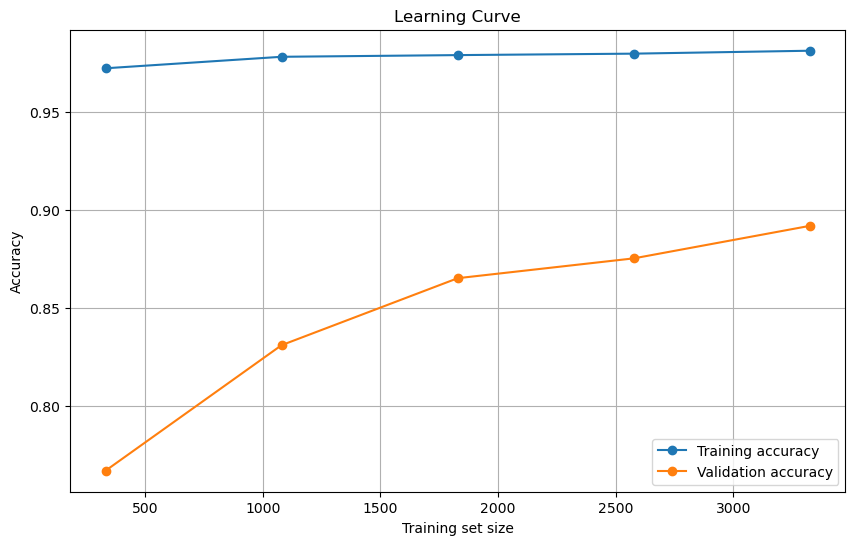


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.85      0.87       423
 baby_unsafe       0.85      0.90      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.87       832
weighted avg       0.88      0.88      0.87       832

Confusion matrix---------------------------------------


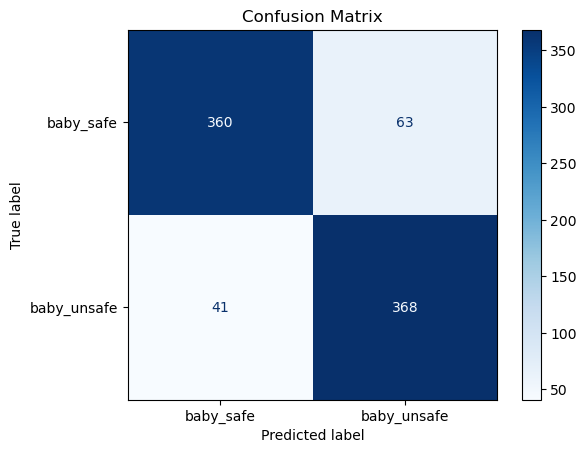

In [85]:
# Definisci il dizionario dei parametri per la ricerca casuale
param_grid = {
    'n_estimators': randint(100, 500),
    'max_samples': uniform(0.5, 1),
    'max_features': uniform(0.5, 1),
    'bootstrap_features': [True, False],
    'estimator__max_depth': randint(1,30),
    'estimator__min_samples_split': randint(2, 20)
}

best_params_bagging = clf.optimize_model(model=bagging_1, param_grid=param_grid, verbose=False)

dt_params = {
    'max_depth': best_params_bagging.pop('estimator__max_depth'),
    'min_samples_split': best_params_bagging.pop('estimator__min_samples_split')
}

bagging_2 = BaggingClassifier(
    estimator=DecisionTreeClassifier(random_state=42,**dt_params),
    **best_params_bagging)

results_bagging_2 = clf.evaluation_pipeline(bagging_2,verbose=True)

# 6) Ensamble

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


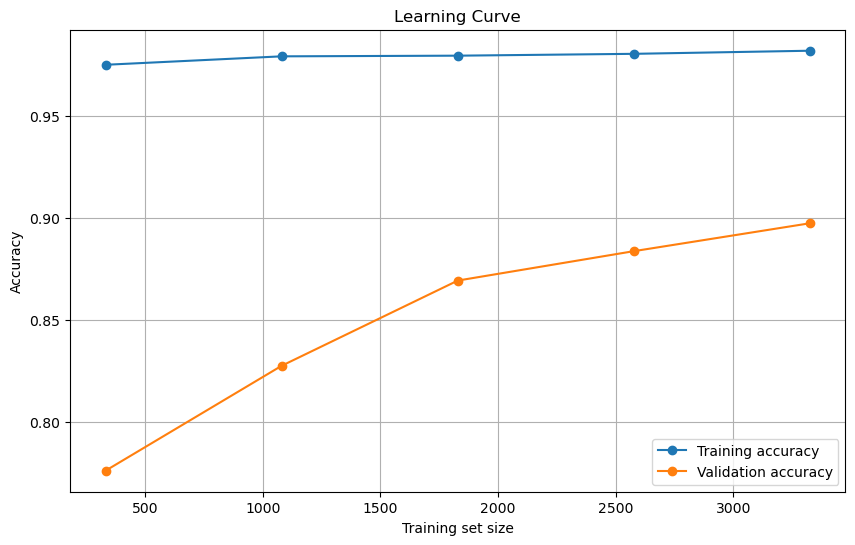


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.86      0.88       423
 baby_unsafe       0.86      0.90      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


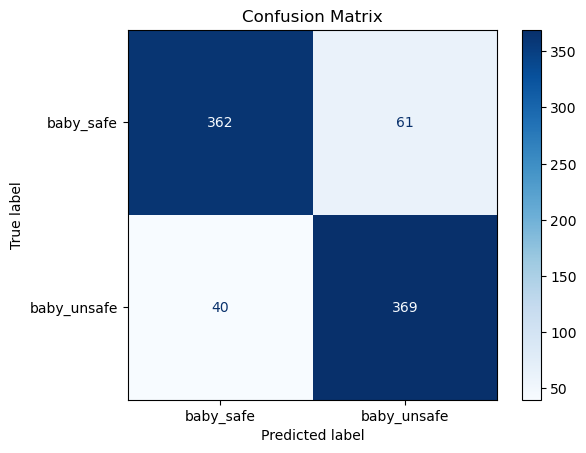

In [86]:
voting_clf_soft = VotingClassifier(
    estimators=[('lr', lr_2), ('rf', random_forest_2), ('xgb', xgbc_2), ('bagging', bagging_2)],
    voting='soft'  # 'hard' per la maggioranza, 'soft' per le probabilità
)

results_voting_soft = clf.evaluation_pipeline(voting_clf_soft,verbose=True,is_ensemble=True)

------------------------------------------------------------------------------------------
-----------------------ENSEMBLE MODEL EVALUATION ON TOP 10 FEATURES-----------------------
------------------------------------------------------------------------------------------


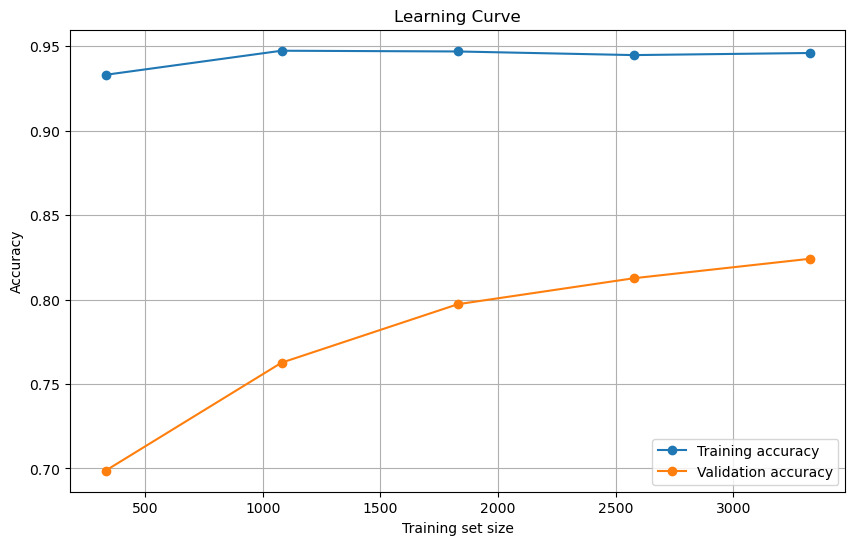


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.87      0.76      0.81       423
 baby_unsafe       0.78      0.88      0.83       409

    accuracy                           0.82       832
   macro avg       0.82      0.82      0.82       832
weighted avg       0.83      0.82      0.82       832

Confusion matrix---------------------------------------


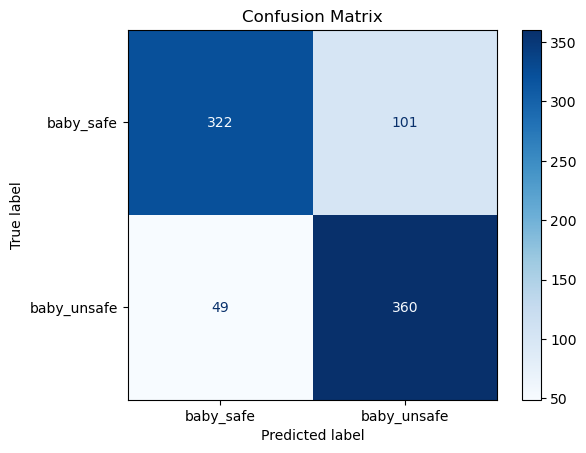

In [87]:
top_10_features_idx = results_lr_2['top_10_features']['top_features_idx']

results_voting_soft = clf.ensemble_on_top_features(
    ensemble_clf=voting_clf_soft,
    top_features_idx=top_10_features_idx,
    verbose=True
)

------------------------------------------------------------------------------------------
-----------------------ENSEMBLE MODEL EVALUATION ON TOP 25 FEATURES-----------------------
------------------------------------------------------------------------------------------


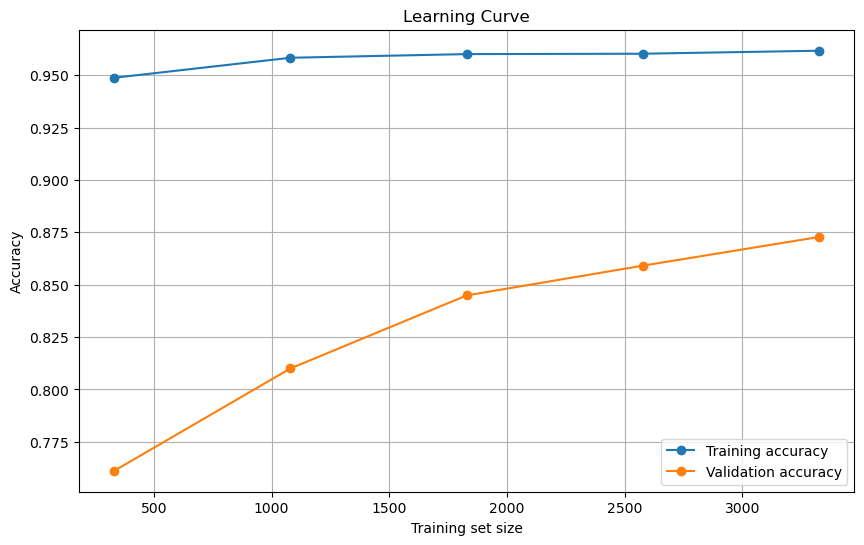


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.88      0.81      0.84       423
 baby_unsafe       0.82      0.89      0.85       409

    accuracy                           0.84       832
   macro avg       0.85      0.85      0.84       832
weighted avg       0.85      0.84      0.84       832

Confusion matrix---------------------------------------


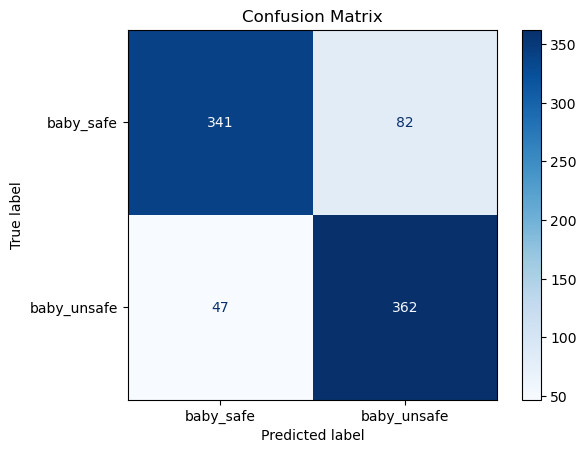

In [88]:
top_25_features_idx = results_lr_2['top_25_features']['top_features_idx']

results_voting_soft = clf.ensemble_on_top_features(
    ensemble_clf=voting_clf_soft,
    top_features_idx=top_25_features_idx,
    verbose=True
)

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


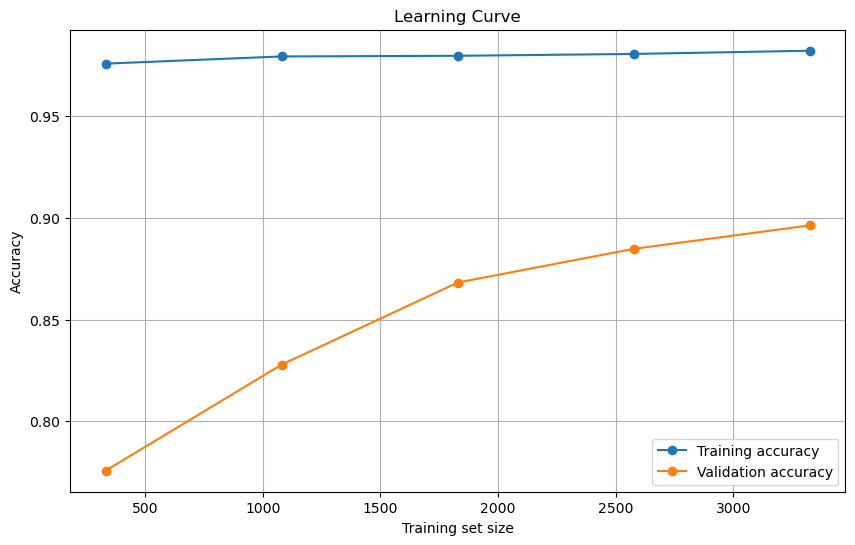


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.86      0.88       423
 baby_unsafe       0.86      0.90      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


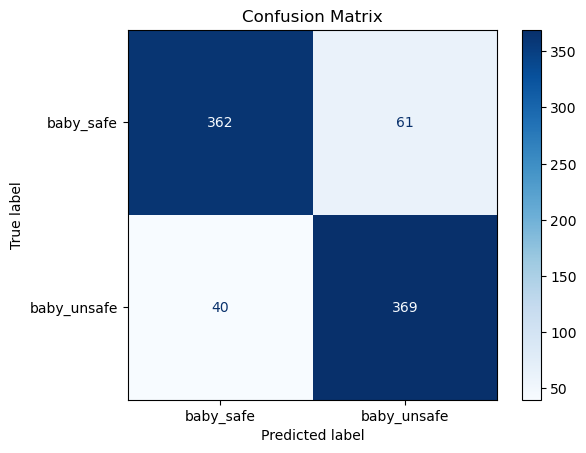

In [89]:
from sklearn.calibration import CalibratedClassifierCV
# Calibrazione dei modelli per migliorare le probabilità
# Per la Regressione Logistica, la calibrazione è solitamente meno necessaria, ma è una buona pratica
calibrated_lr = CalibratedClassifierCV(lr_2, method='isotonic', cv=5)

# Per il Random Forest e altri modelli basati su alberi, la calibrazione è molto utile
calibrated_rf = CalibratedClassifierCV(random_forest_2, method='isotonic', cv=5)

# Anche per XGBoost, la calibrazione può aiutare
calibrated_xgbc = CalibratedClassifierCV(xgbc_2, method='isotonic', cv=5)

calibrated_bagging = CalibratedClassifierCV(bagging_2, method='isotonic', cv=5)

# Creazione del VotingClassifier utilizzando i modelli calibrati
# Nota: La calibrazione richiede 'voting='soft' per funzionare correttamente
voting_clf_soft_calibrated = VotingClassifier(
    estimators=[
        ('lr_calibrated', calibrated_lr),
        ('rf_calibrated', calibrated_rf),
        ('xgbc_calibrated', calibrated_xgbc),
        ('bagging_calibrated', calibrated_bagging)
    ],
    voting='soft'
)
results_voting_soft_calibrated = clf.evaluation_pipeline(voting_clf_soft,verbose=True,is_ensemble=True)

------------------------------------------------------------------------------------------
-----------------------ENSEMBLE MODEL EVALUATION ON TOP 10 FEATURES-----------------------
------------------------------------------------------------------------------------------


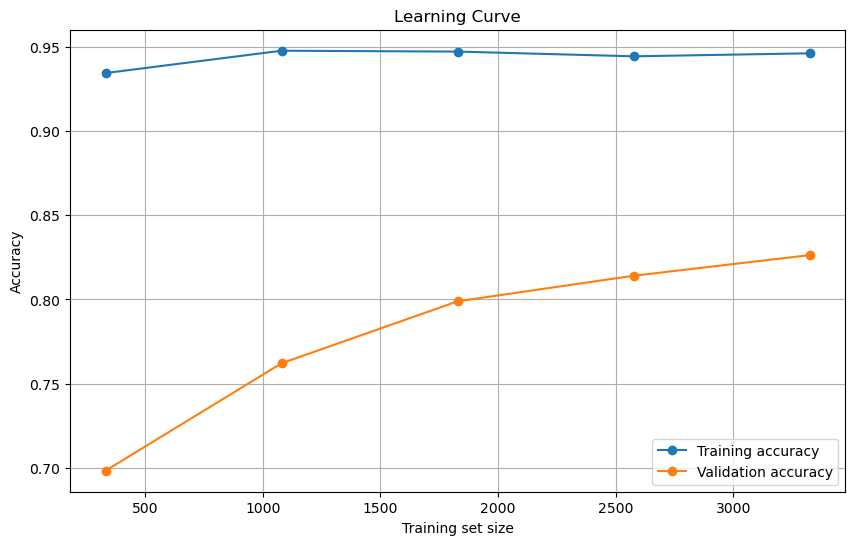


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.87      0.76      0.81       423
 baby_unsafe       0.78      0.88      0.83       409

    accuracy                           0.82       832
   macro avg       0.82      0.82      0.82       832
weighted avg       0.82      0.82      0.82       832

Confusion matrix---------------------------------------


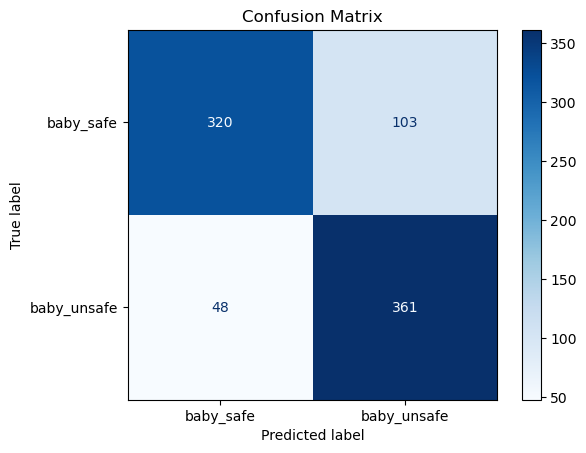

{'top_10_features': {'model': VotingClassifier(estimators=[('lr',
                                LogisticRegression(C=np.float64(1.6068111664741074),
                                                   solver='liblinear')),
                               ('rf',
                                RandomForestClassifier(bootstrap=False,
                                                       criterion='entropy',
                                                       max_depth=23,
                                                       max_features='log2',
                                                       min_samples_split=15,
                                                       n_estimators=570)),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                             

In [90]:
top_10_features_idx = results_lr_2['top_10_features']['top_features_idx']

clf.ensemble_on_top_features(
    ensemble_clf=voting_clf_soft,
    top_features_idx=top_10_features_idx,
    verbose=True
)

------------------------------------------------------------------------------------------
-----------------------ENSEMBLE MODEL EVALUATION ON TOP 25 FEATURES-----------------------
------------------------------------------------------------------------------------------


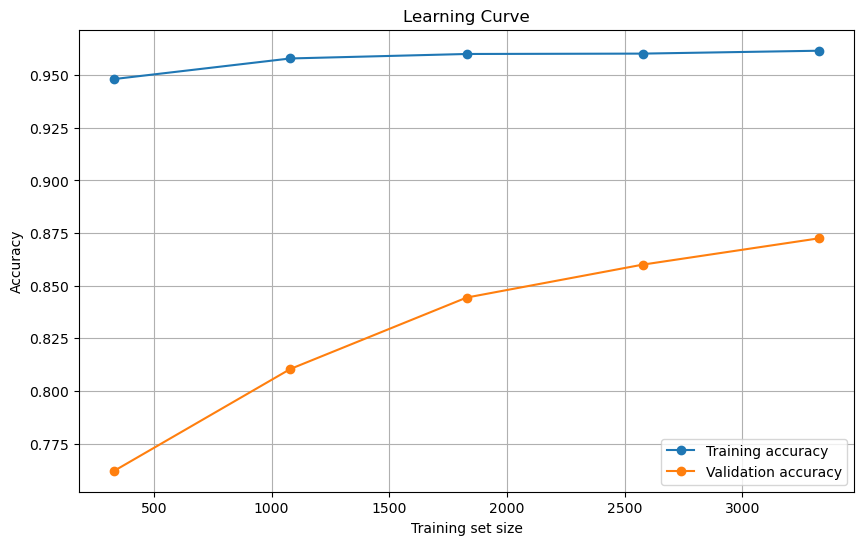


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.88      0.81      0.84       423
 baby_unsafe       0.82      0.89      0.85       409

    accuracy                           0.85       832
   macro avg       0.85      0.85      0.85       832
weighted avg       0.85      0.85      0.85       832

Confusion matrix---------------------------------------


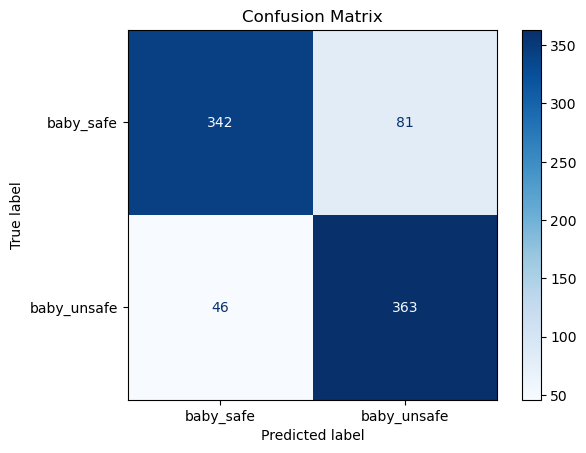

{'top_25_features': {'model': VotingClassifier(estimators=[('lr',
                                LogisticRegression(C=np.float64(1.6068111664741074),
                                                   solver='liblinear')),
                               ('rf',
                                RandomForestClassifier(bootstrap=False,
                                                       criterion='entropy',
                                                       max_depth=23,
                                                       max_features='log2',
                                                       min_samples_split=15,
                                                       n_estimators=570)),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                             

In [91]:
top_25_features_idx = results_lr_2['top_25_features']['top_features_idx']

clf.ensemble_on_top_features(
    ensemble_clf=voting_clf_soft,
    top_features_idx=top_25_features_idx,
    verbose=True
)

# 7) Work on XGBC

We noticed that in this model one feature was much more important than the others, but when we removed it, the performance improved. Therefore, we are now looking for other individual features or groups of features whose removal could also lead to a performance increase.

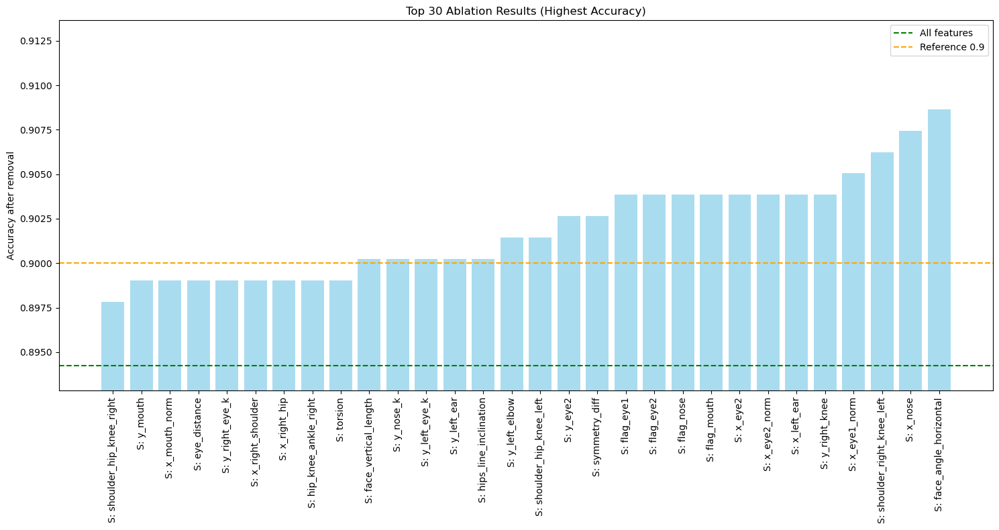

Starting accuracy with all features: 0.8942

=== Iterative ablation cycle 1 ===


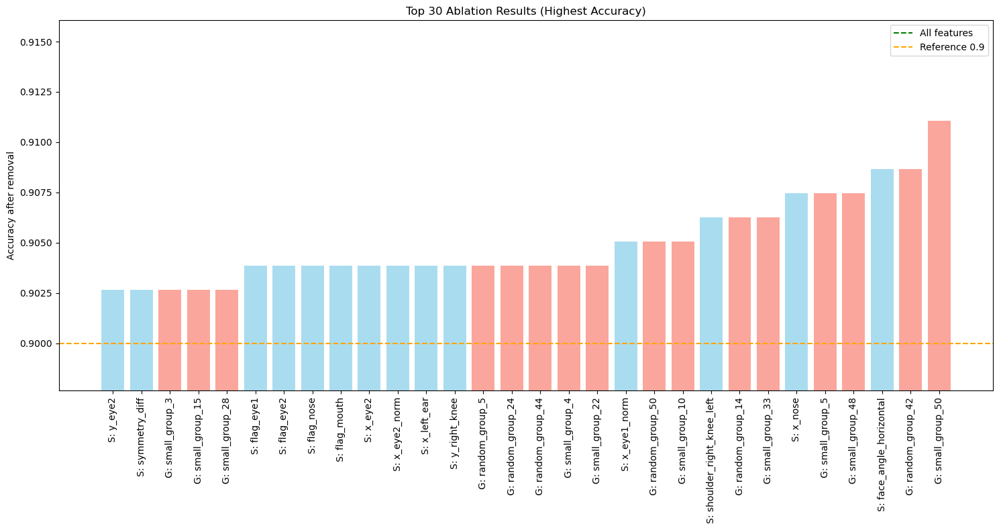

Best removal this cycle: cycle_1_small_group_50 -> accuracy 0.9111
Removed features: ['y_nose', 'x_right_eye_k']
New accuracy: 0.9111

=== Iterative ablation cycle 2 ===


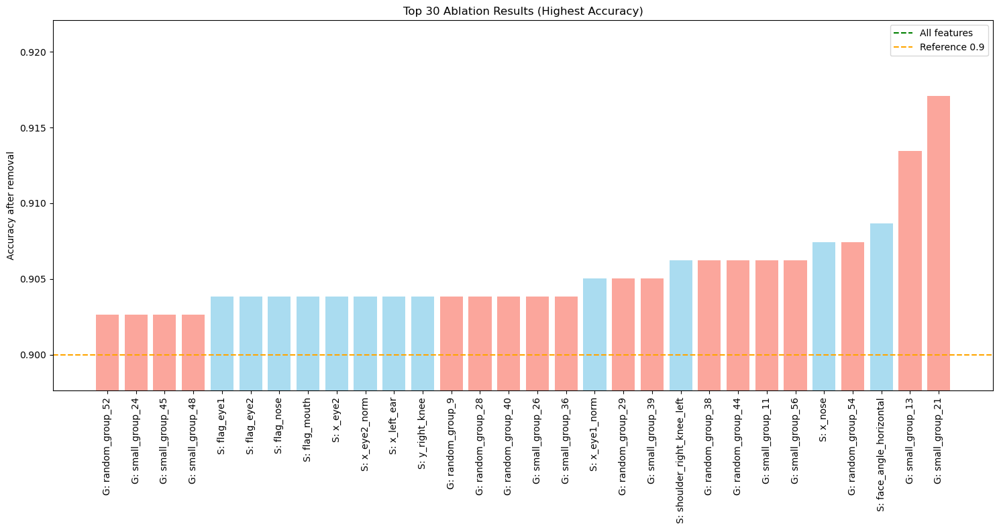

Best removal this cycle: cycle_1_small_group_21 -> accuracy 0.9171
Removed features: ['x_left_elbow', 'x_left_hip']
New accuracy: 0.9171

=== Iterative ablation cycle 3 ===


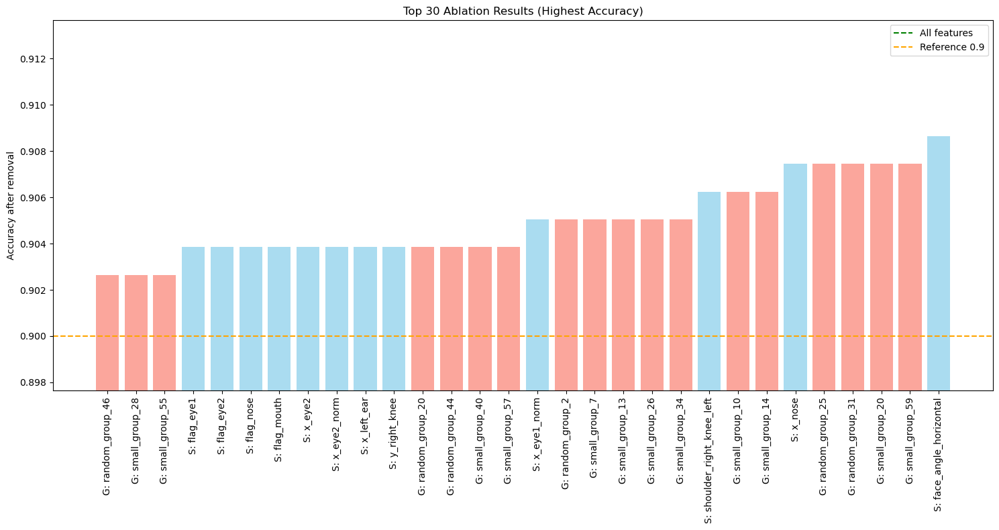

Best removal this cycle: cycle_1_face_angle_horizontal -> accuracy 0.9087
No further improvement, stopping iterative ablation.


(      flag_eye1  flag_eye2  flag_nose  flag_mouth    x_eye1    y_eye1  \
 0      1.149049   1.804407   1.283247    1.432782  0.744004  1.171259   
 1     -0.870285  -0.554199  -0.779273   -0.697943 -0.848735 -0.849216   
 2      1.149049   1.804407   1.283247    1.432782  1.144892  1.525461   
 3      1.149049   1.804407   1.283247    1.432782  1.030433  1.629509   
 4     -0.870285  -0.554199  -0.779273   -0.697943 -0.848735 -0.849216   
 ...         ...        ...        ...         ...       ...       ...   
 4153  -0.870285  -0.554199  -0.779273   -0.697943 -0.848735 -0.849216   
 4154  -0.870285  -0.554199  -0.779273   -0.697943 -0.848735 -0.849216   
 4155   1.149049  -0.554199  -0.779273   -0.697943  0.633523  1.157882   
 4156  -0.870285  -0.554199  -0.779273   -0.697943 -0.848735 -0.849216   
 4157  -0.870285  -0.554199  -0.779273   -0.697943 -0.848735 -0.849216   
 
         x_eye2    y_eye2    x_nose   x_mouth  ...  elbow_shoulder_hip_left  \
 0     1.266177  2.077055  0.88

In [37]:
clf.iterative_ablation(model=xgbc_2,
                       embeddings= embeddings,
                       y=emb_builder.y,
                       classes_bs=emb_builder.classes_bs,
                       max_cycles=20,
                       n_random_groups=60, random_group_size=6,
                       n_small_groups=60, small_group_size=2,
                       medium_group_size=60,n_medium_groups=3,
                       verbose=True)


########## RUN 1/20 ##########


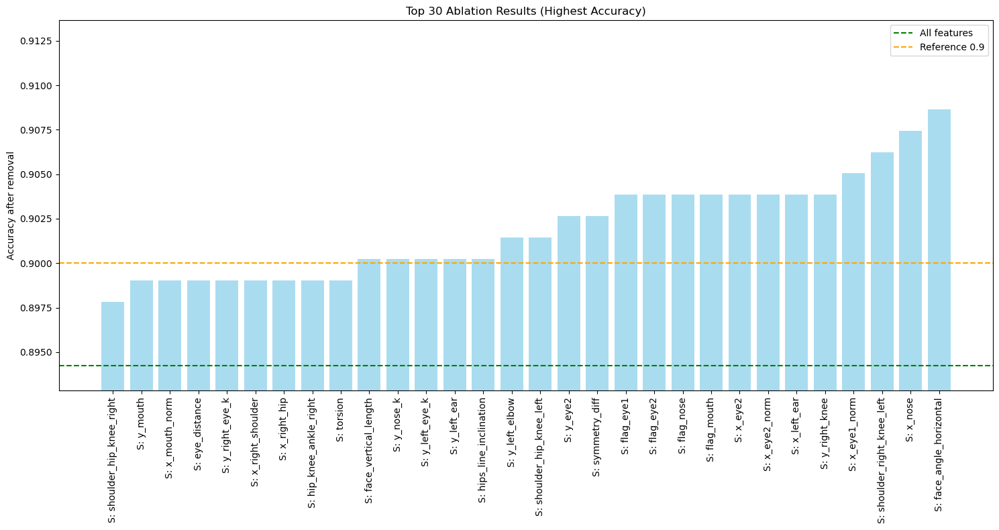

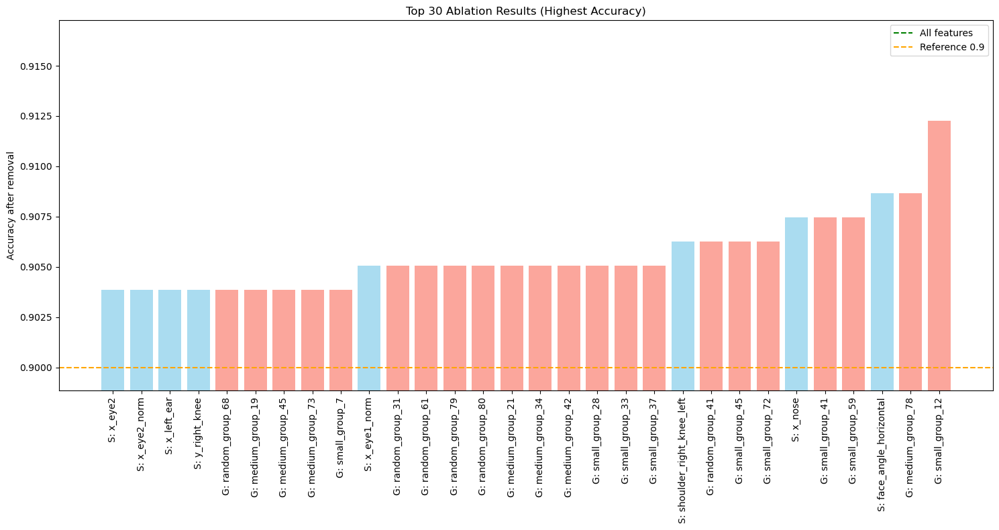

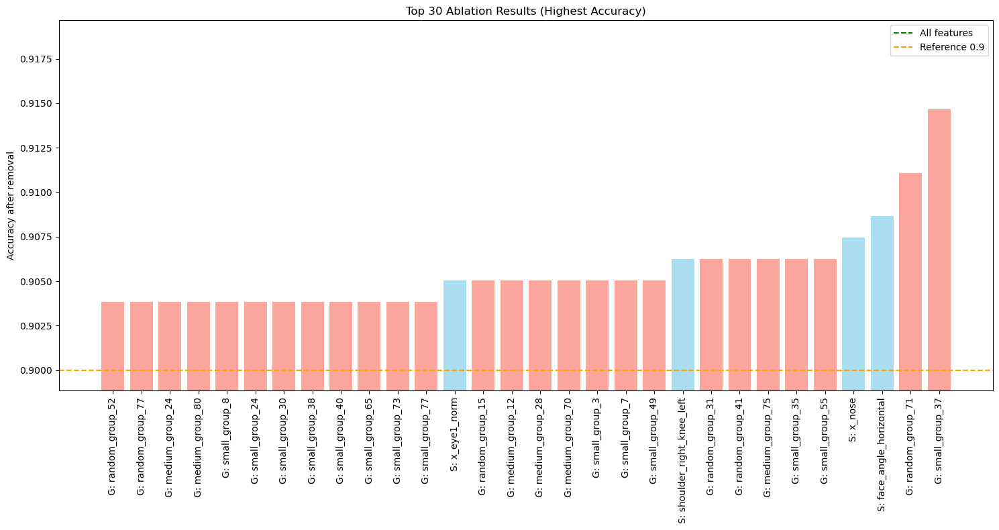

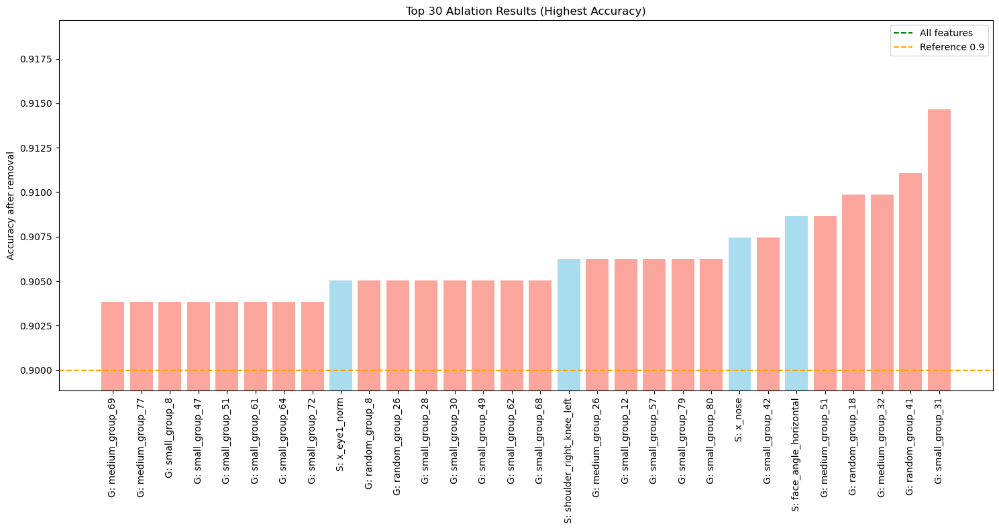

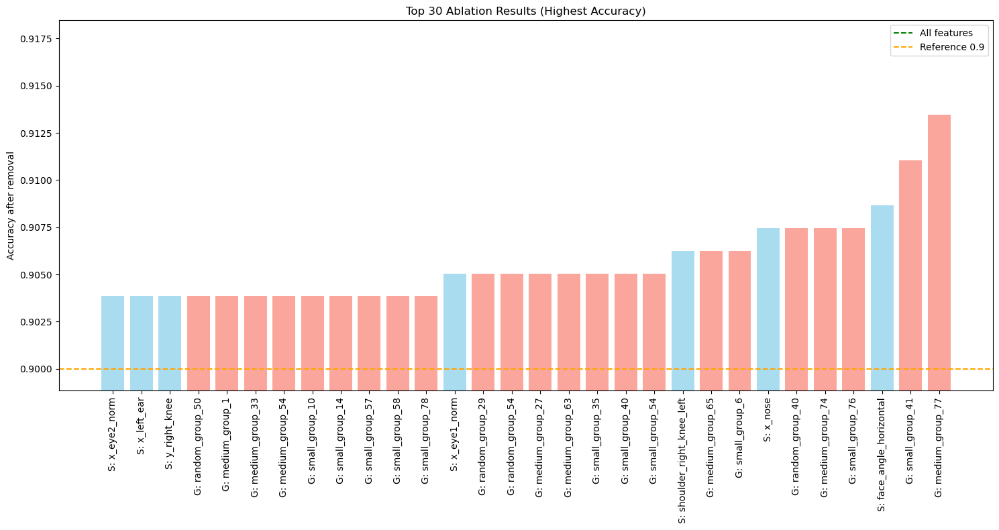

✅ Nuovo best trovato: 0.9147 (run 1)

########## RUN 2/20 ##########


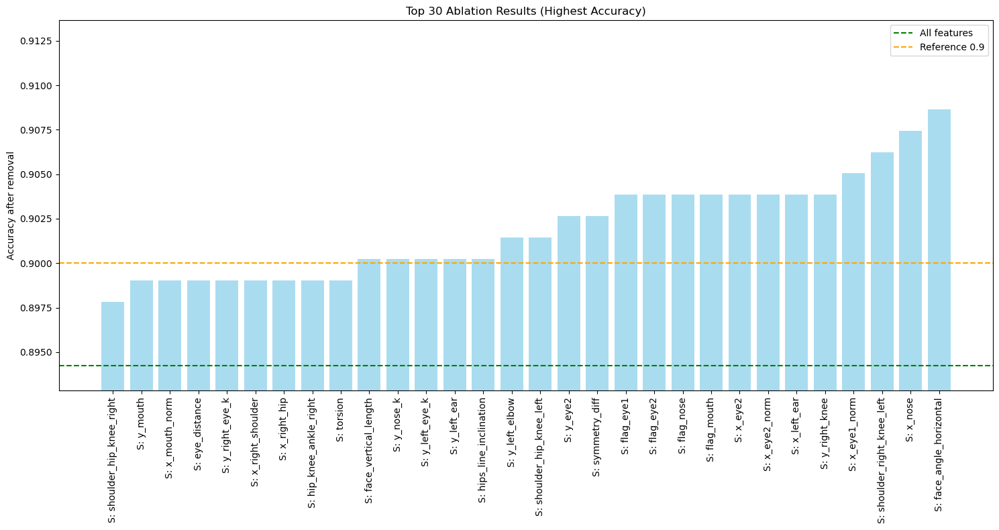

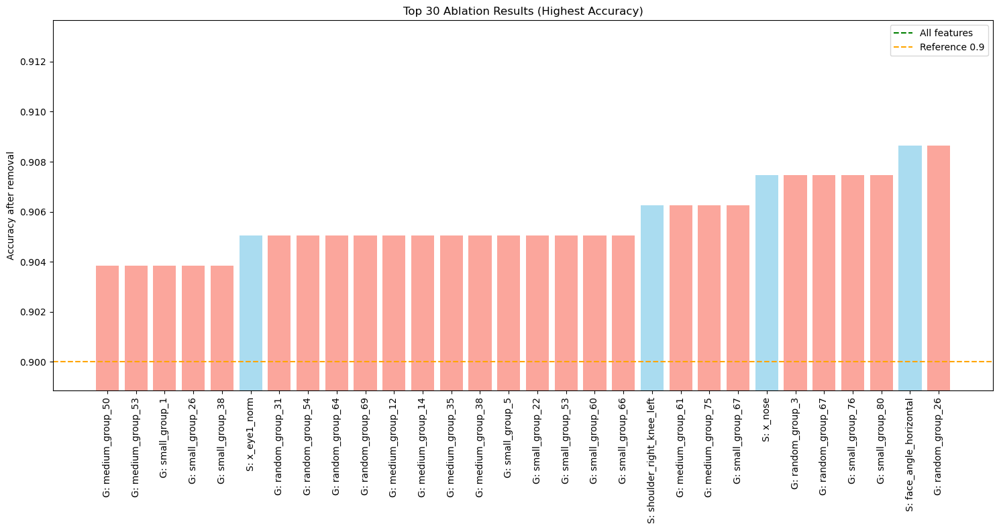

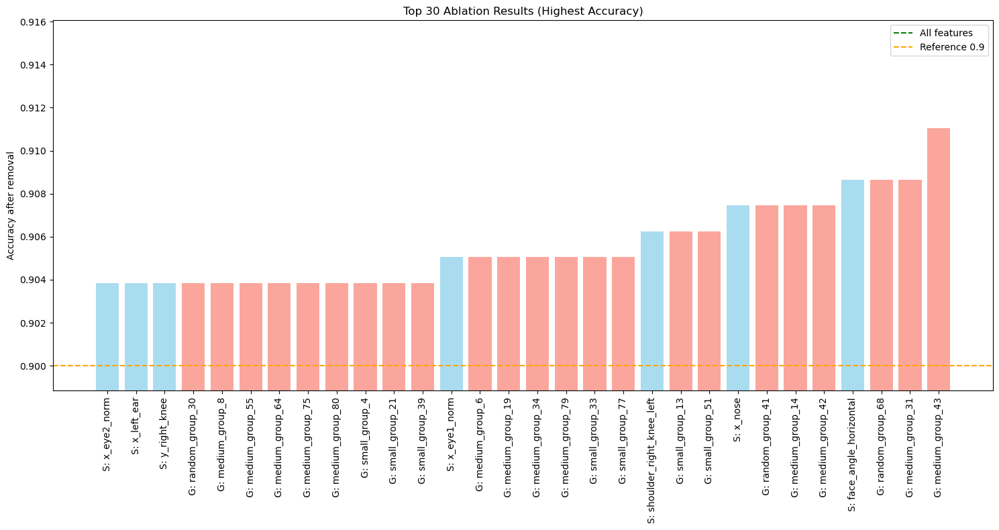

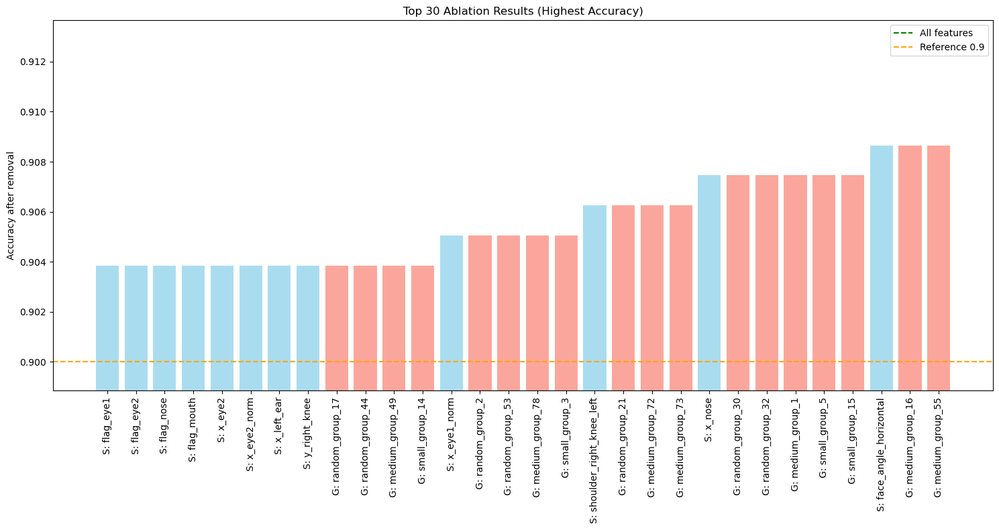


########## RUN 3/20 ##########


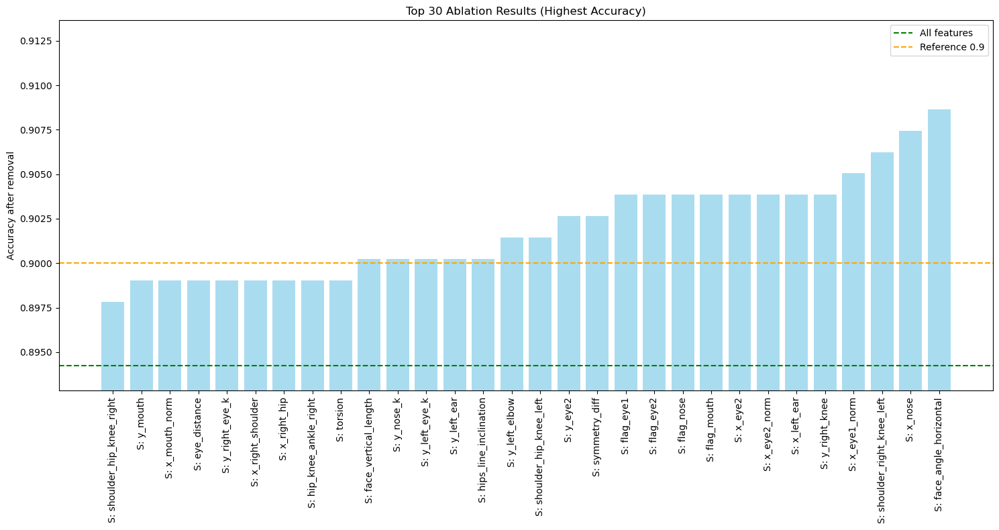

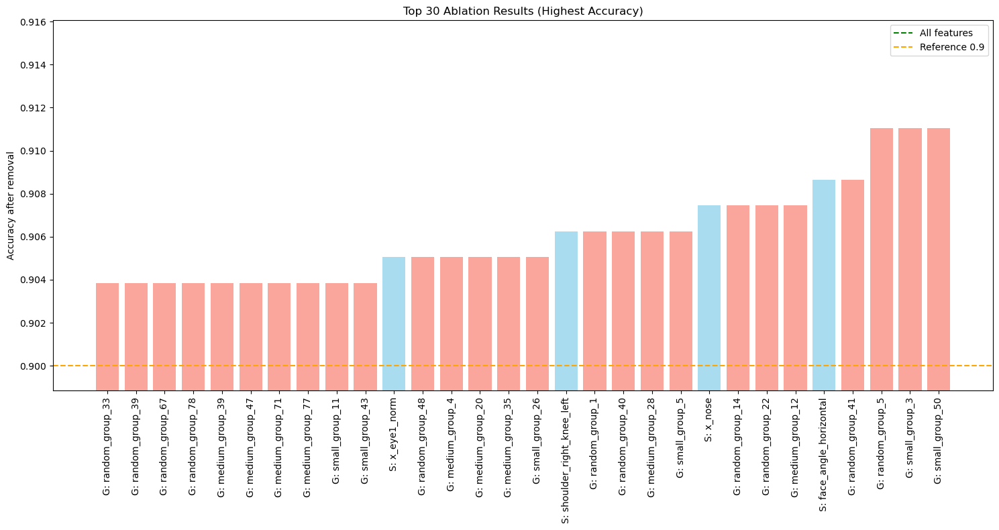

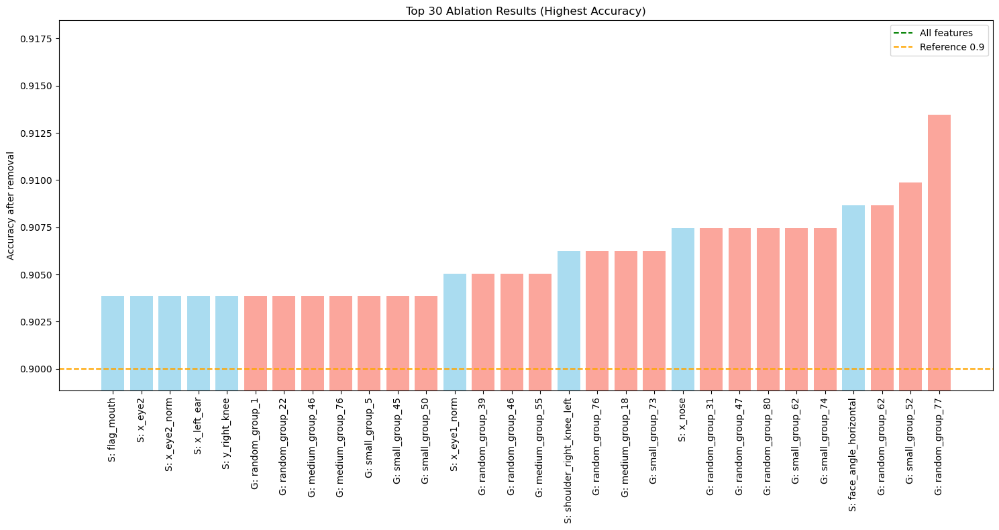

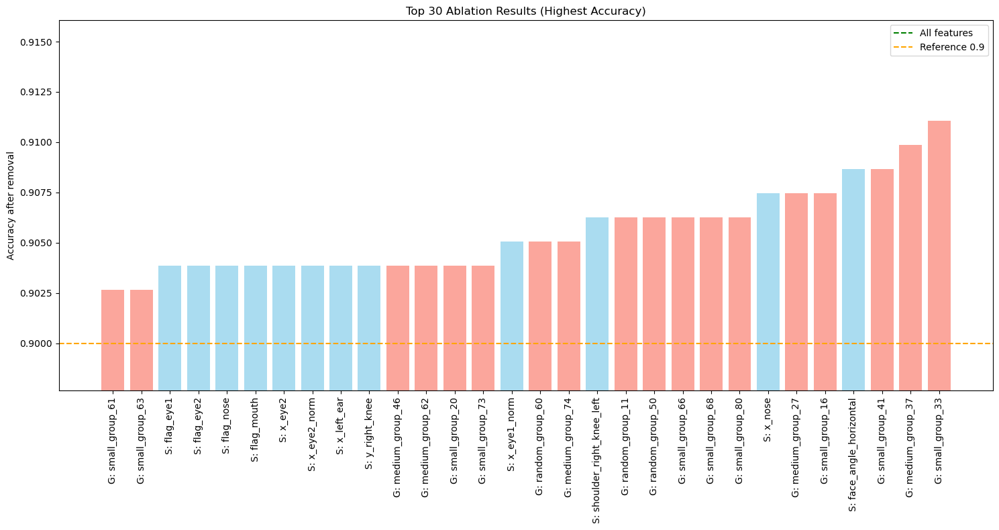


########## RUN 4/20 ##########


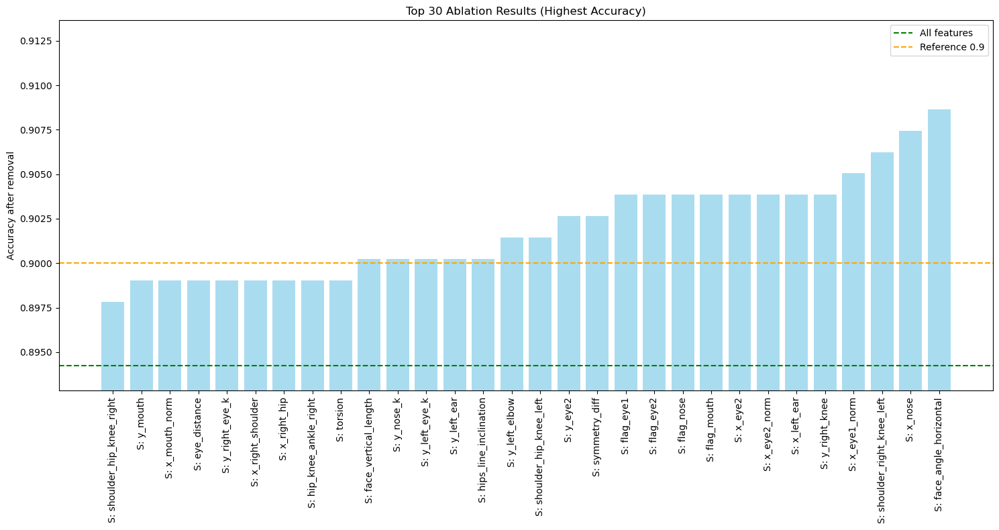

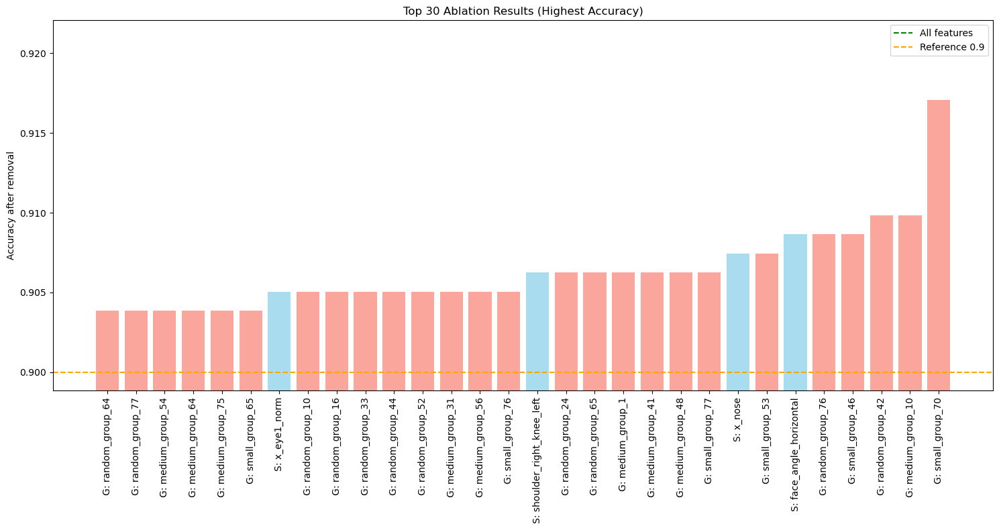

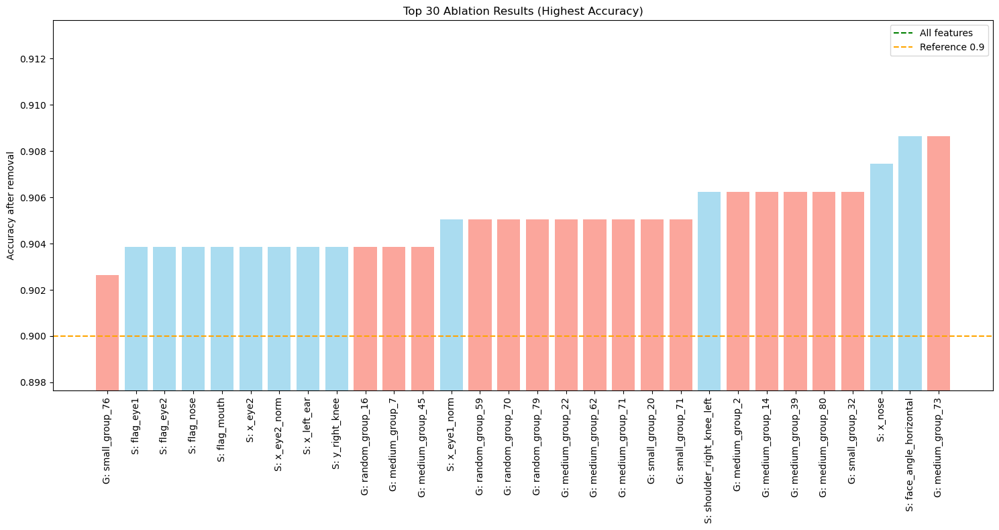

✅ Nuovo best trovato: 0.9171 (run 4)

########## RUN 5/20 ##########


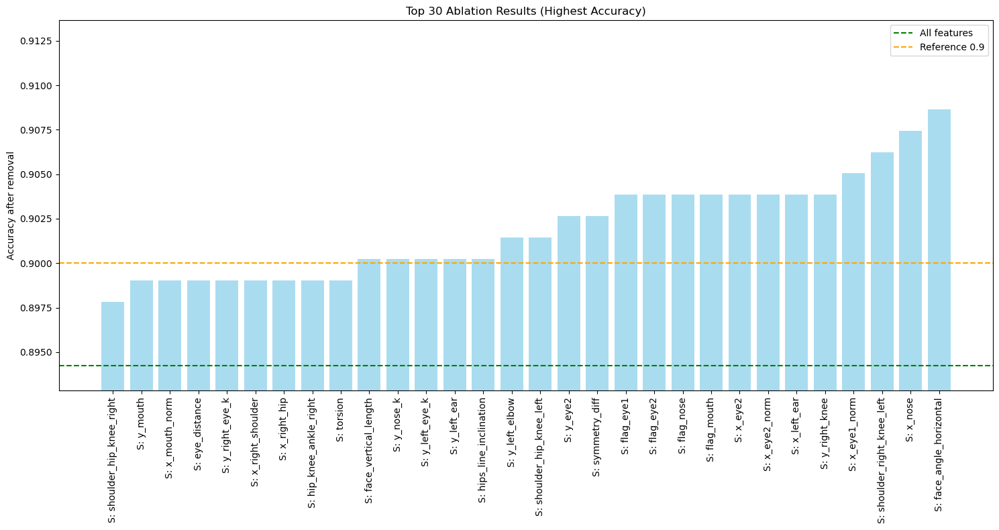

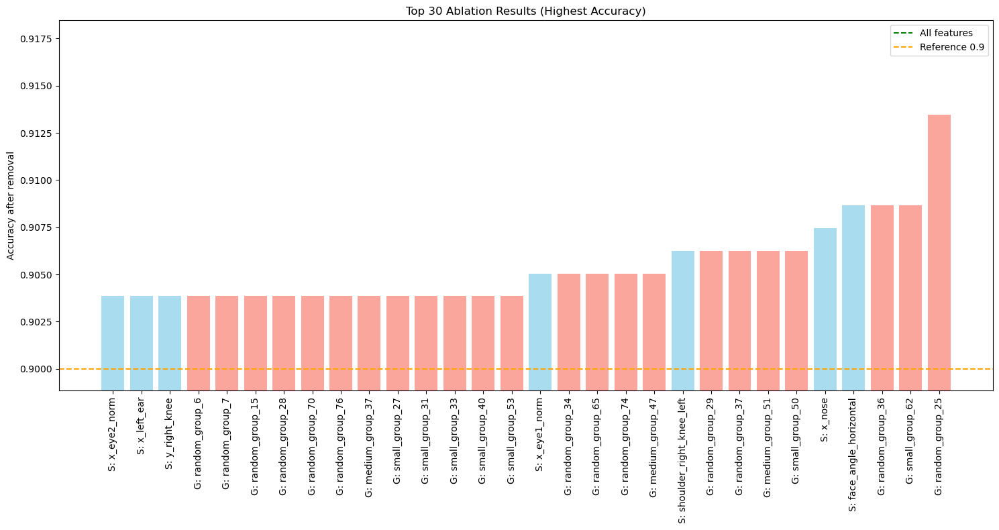

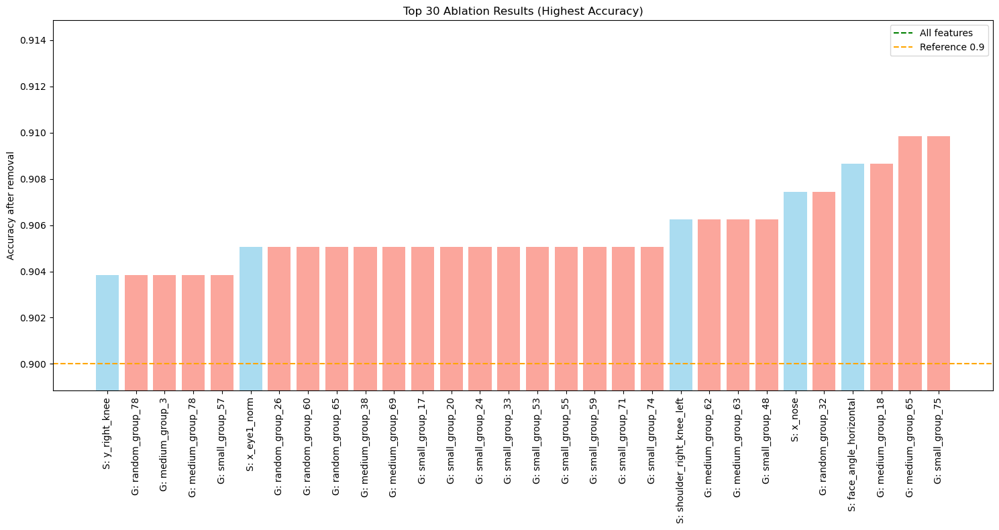


########## RUN 6/20 ##########


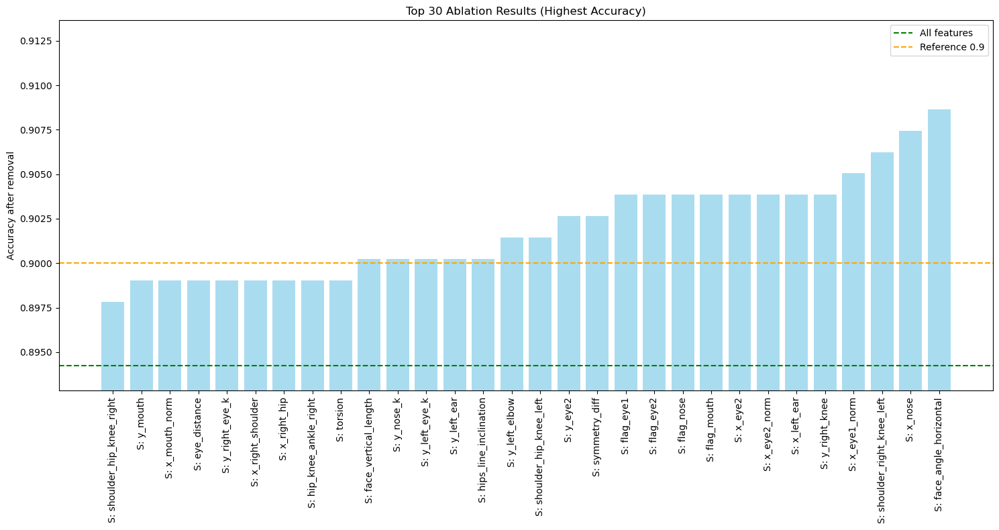

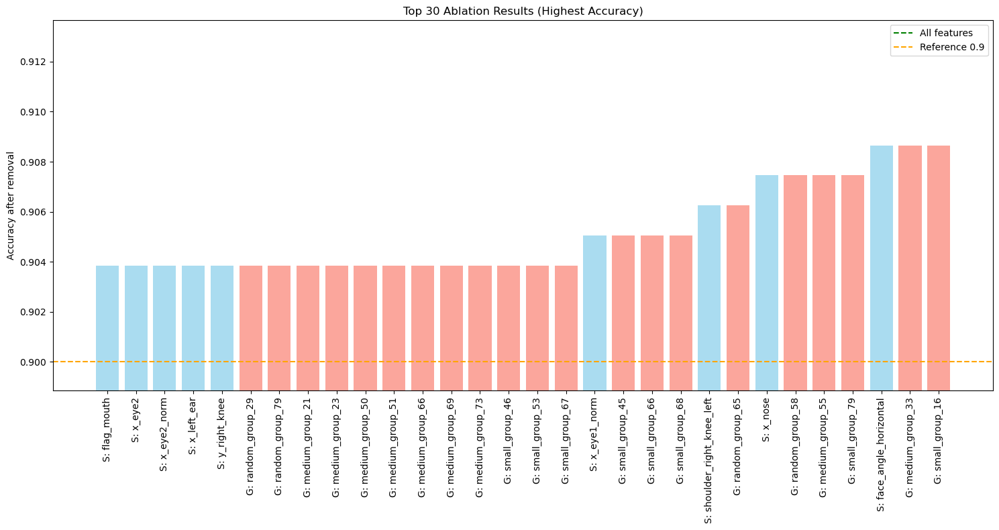

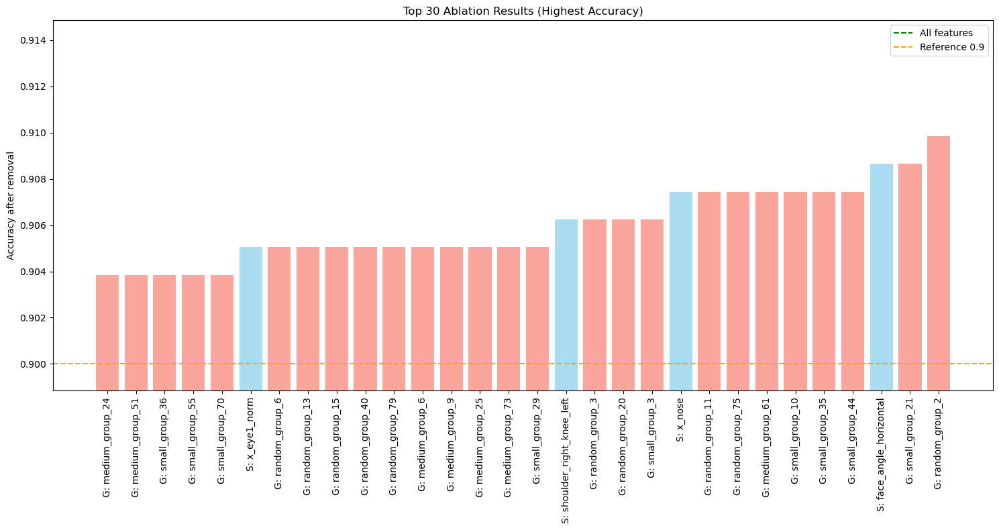

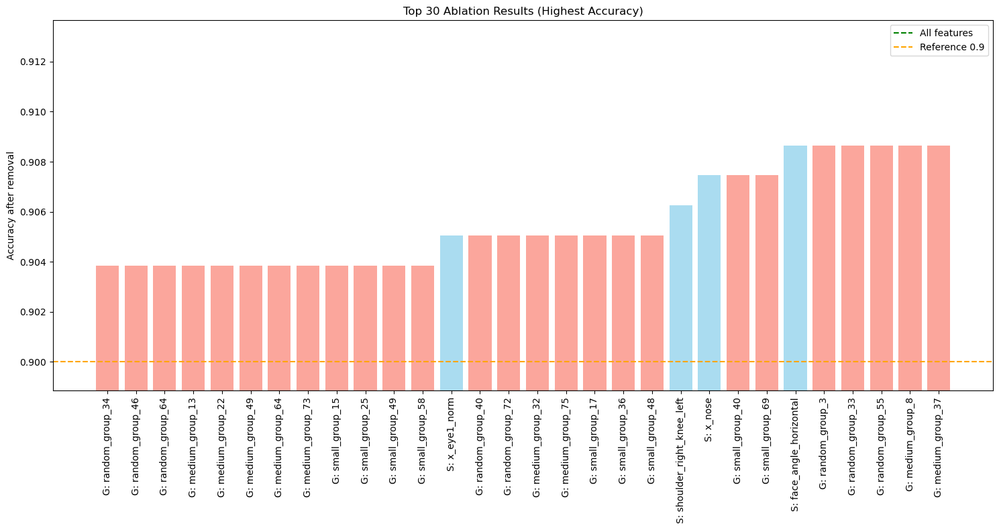


########## RUN 7/20 ##########


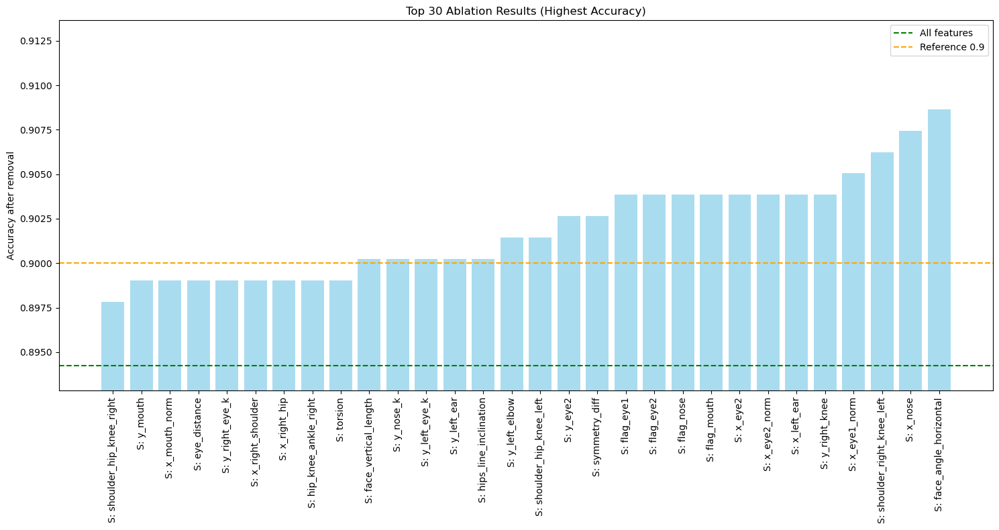

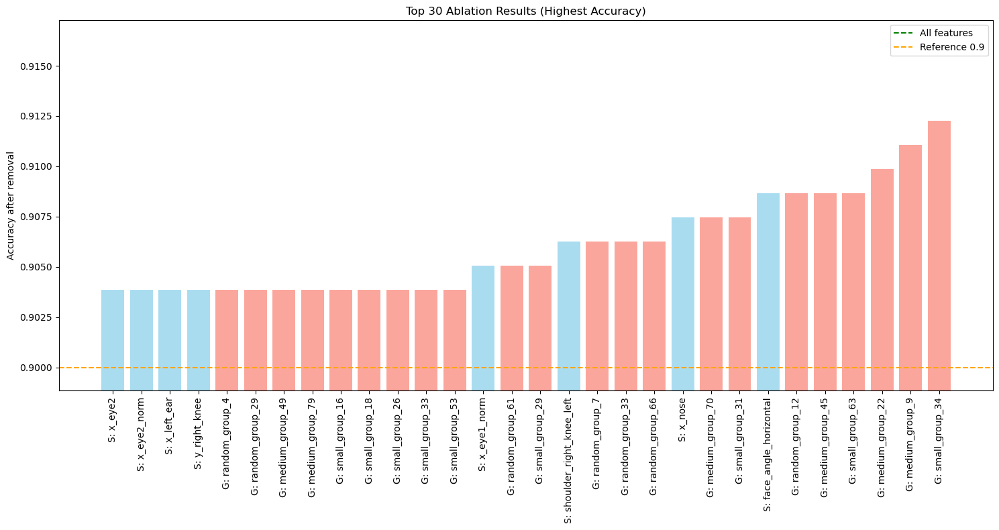

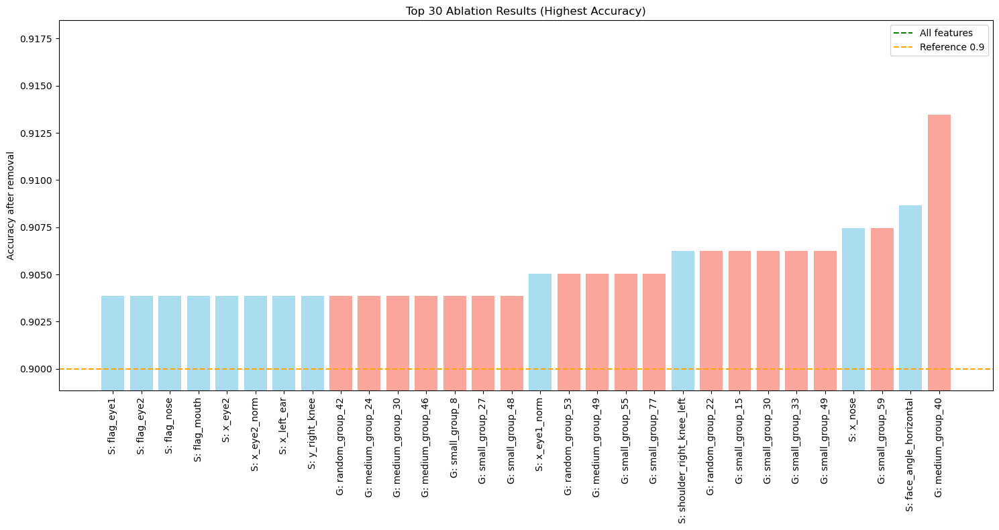

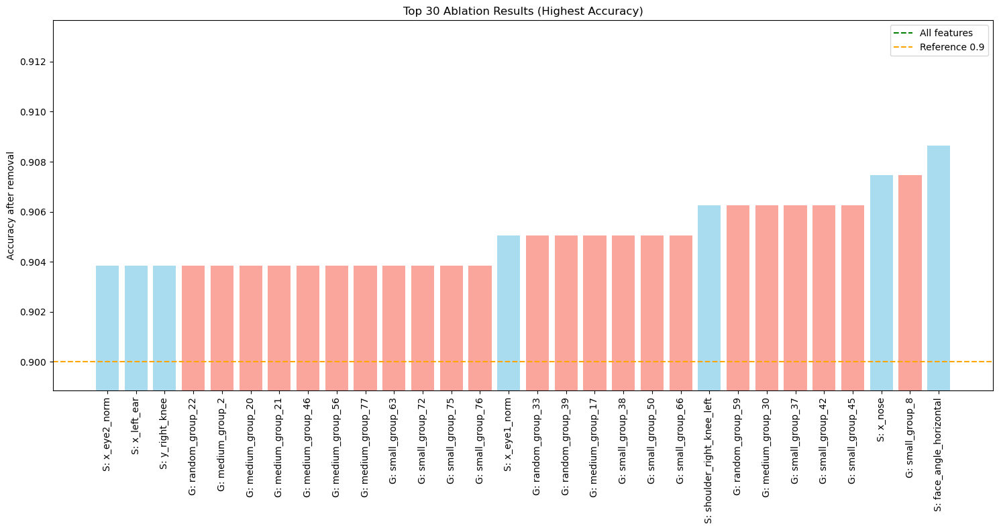


########## RUN 8/20 ##########


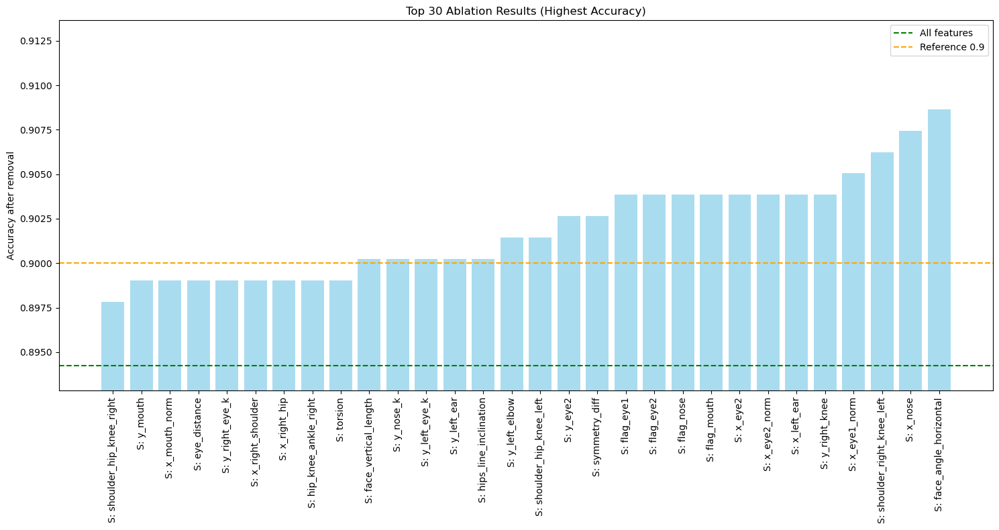

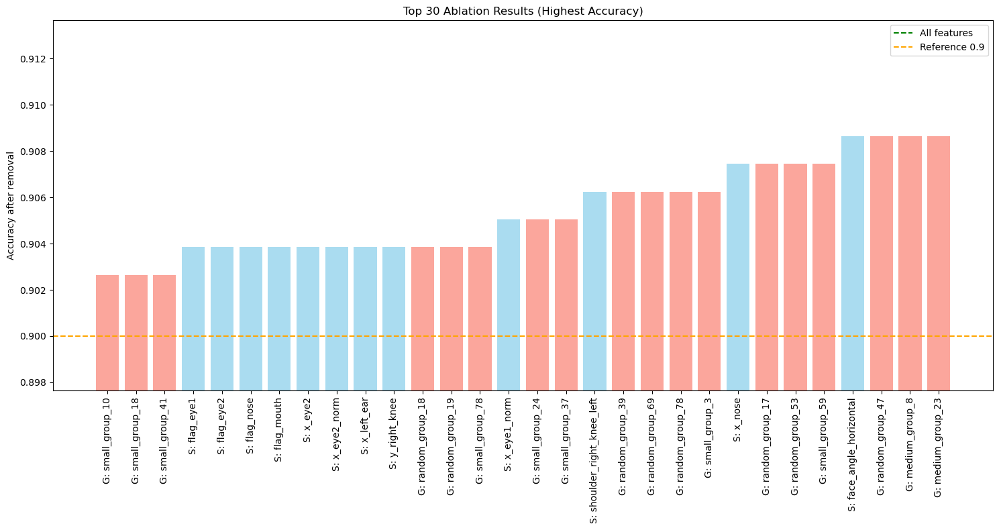

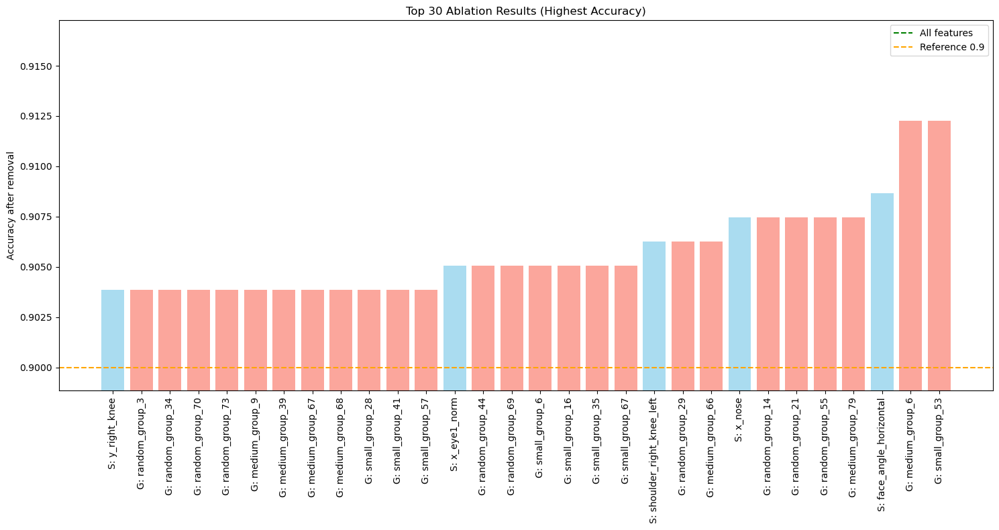

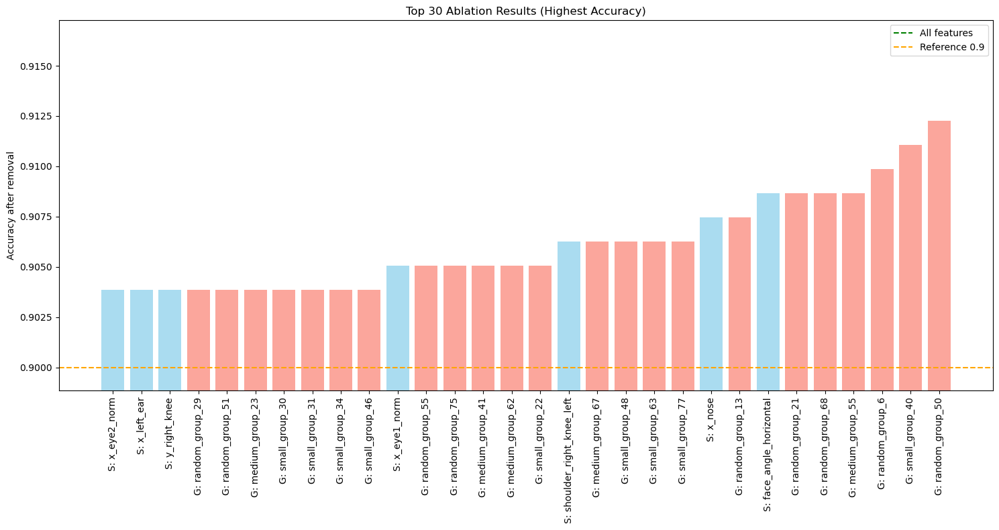

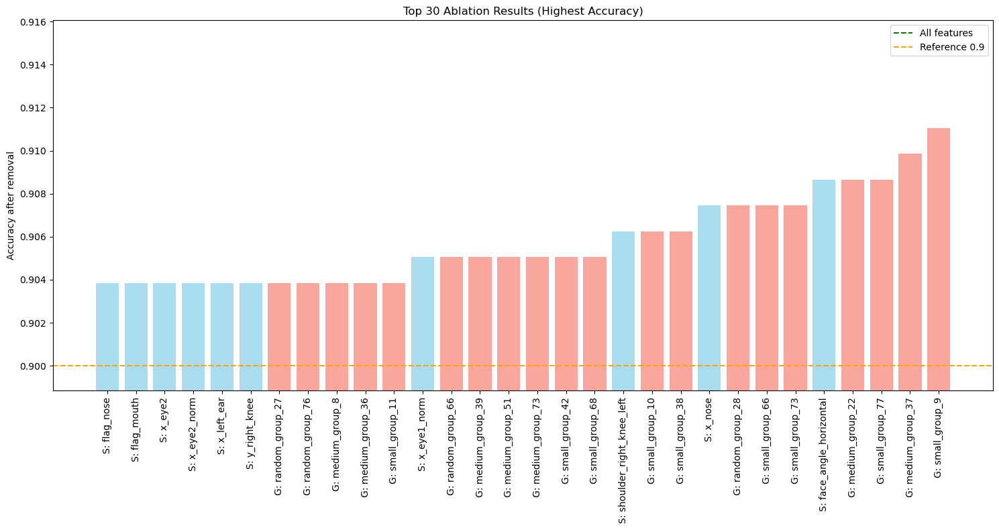


########## RUN 9/20 ##########


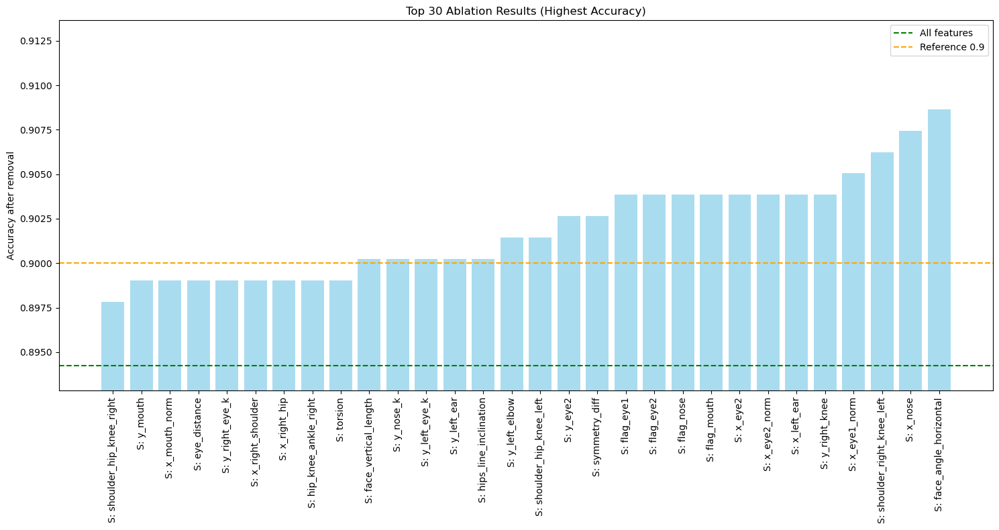

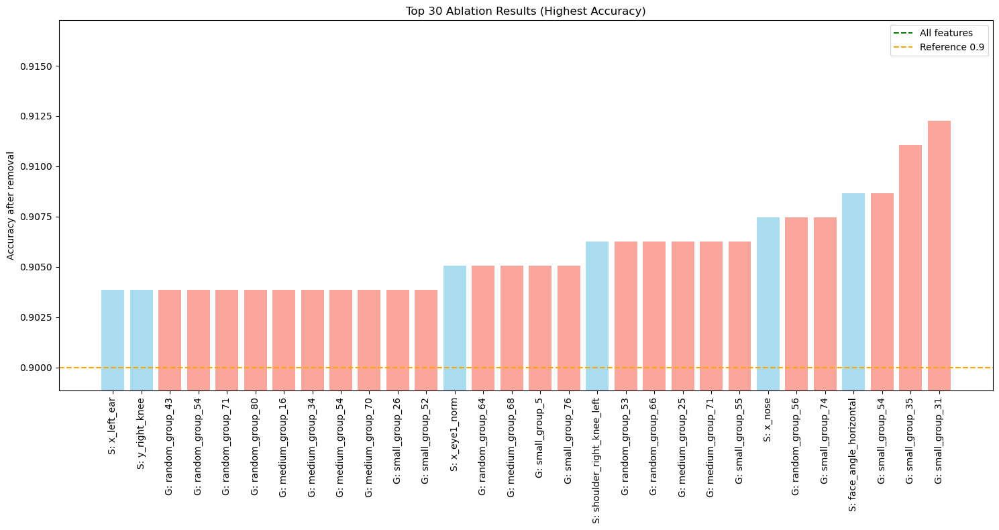

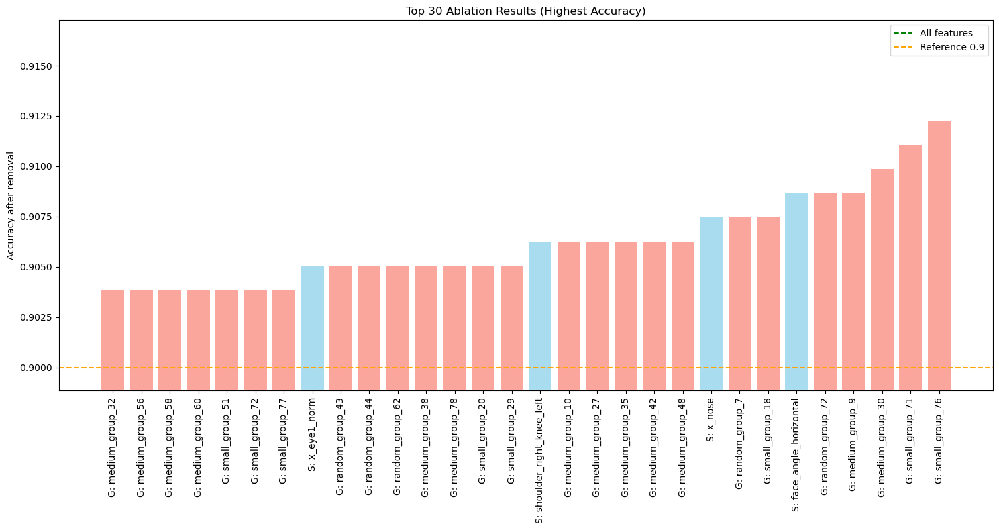

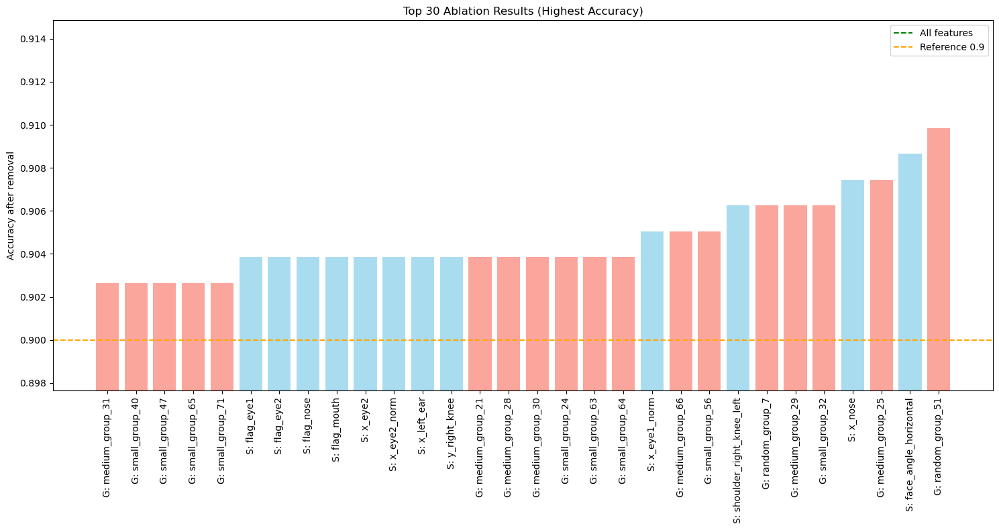


########## RUN 10/20 ##########


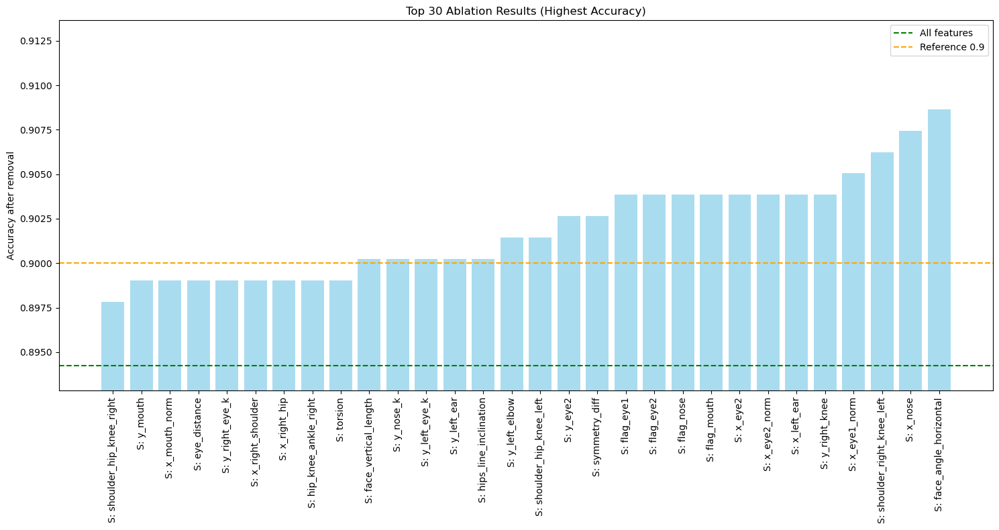

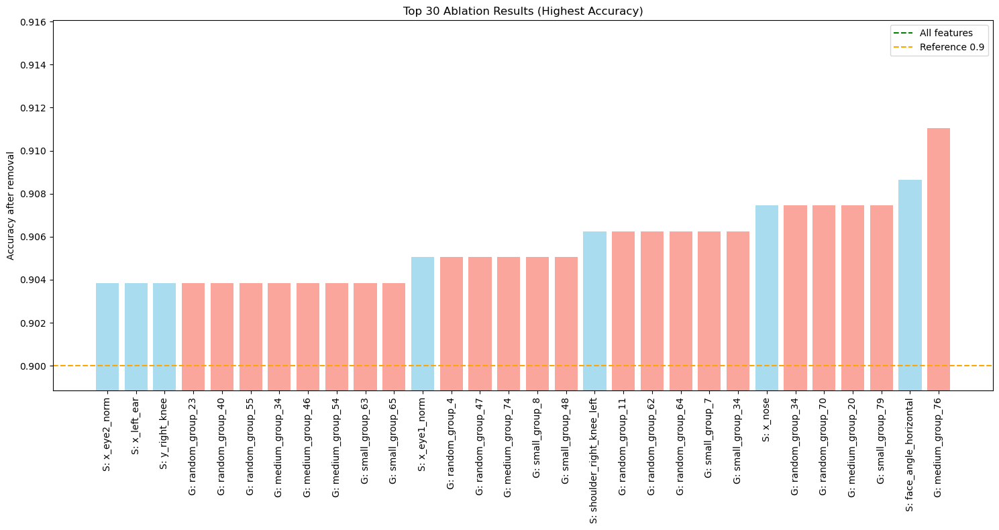

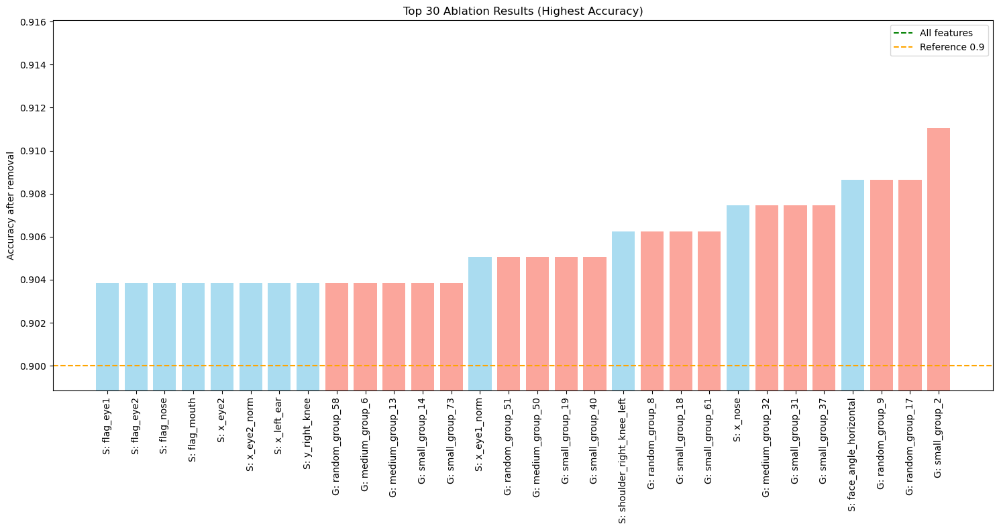

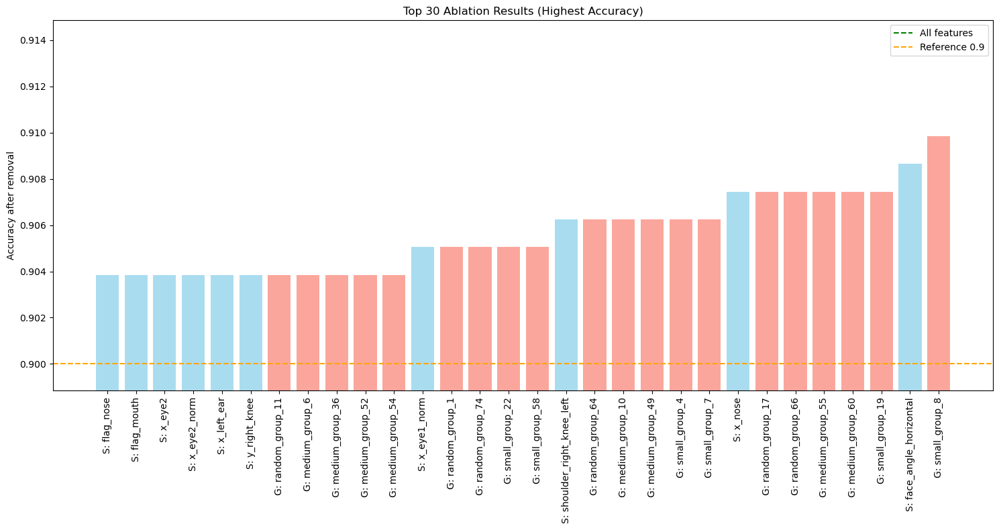


########## RUN 11/20 ##########


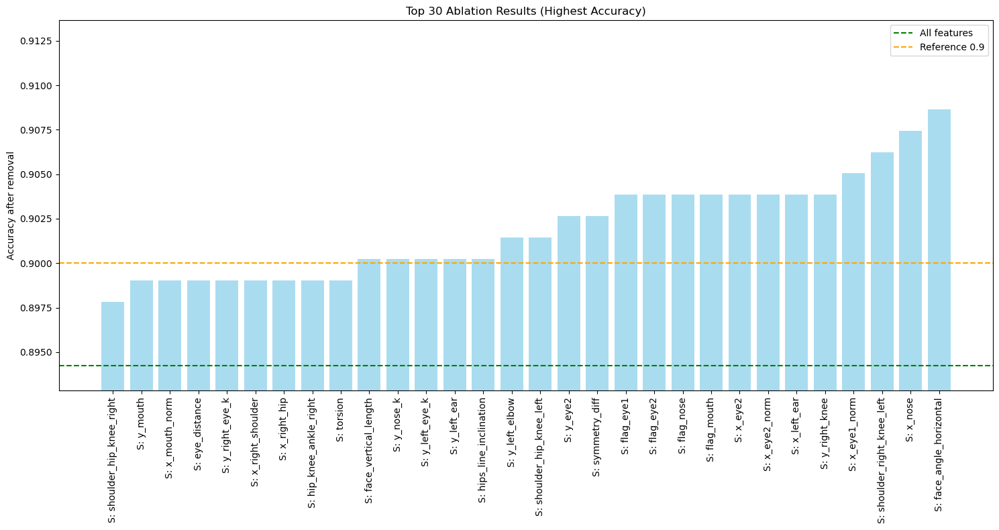

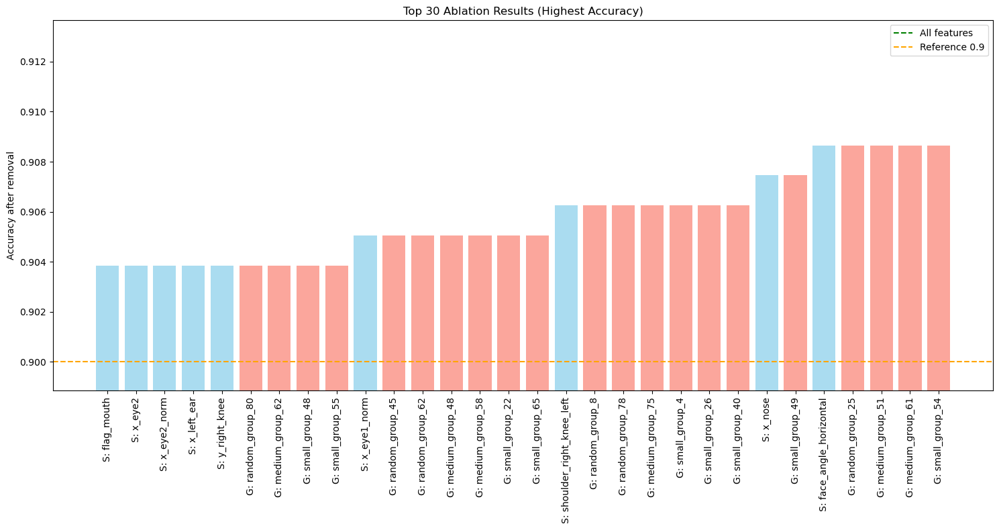

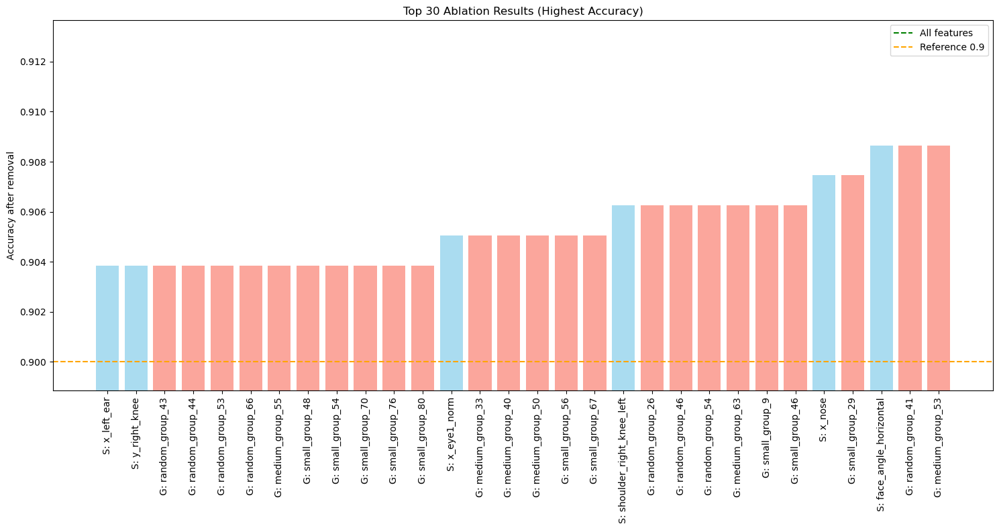

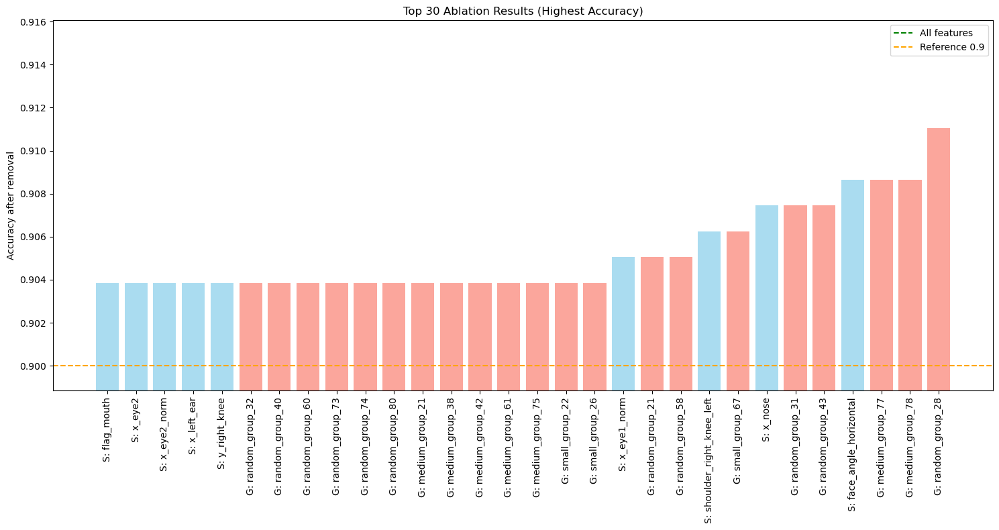

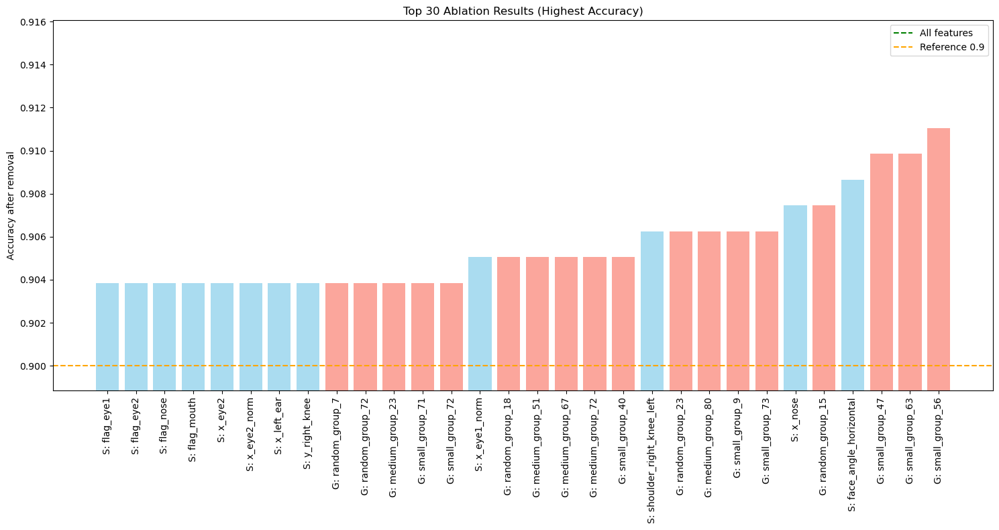

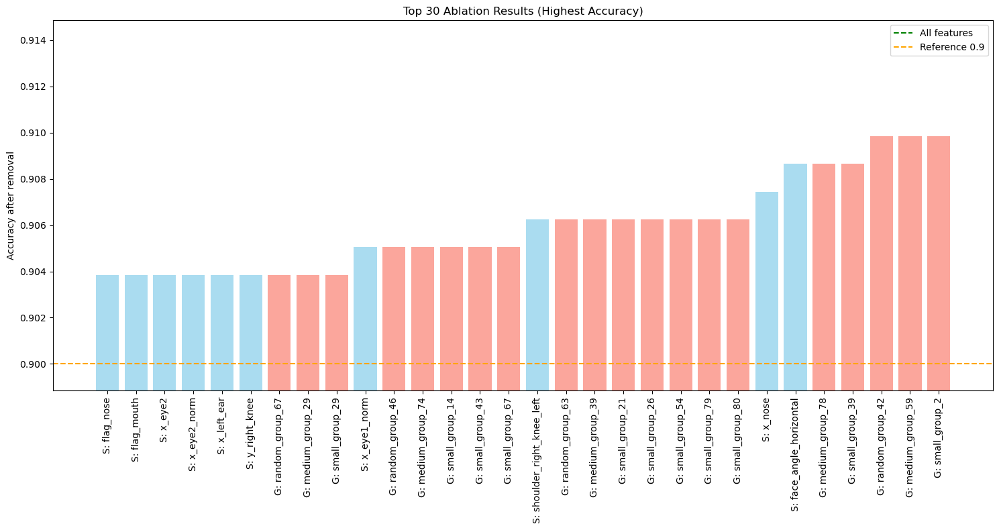


########## RUN 12/20 ##########


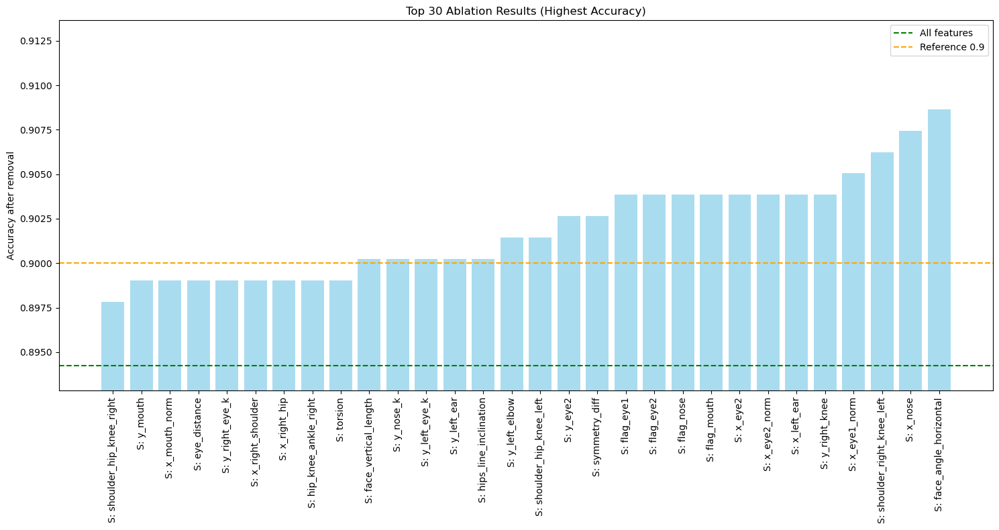

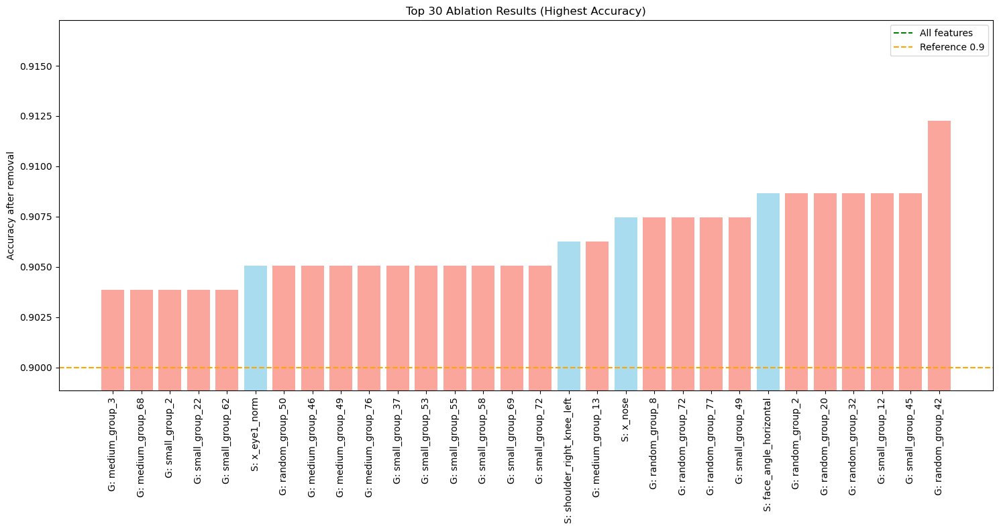

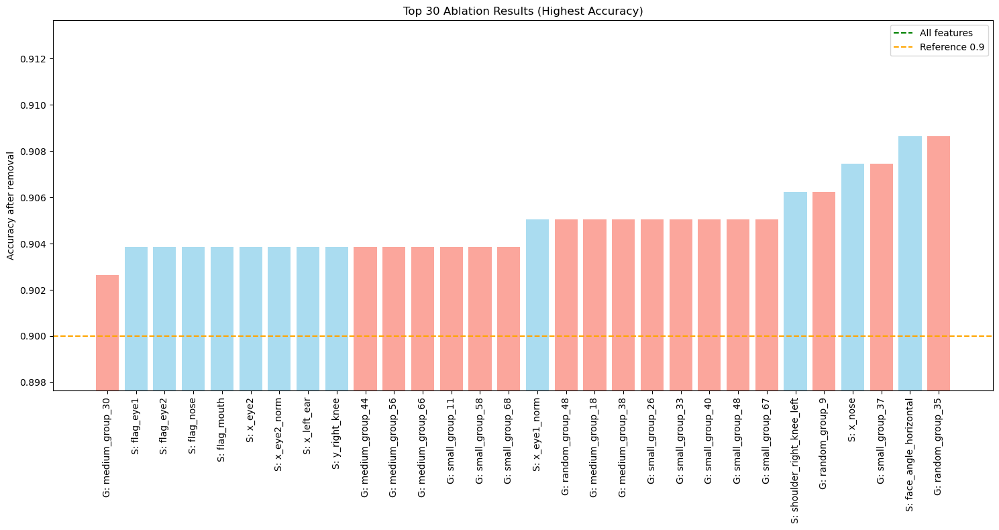


########## RUN 13/20 ##########


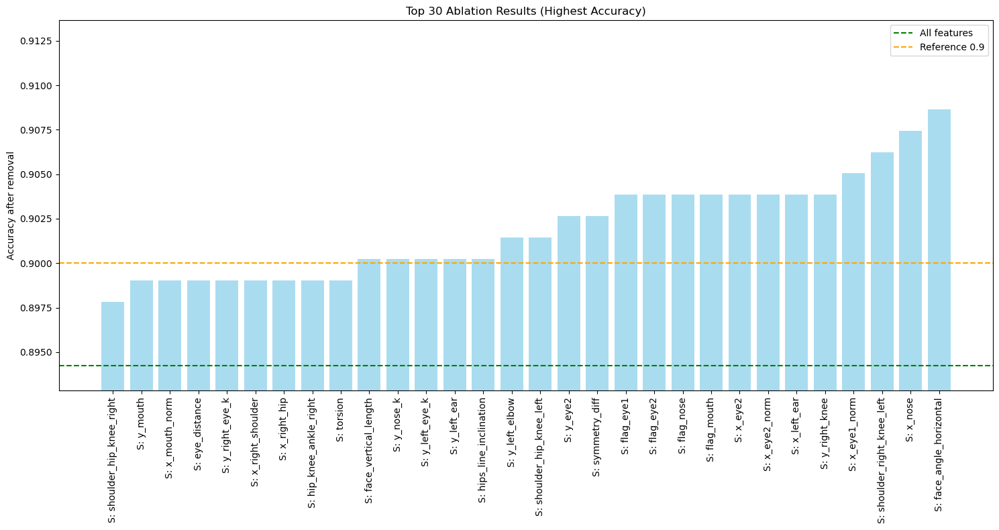

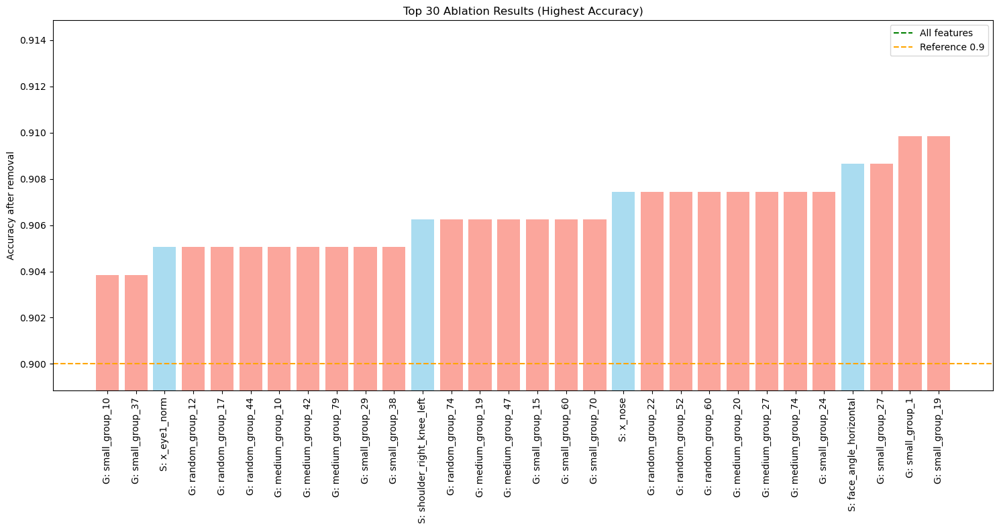

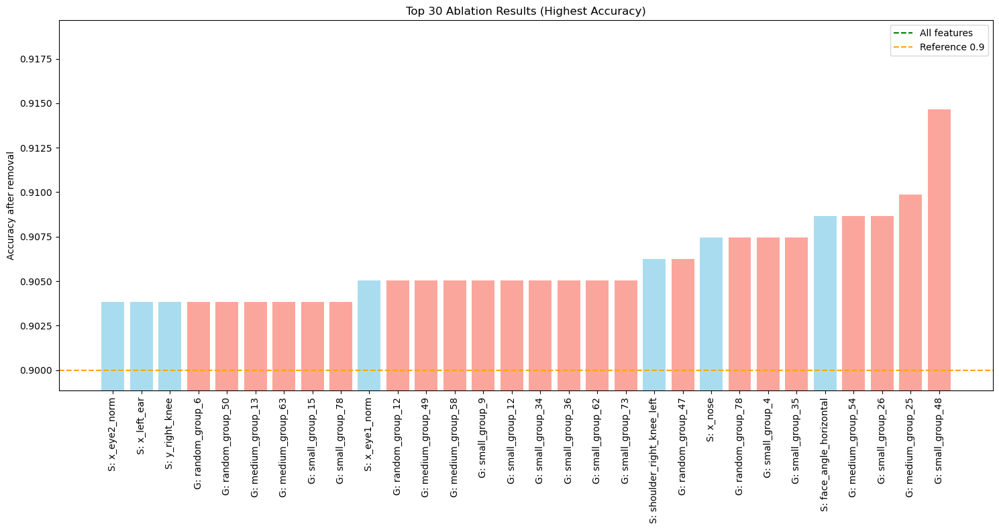

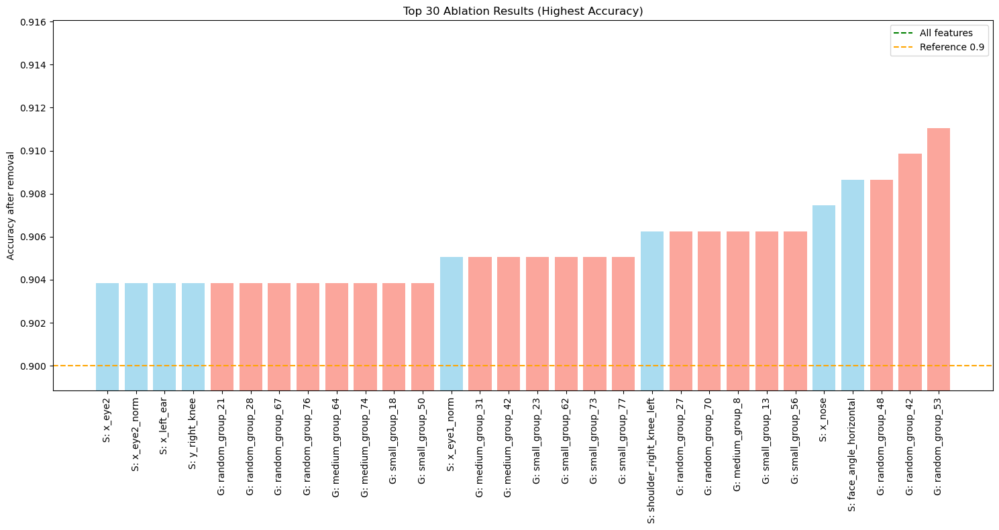


########## RUN 14/20 ##########


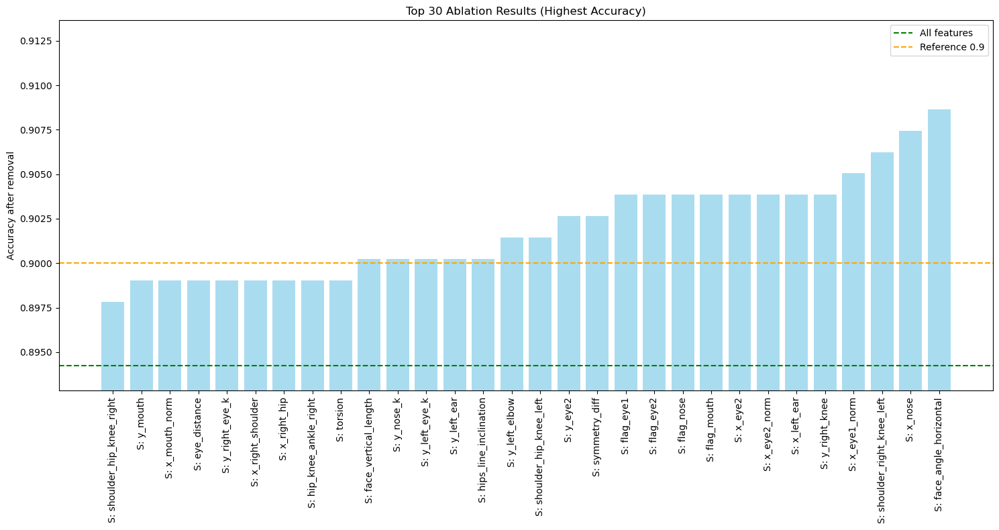

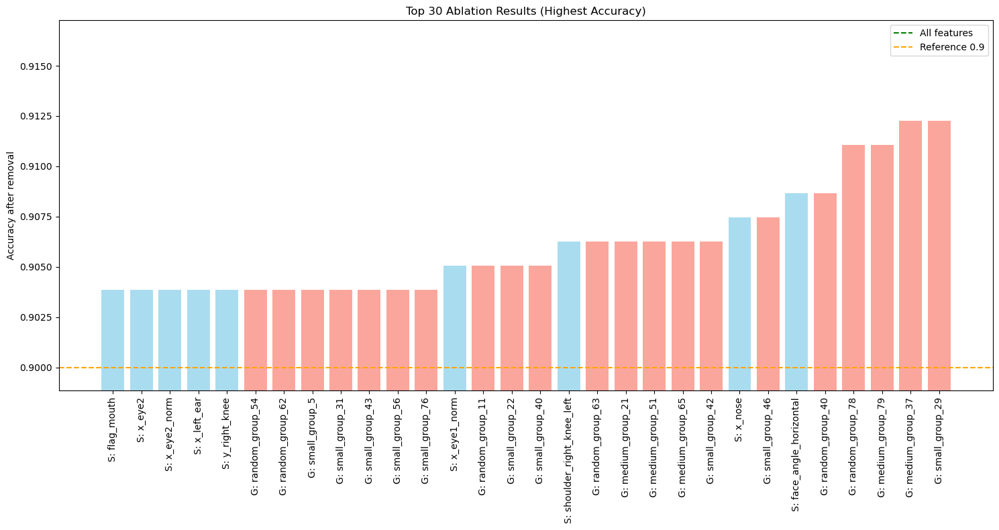

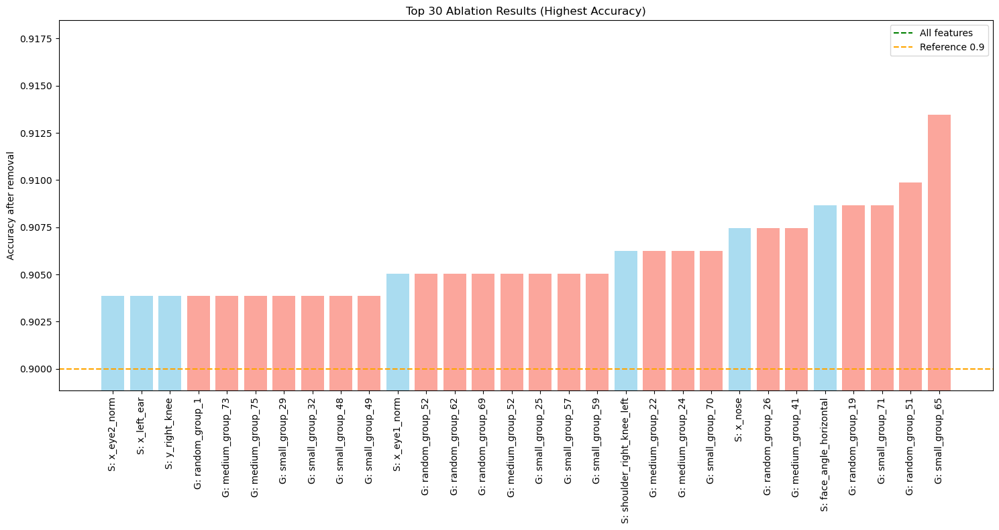

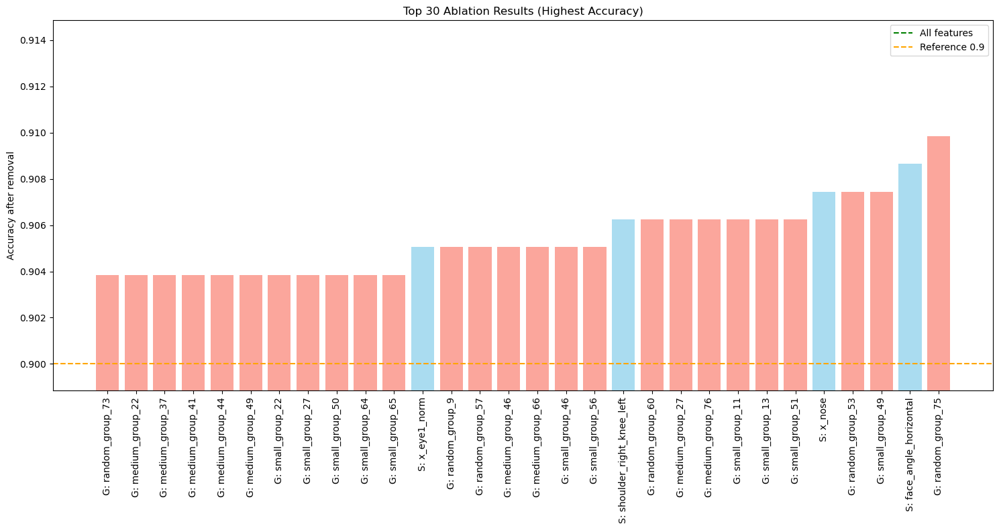


########## RUN 15/20 ##########


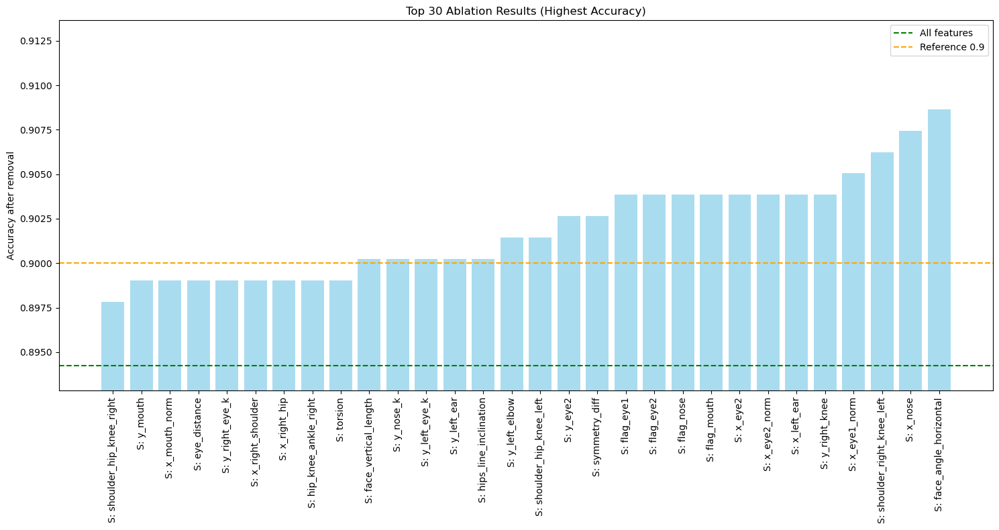

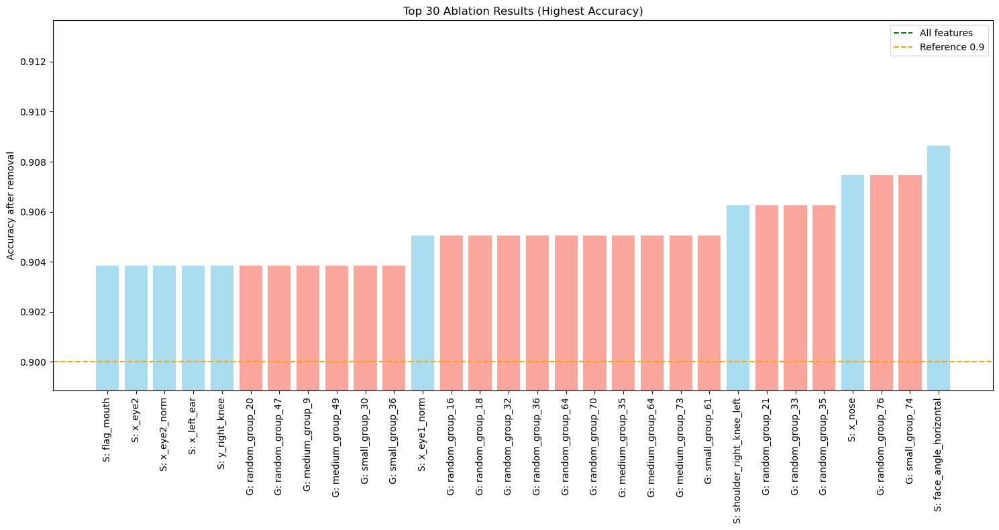

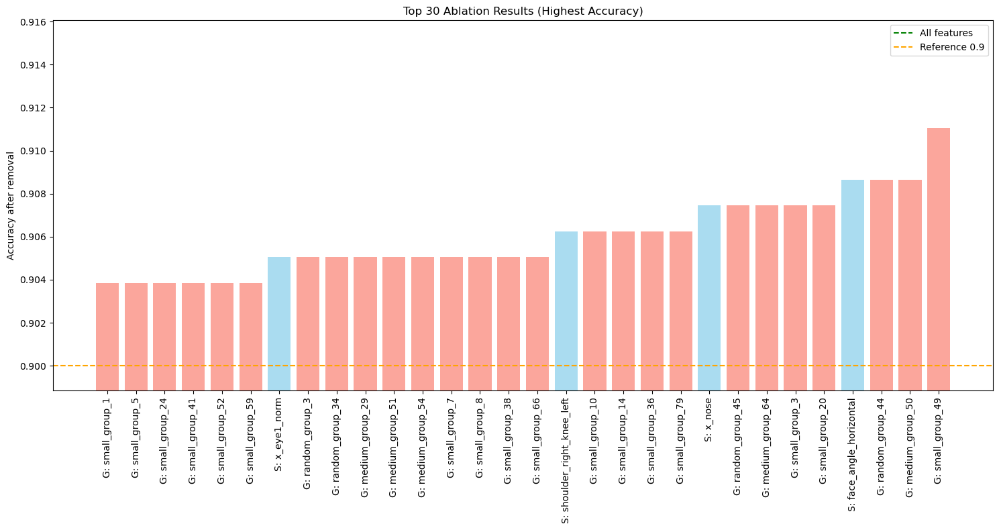

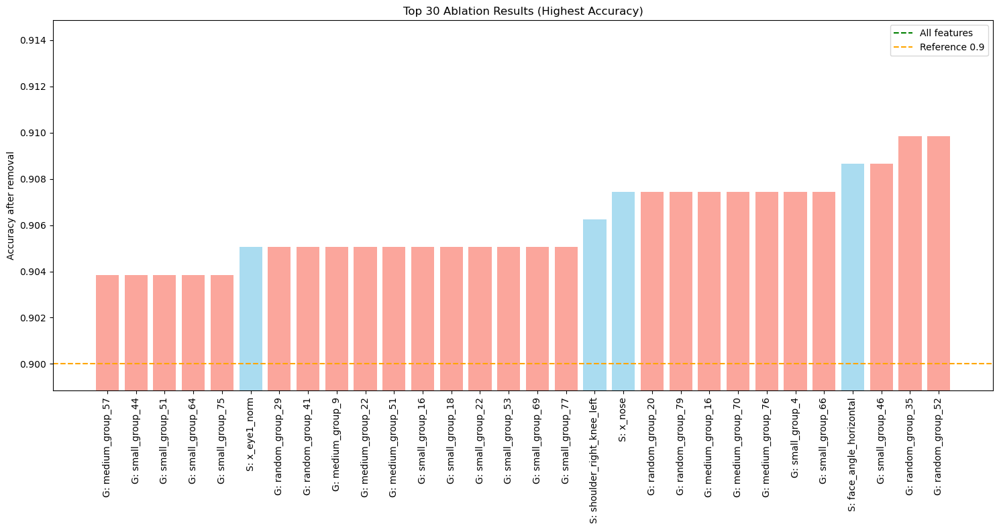


########## RUN 16/20 ##########


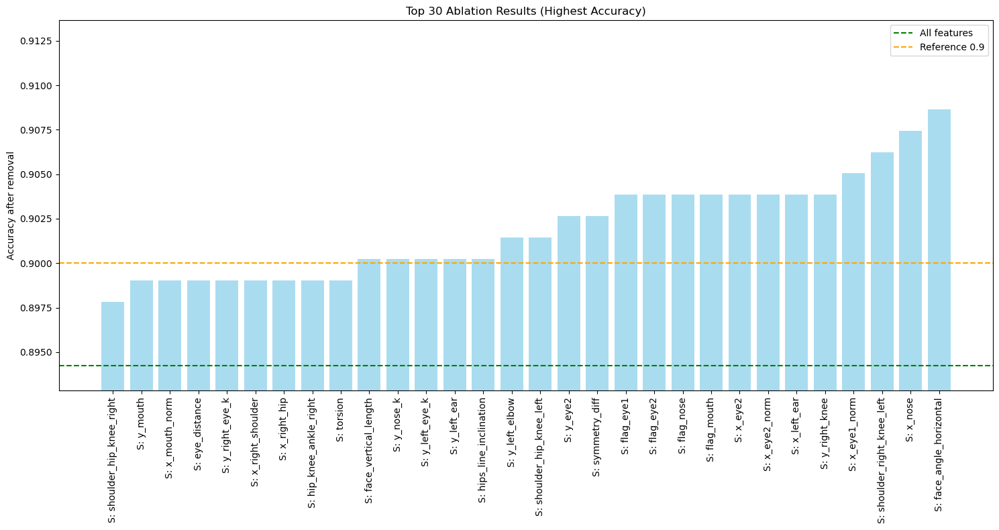

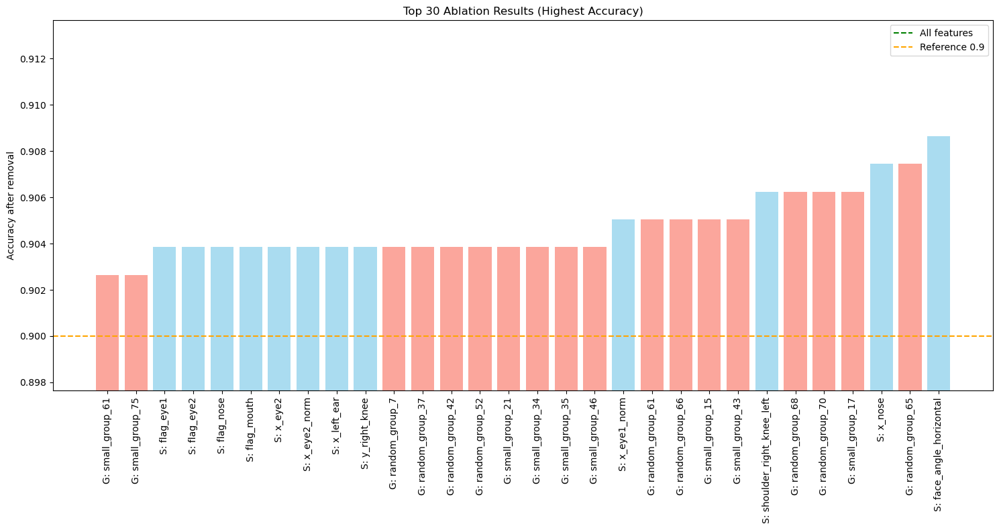

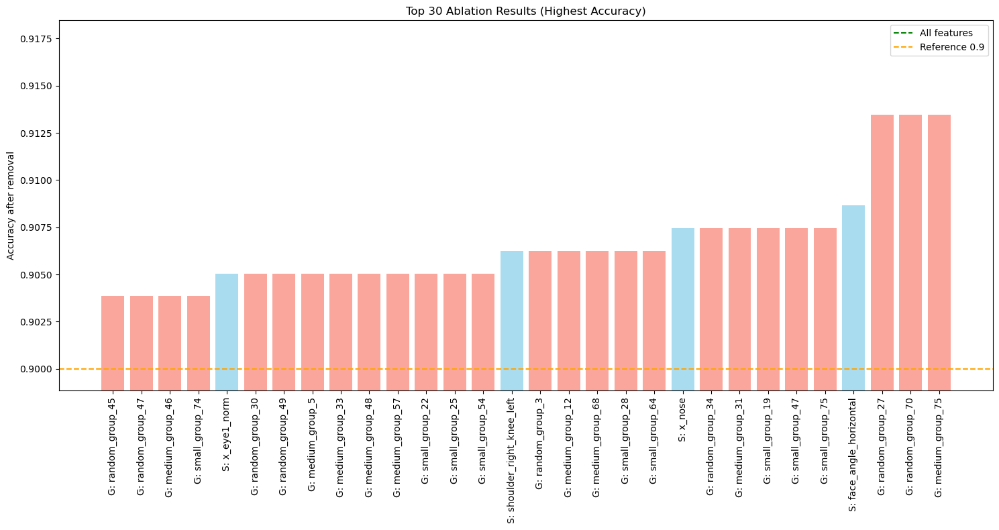

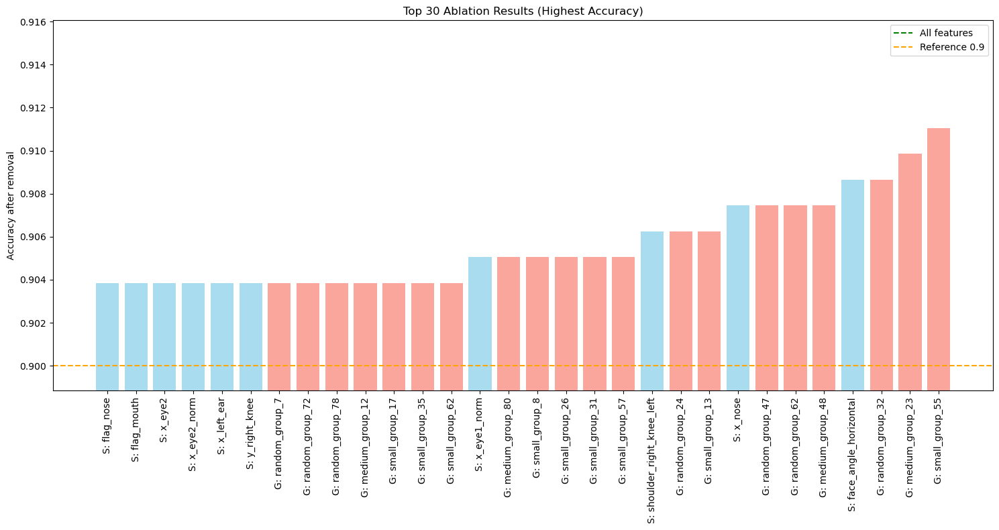


########## RUN 17/20 ##########


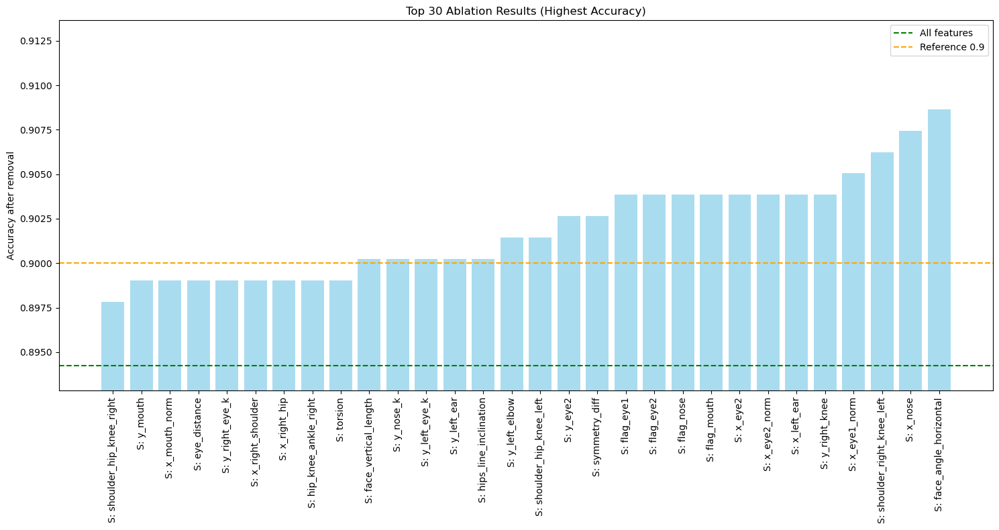

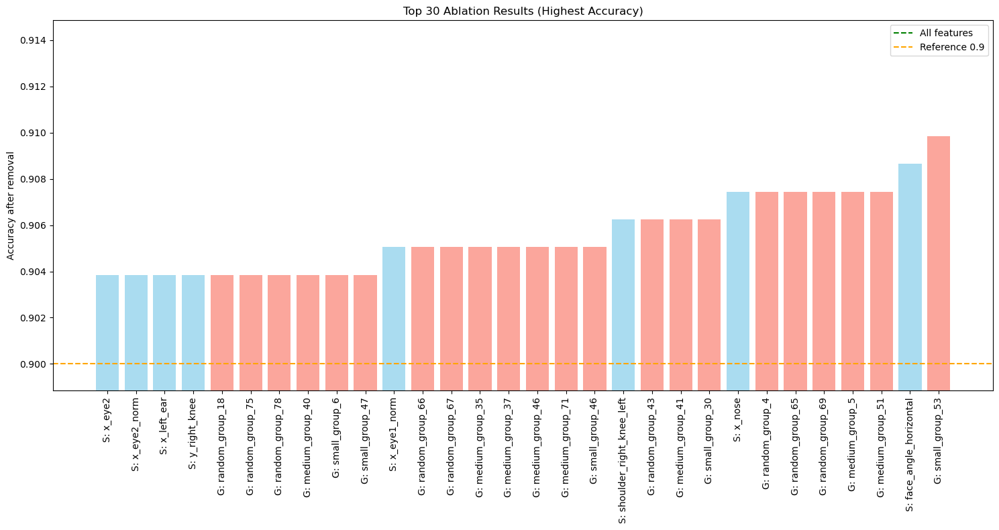

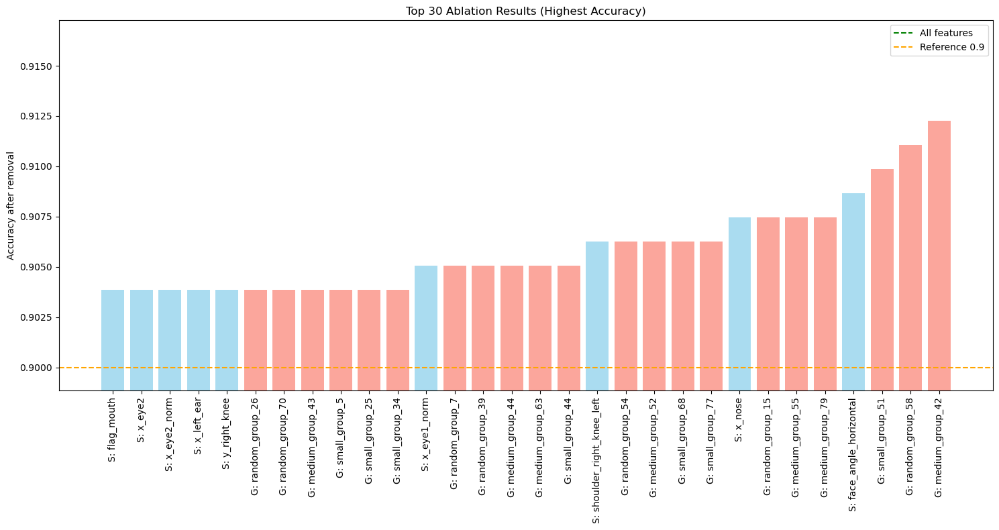

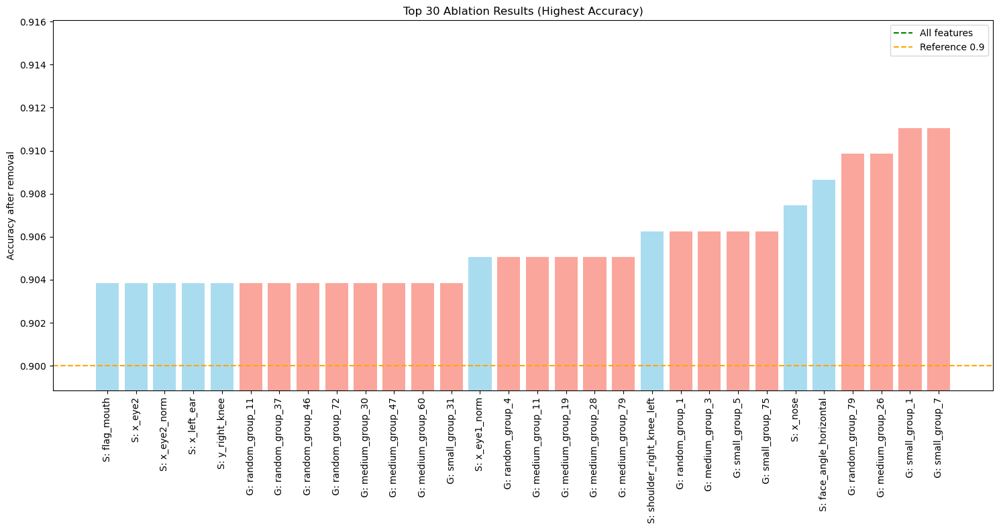


########## RUN 18/20 ##########


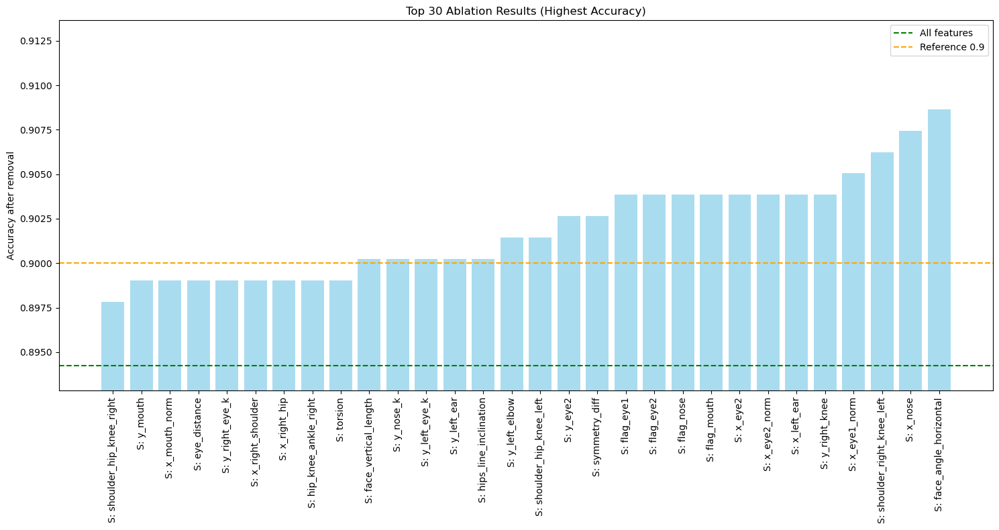

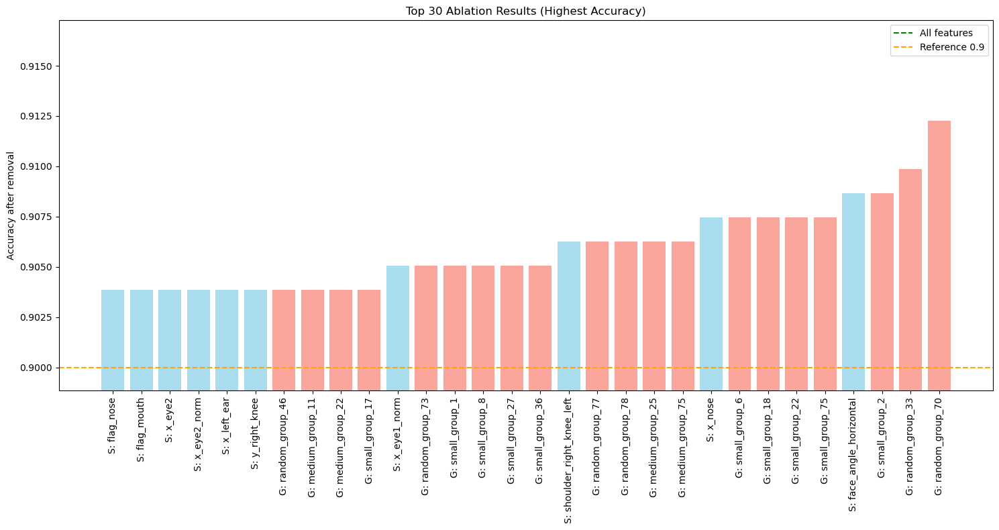

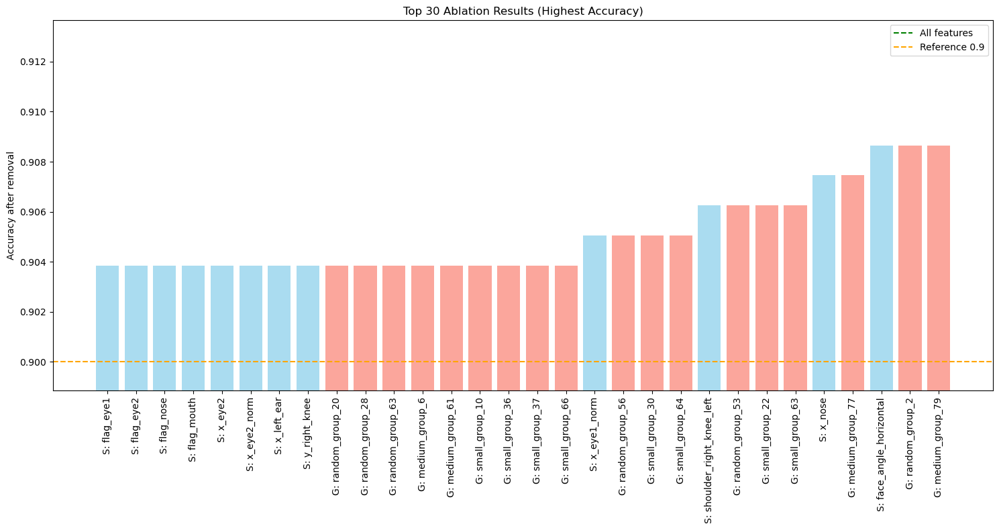


########## RUN 19/20 ##########


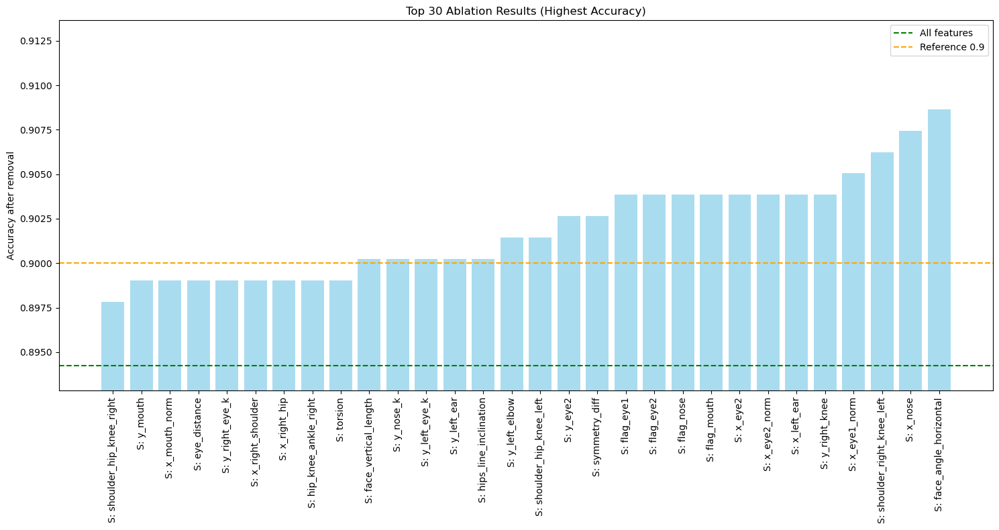

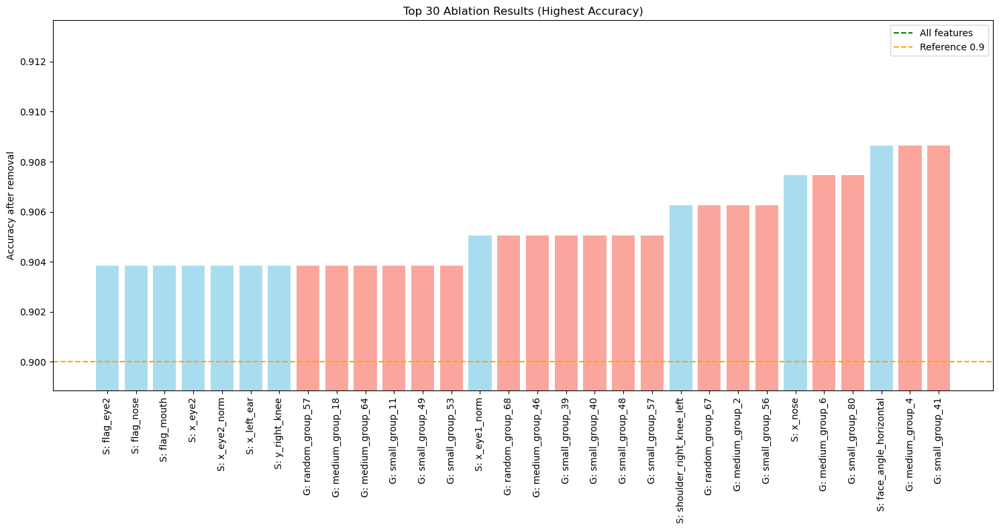

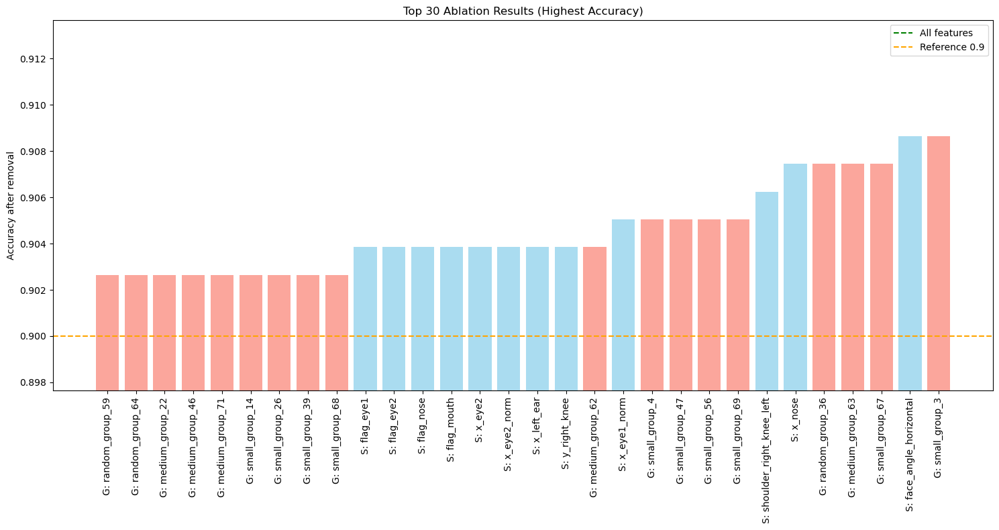

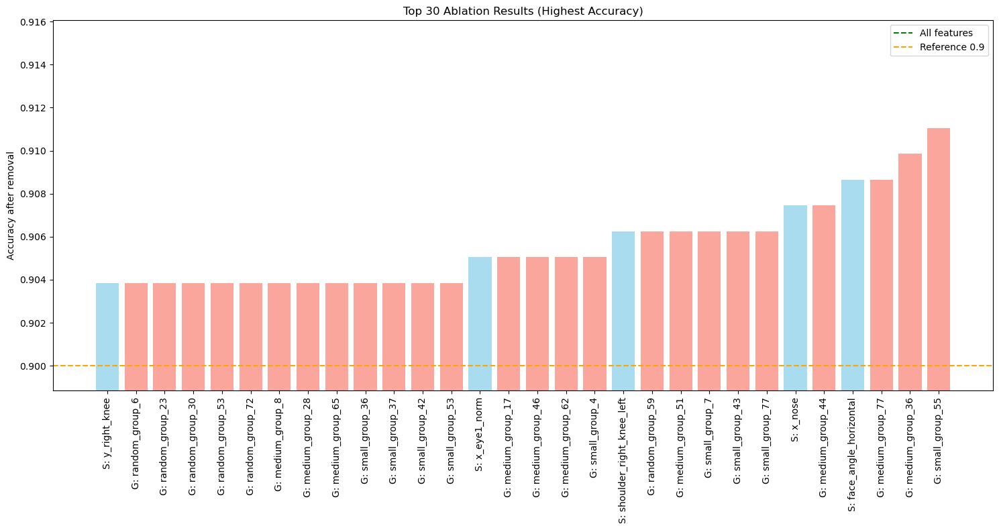

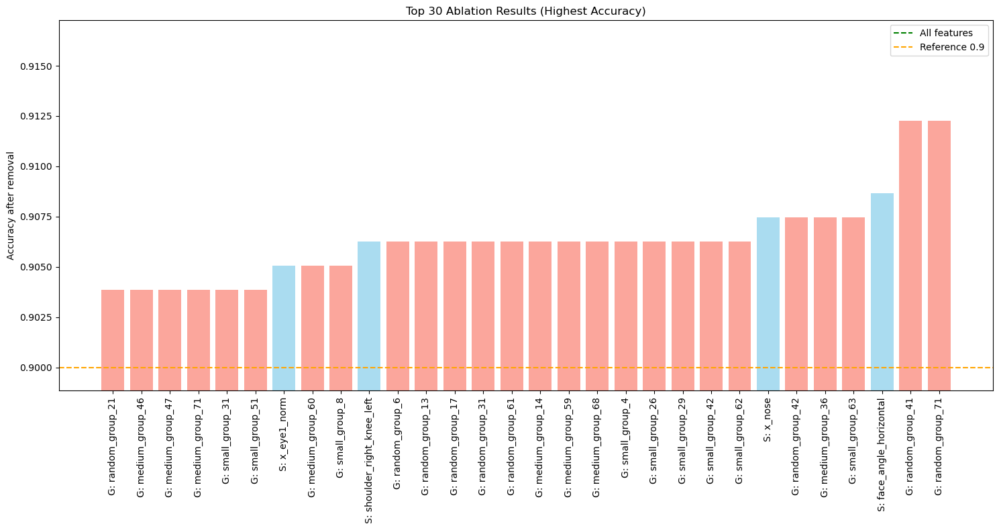

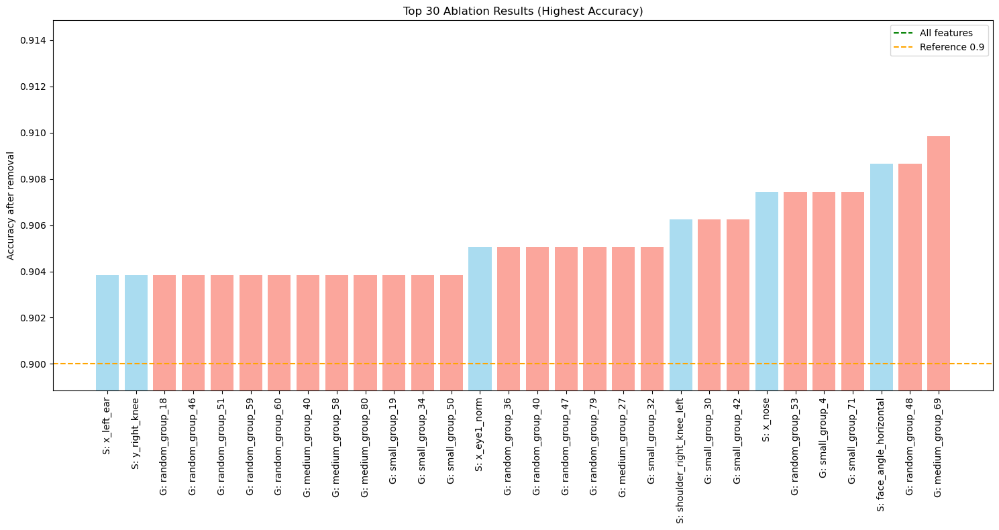


########## RUN 20/20 ##########


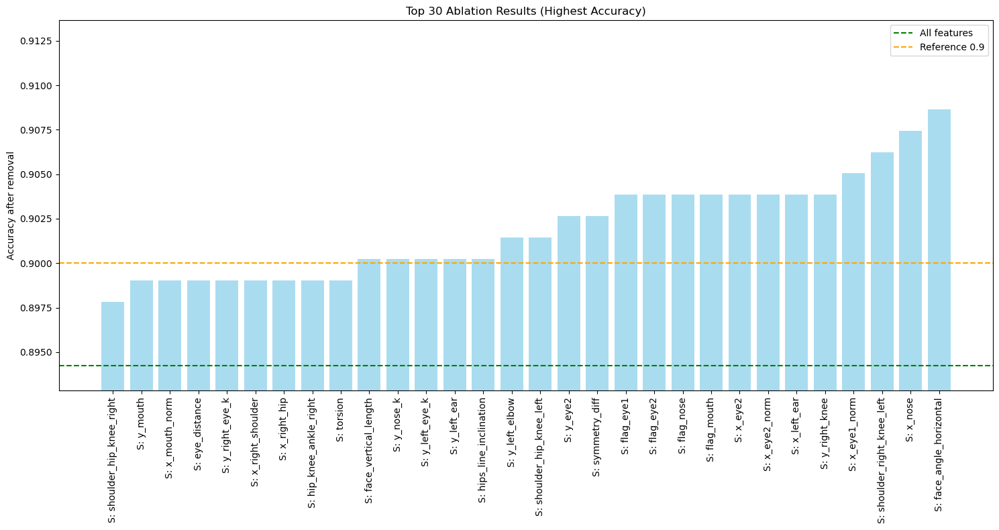

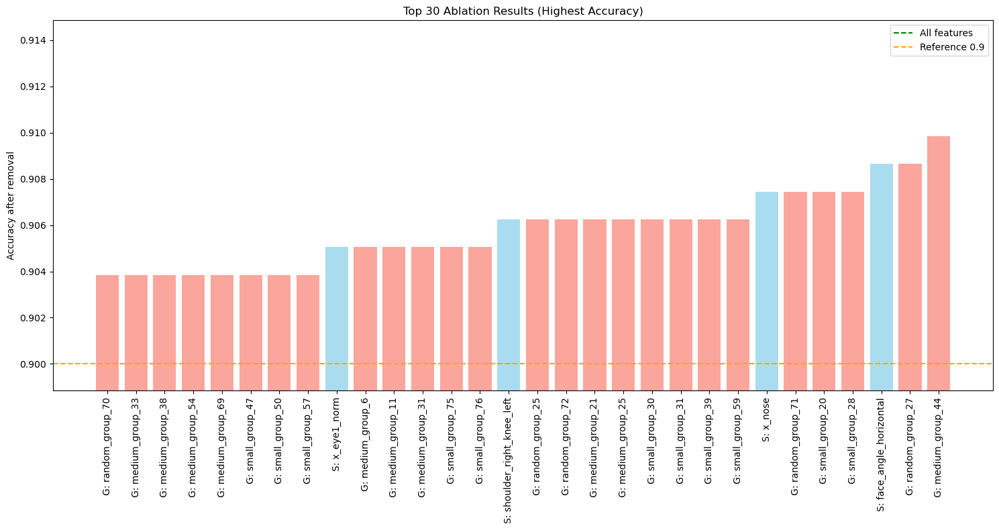

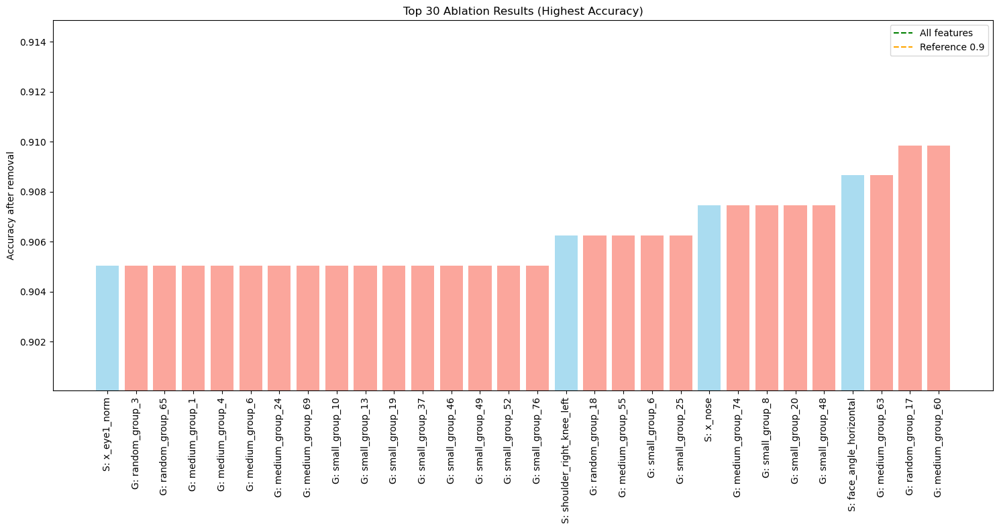

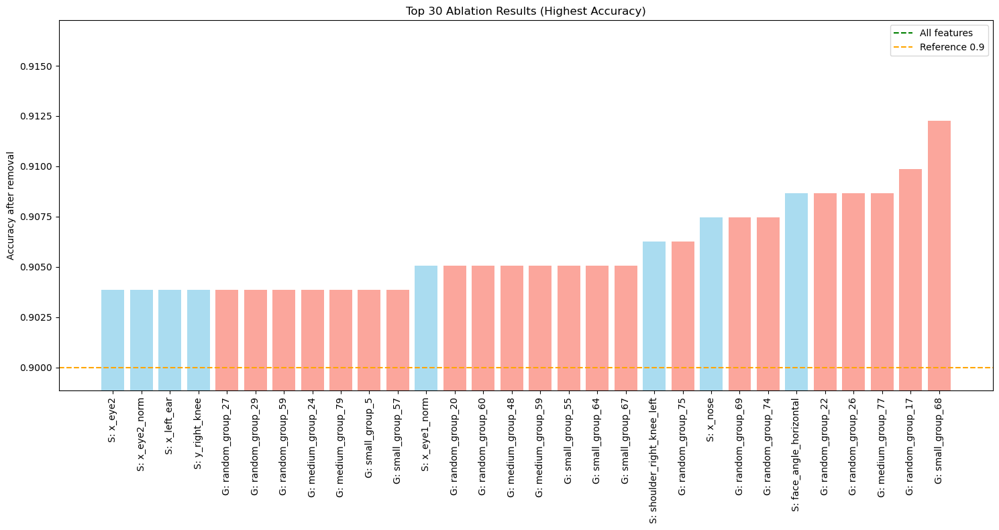

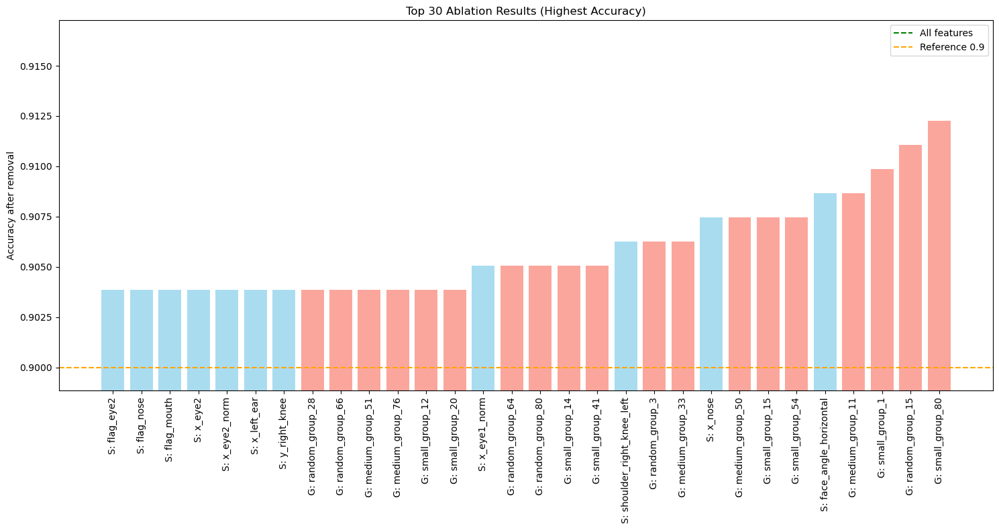

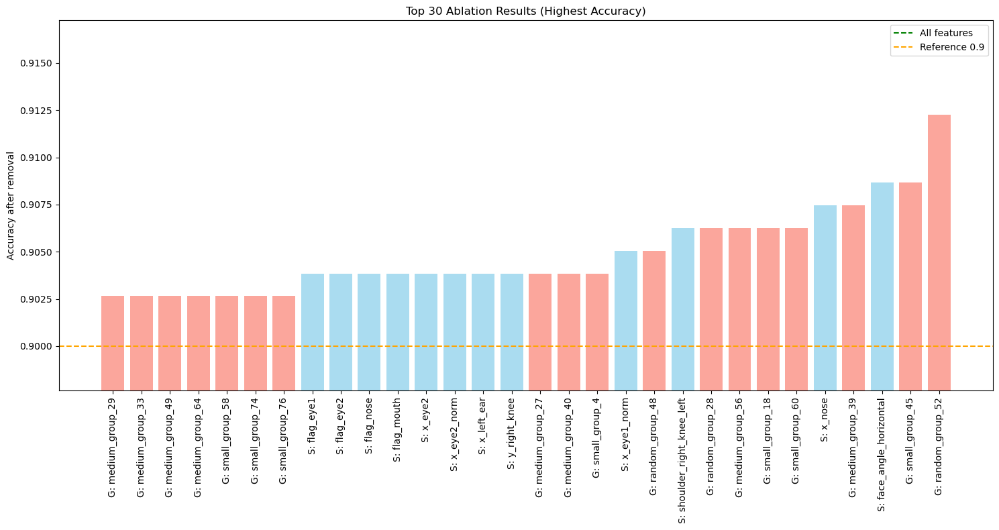

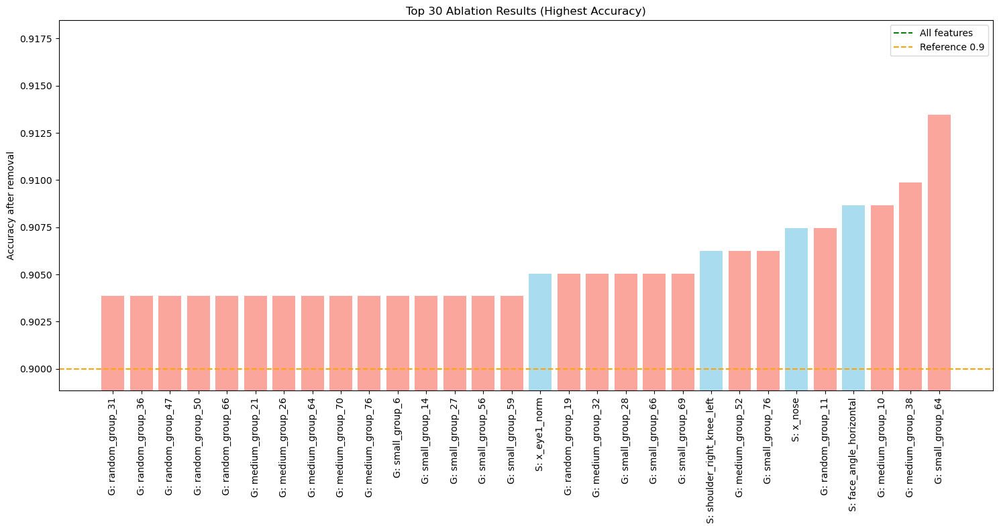

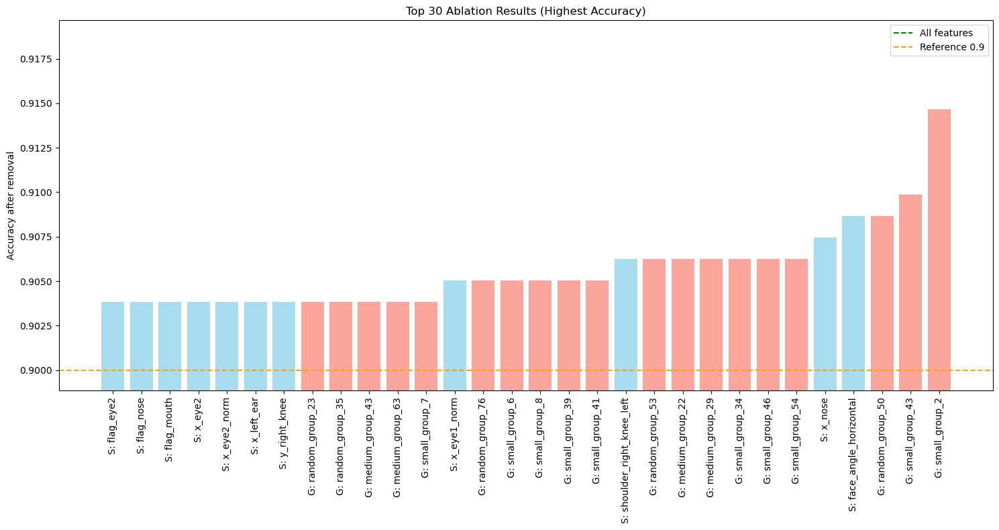

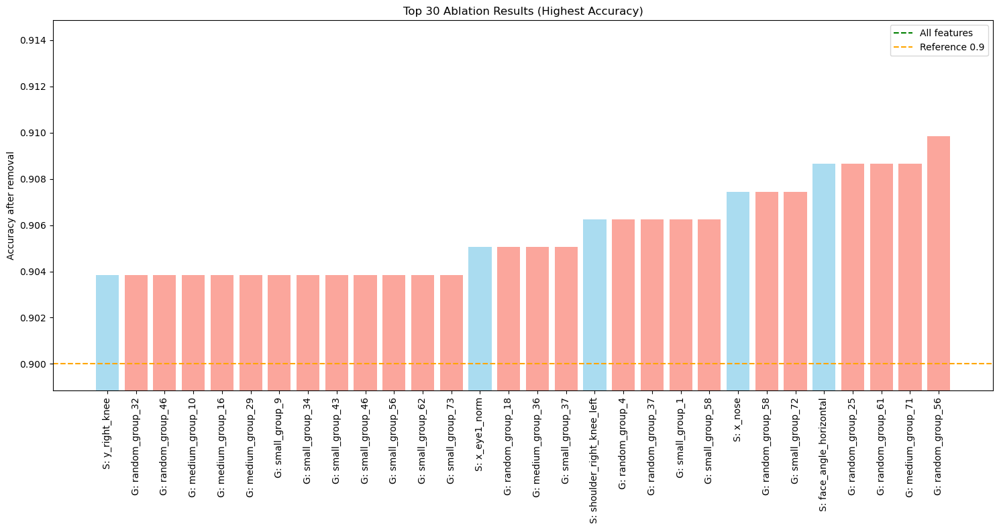


=== RISULTATO FINALE ===
Miglior accuracy: 0.9171
Feature rimanenti: 82


In [50]:
best_acc = 0
embeddings_current_best = None
history_best = None

for i in range(20):
    print(f"\n########## RUN {i+1}/20 ##########")
    embeddings_current, history= clf.iterative_ablation(model=xgbc_2,
                                                        embeddings= embeddings,
                                                        y=emb_builder.y,
                                                        classes_bs=emb_builder.classes_bs,
                                                        max_cycles=50,
                                                        n_very_big_groups=10,
                                                        very_big_group_size=10,
                                                        n_big_groups=80, big_group_size=7,
                                                        n_medium_groups=80, medium_group_size=5,
                                                        n_small_groups=80, small_group_size=3,
                                                        n_very_small_groups=80, very_small_group_size=2,
                                                        verbose=False)
    # accuracy finale della run corrente
    final_acc = history[-1][2] if history else 0

    if final_acc > best_acc:
        best_acc = final_acc
        embeddings_current_best = embeddings_current.copy()
        history_best = history
        print(f"✅ Nuovo best trovato: {best_acc:.4f} (run {i+1})")

print("\n=== RISULTATO FINALE ===")
print(f"Miglior accuracy: {best_acc:.4f}")
print(f"Feature rimanenti: {len(embeddings_current_best.columns)}")

In [57]:
embeddings_current_best

,flag_eye1,flag_eye2,flag_nose,flag_mouth,x_eye1,y_eye1,x_eye2,y_eye2,x_nose,y_nose,...,elbow_shoulder_hip_left,shoulder_elbow_wrist_right,shoulder_elbow_wrist_left,shoulder_hip_knee_right,shoulder_hip_knee_left,hip_knee_ankle_right,hip_knee_ankle_left,shoulders_line_inclination,hips_line_inclination,torsion
0,1.149049,1.804407,1.283247,1.432782,0.744004,1.171259,1.266177,2.077055,0.889389,1.448553,...,-0.039226,0.383192,1.333039,-1.560886,-0.279976,-0.757539,-0.309450,0.762444,0.771932,-0.178298
1,-0.870285,-0.554199,-0.779273,-0.697943,-0.848735,-0.849216,-0.543968,-0.543508,-0.763265,-0.763640,...,-0.312096,-0.441721,-0.310077,-0.660085,-0.007140,-0.642934,0.846223,0.826658,0.726091,0.063336
2,1.149049,1.804407,1.283247,1.432782,1.144892,1.525461,1.977592,2.250430,1.365611,1.633352,...,-0.766569,0.584658,-0.077770,-0.747222,-1.877684,-1.091977,-0.251775,-2.130845,-2.064125,0.153427
3,1.149049,1.804407,1.283247,1.432782,1.030433,1.629509,1.383516,2.332998,0.999428,1.723035,...,-0.321757,0.728416,1.578343,0.772588,1.022744,-1.544667,0.027959,-0.343697,-0.365684,-0.327219
4,-0.870285,-0.554199,-0.779273,-0.697943,-0.848735,-0.849216,-0.543968,-0.543508,-0.763265,-0.763640,...,-0.260608,-0.542733,-0.279691,0.132038,-0.155015,-0.407035,0.766075,0.024762,-0.004783,-0.313672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4153,-0.870285,-0.554199,-0.779273,-0.697943,-0.848735,-0.849216,-0.543968,-0.543508,-0.763265,-0.763640,...,-0.915695,0.363045,1.376159,1.275954,0.035691,0.815298,0.072900,-0.074562,0.067592,0.517721
4154,-0.870285,-0.554199,-0.779273,-0.697943,-0.848735,-0.849216,-0.543968,-0.543508,-0.763265,-0.763640,...,-0.016196,-0.034506,0.215674,-0.114898,-0.314442,-0.697620,0.609507,-2.110186,-2.122177,-0.253606
4155,1.149049,-0.554199,-0.779273,-0.697943,0.633523,1.157882,-0.543968,-0.543508,-0.763265,-0.763640,...,-1.570872,-1.485537,-1.493745,-1.892909,-1.902240,-1.544667,-1.576686,-0.237623,-0.262267,-0.397538
4156,-0.870285,-0.554199,-0.779273,-0.697943,-0.848735,-0.849216,-0.543968,-0.543508,-0.763265,-0.763640,...,-0.185316,-0.805833,-1.161724,1.150812,0.980580,1.278618,0.348774,0.590647,0.532625,-0.159470


In [58]:
cols_diff = set(embeddings_current_best.columns) ^ set(embeddings.columns)
print("Colonne presenti solo in uno dei due DF:", cols_diff)

Colonne presenti solo in uno dei due DF: {'x_left_elbow', 'x_left_hip'}


In [59]:
clf = Classifier(embeddings_current_best, emb_builder.y, emb_builder.classes_bs,figsize = (10, 6))

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


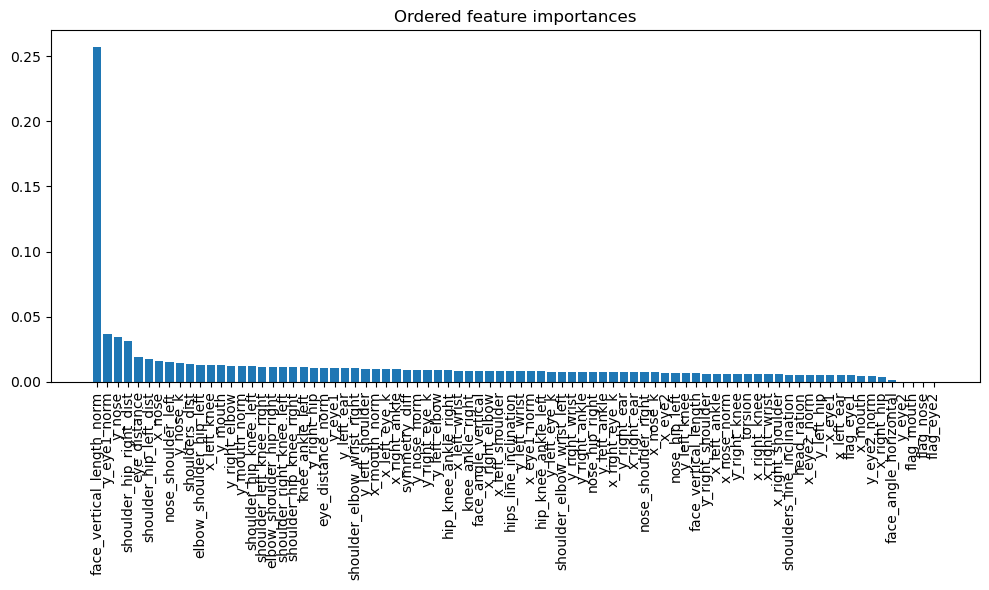

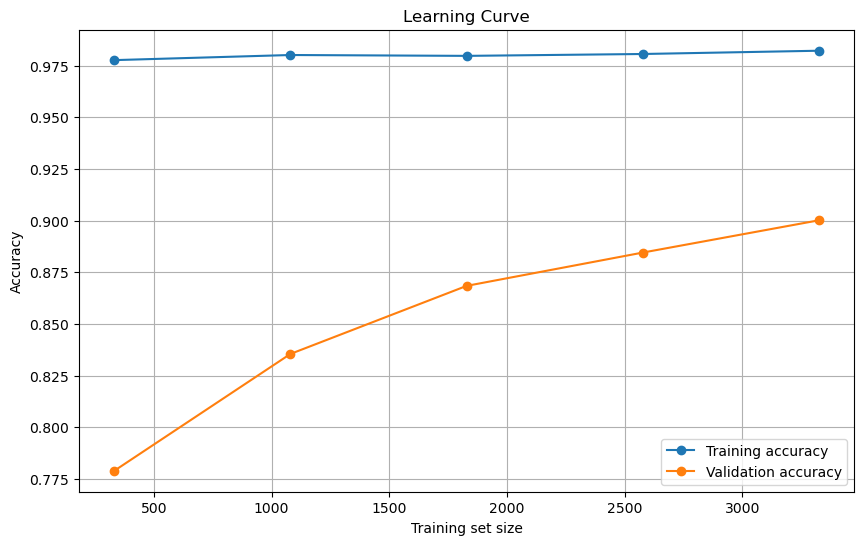


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.93      0.90      0.92       423
 baby_unsafe       0.90      0.93      0.92       409

    accuracy                           0.92       832
   macro avg       0.92      0.92      0.92       832
weighted avg       0.92      0.92      0.92       832

Confusion matrix---------------------------------------


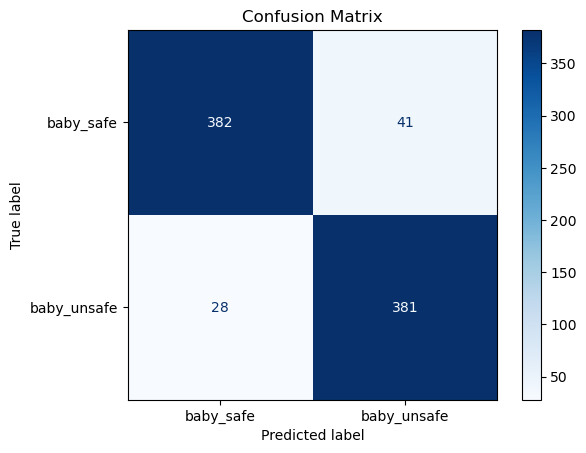

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


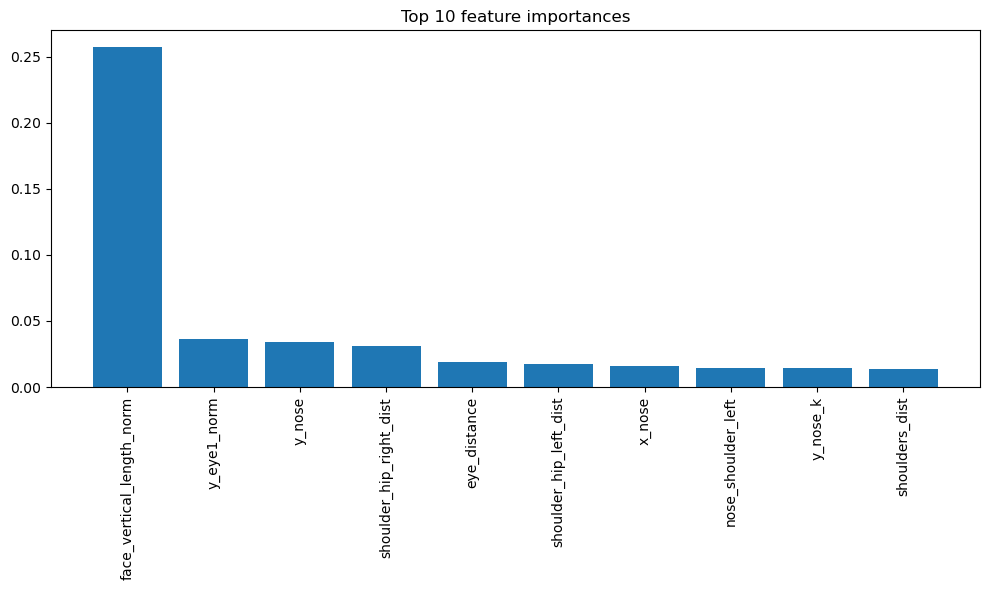

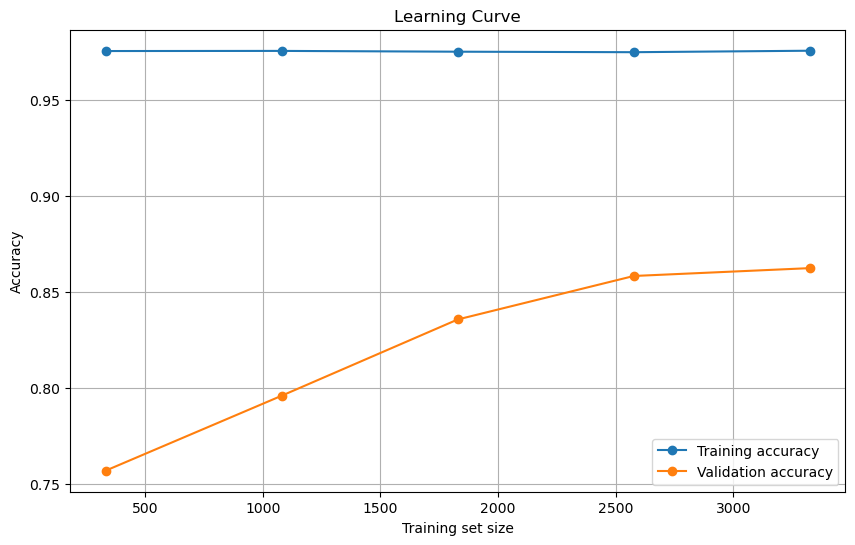


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.86      0.84      0.85       423
 baby_unsafe       0.84      0.86      0.85       409

    accuracy                           0.85       832
   macro avg       0.85      0.85      0.85       832
weighted avg       0.85      0.85      0.85       832

Confusion matrix---------------------------------------


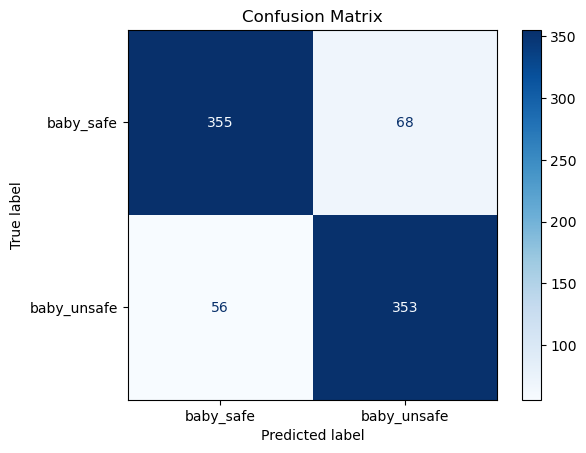

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


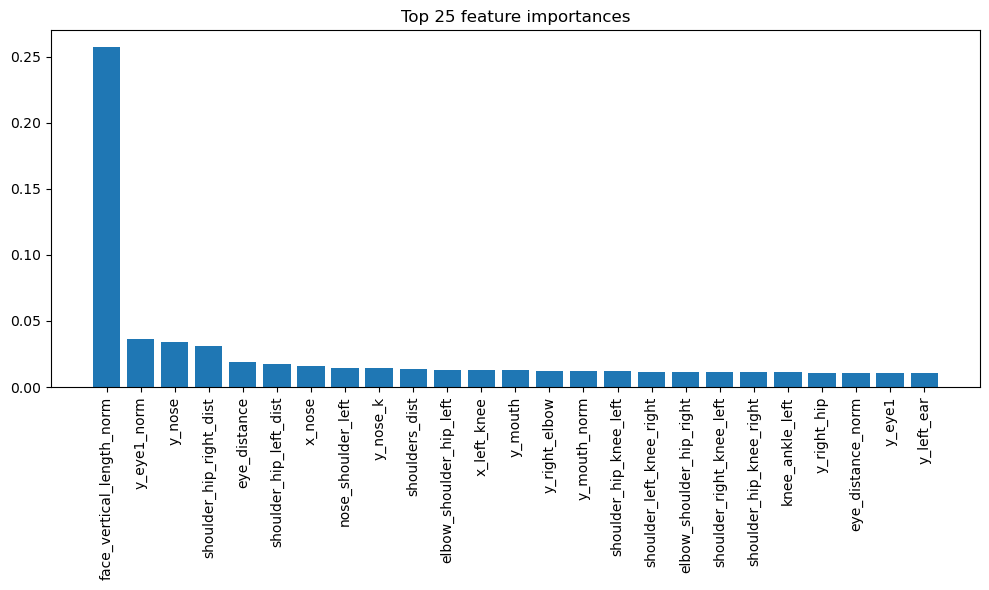

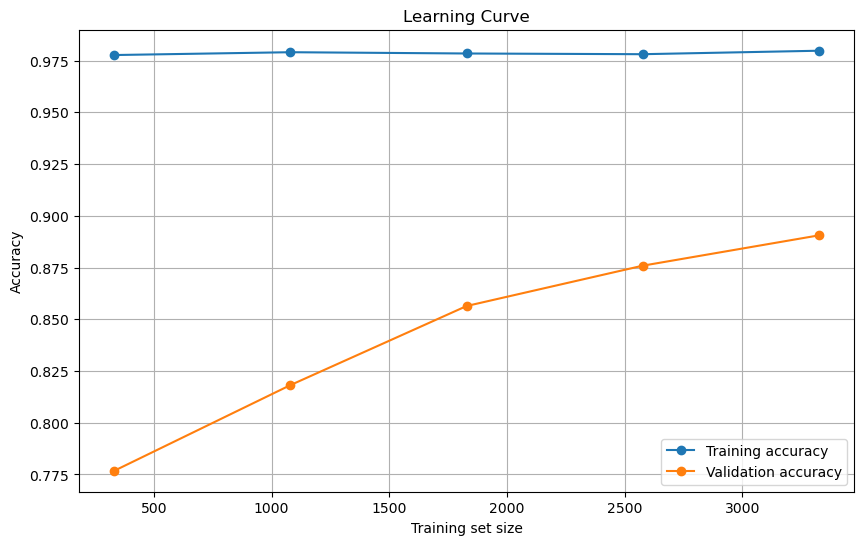


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.89      0.87      0.88       423
 baby_unsafe       0.87      0.89      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


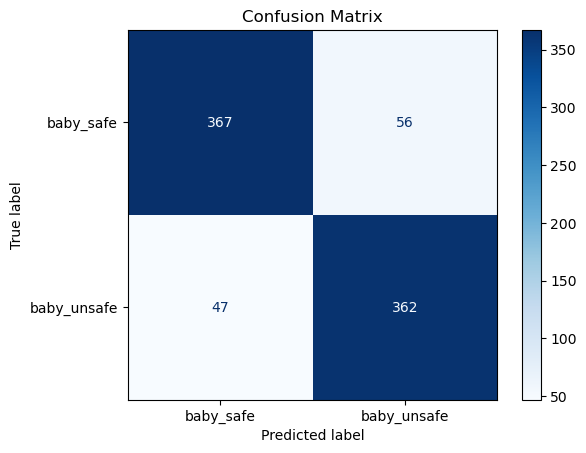

{'all_features': {'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=np.float64(0.9942601816442402), device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, feature_weights=None,
                gamma=np.float64(0.1210276357557502), grow_policy=None,
                importance_type=None, interaction_constraints=None,
                learning_rate=np.float64(0.21164066422176356), max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=5, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                multi_strategy=None, n_estimators=283, n_jobs=None,
                num_parallel_tree=None, ...),
  'X': array([[      1.149,      1.8044,      1.2832, ...,     0.76244,     0.77193,

In [60]:
clf.evaluation_pipeline(xgbc_2,verbose=True)

We have now observed a performance increase to 0.92, but there is still one feature standing out as extremely dominant. We will try removing it.

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


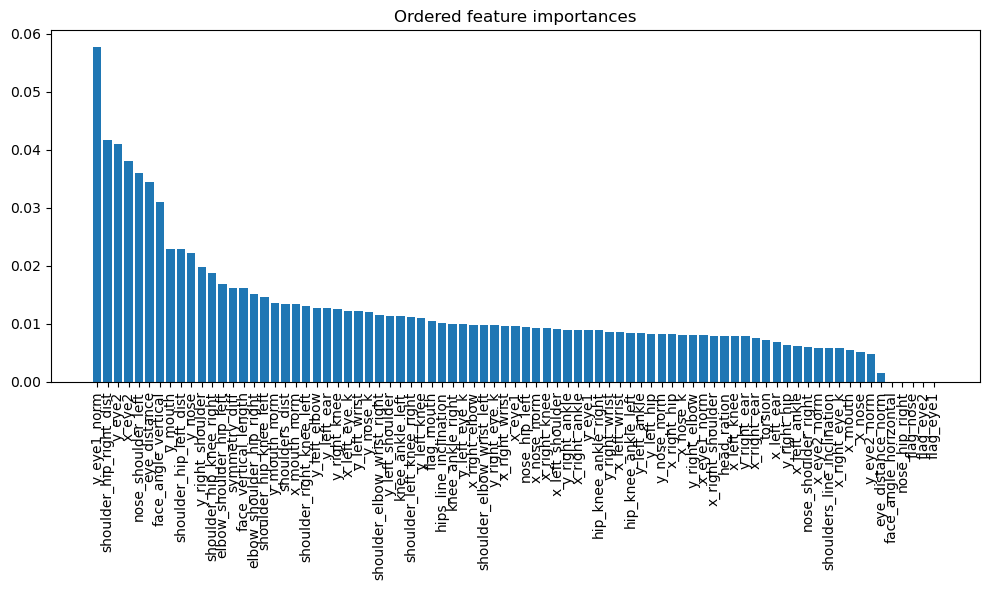

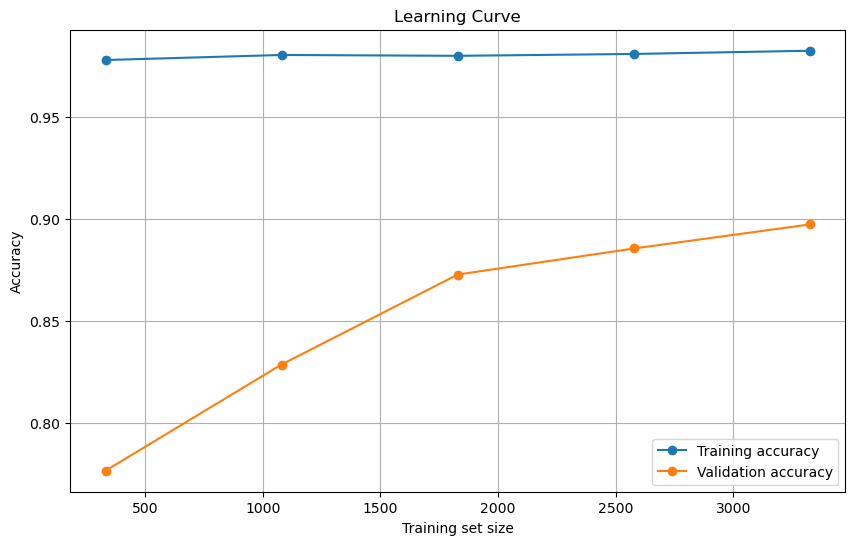


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.91      0.89      0.90       423
 baby_unsafe       0.89      0.91      0.90       409

    accuracy                           0.90       832
   macro avg       0.90      0.90      0.90       832
weighted avg       0.90      0.90      0.90       832

Confusion matrix---------------------------------------


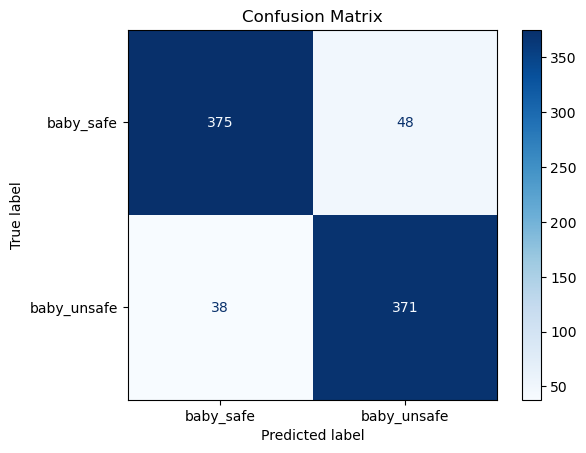

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


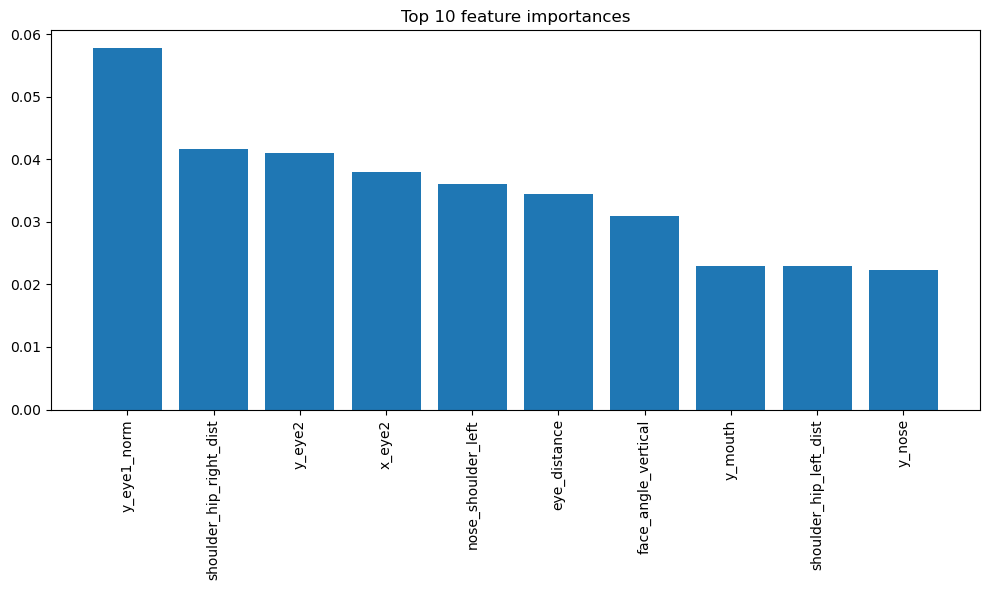

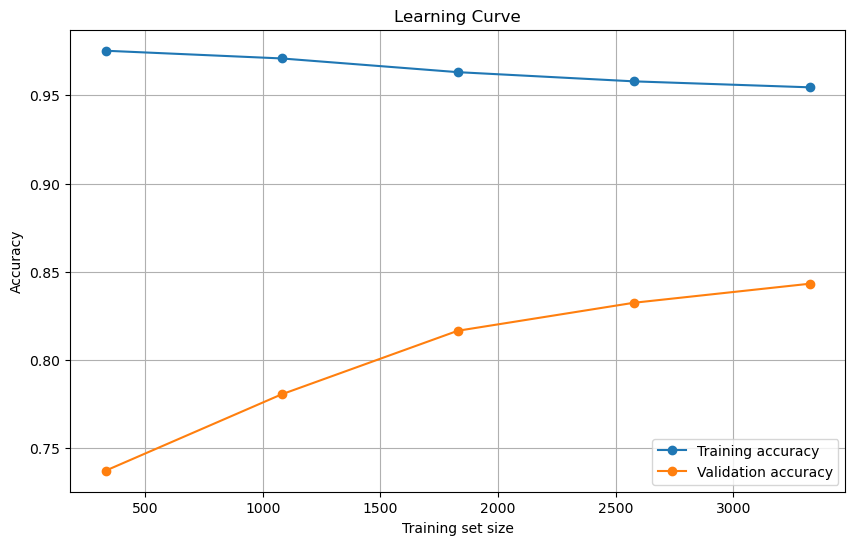


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.81      0.81      0.81       423
 baby_unsafe       0.81      0.81      0.81       409

    accuracy                           0.81       832
   macro avg       0.81      0.81      0.81       832
weighted avg       0.81      0.81      0.81       832

Confusion matrix---------------------------------------


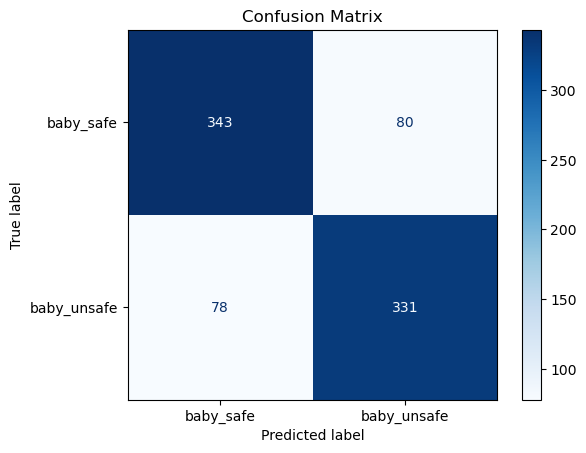

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


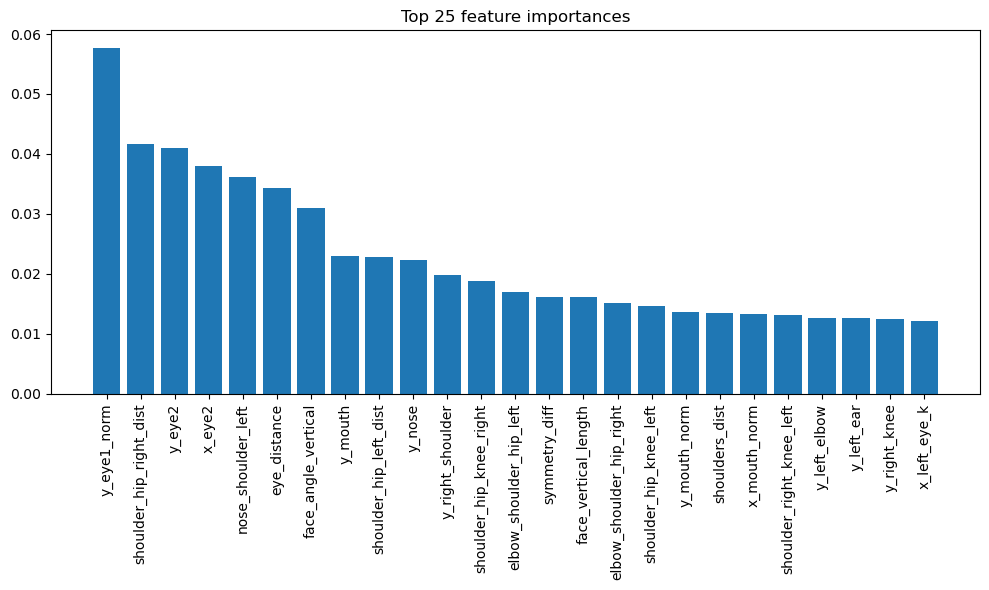

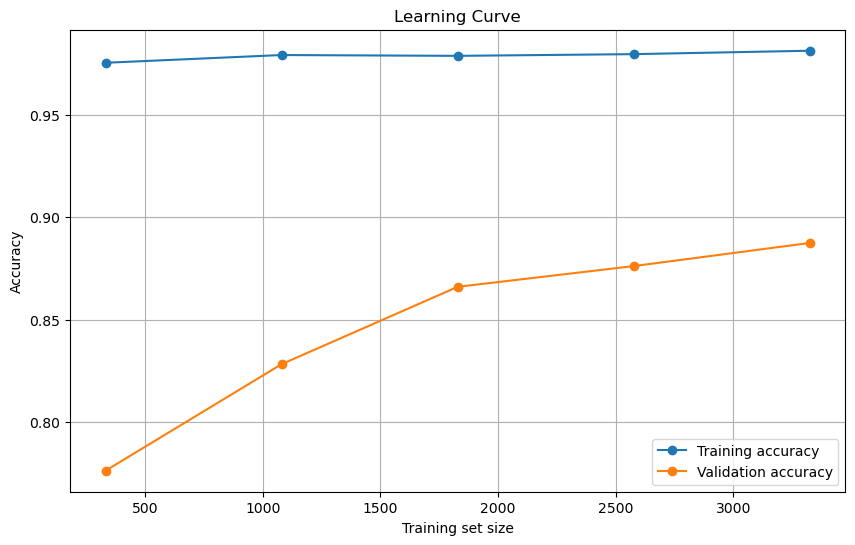


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.87      0.89       423
 baby_unsafe       0.87      0.90      0.89       409

    accuracy                           0.89       832
   macro avg       0.89      0.89      0.89       832
weighted avg       0.89      0.89      0.89       832

Confusion matrix---------------------------------------


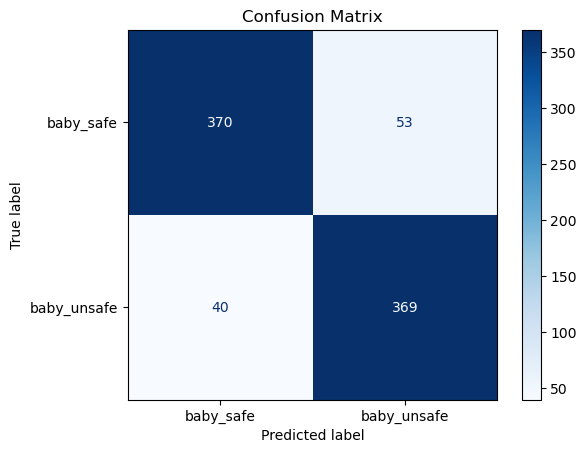

{'all_features': {'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=np.float64(0.9942601816442402), device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, feature_weights=None,
                gamma=np.float64(0.1210276357557502), grow_policy=None,
                importance_type=None, interaction_constraints=None,
                learning_rate=np.float64(0.21164066422176356), max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=5, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                multi_strategy=None, n_estimators=283, n_jobs=None,
                num_parallel_tree=None, ...),
  'X': array([[      1.149,      1.8044,      1.2832, ...,     0.76244,     0.77193,

In [63]:
df = embeddings_current_best.copy()
df.drop("face_vertical_length_norm",axis=1,inplace=True)
clf = Classifier(df, emb_builder.y, emb_builder.classes_bs,figsize = (10, 6))
clf.evaluation_pipeline(xgbc_2,verbose=True)

The performance has slightly decreased, but we have gained better generalization. Now we try to delete feature that do not contribute

In [79]:
df.drop(["face_angle_horizontal","nose_hip_right","flag_nose","flag_eye2","flag_eye1"],axis=1,inplace=False)

KeyError: "['face_angle_horizontal', 'nose_hip_right', 'flag_nose', 'flag_eye2', 'flag_eye1'] not found in axis"

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


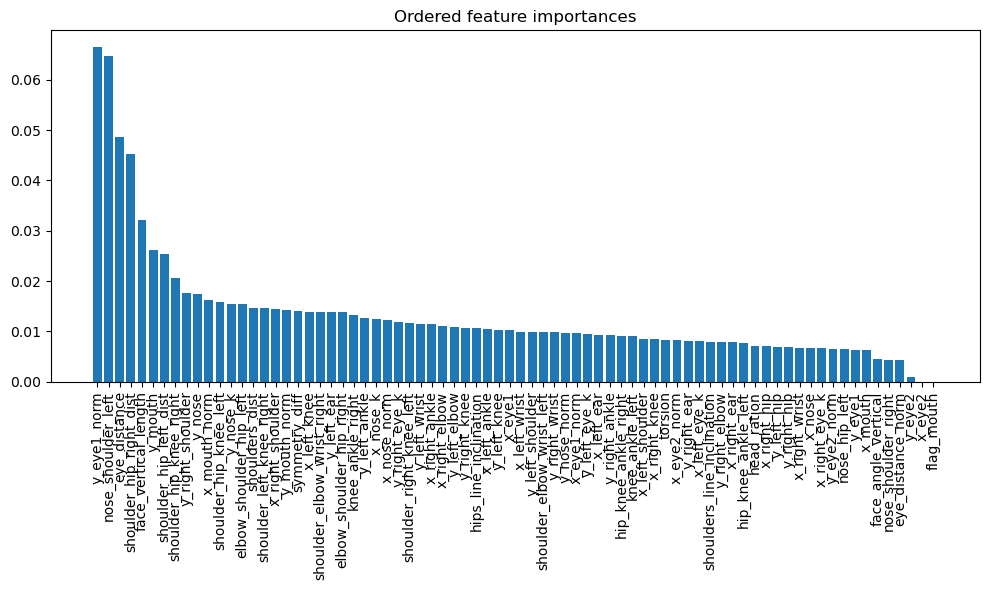

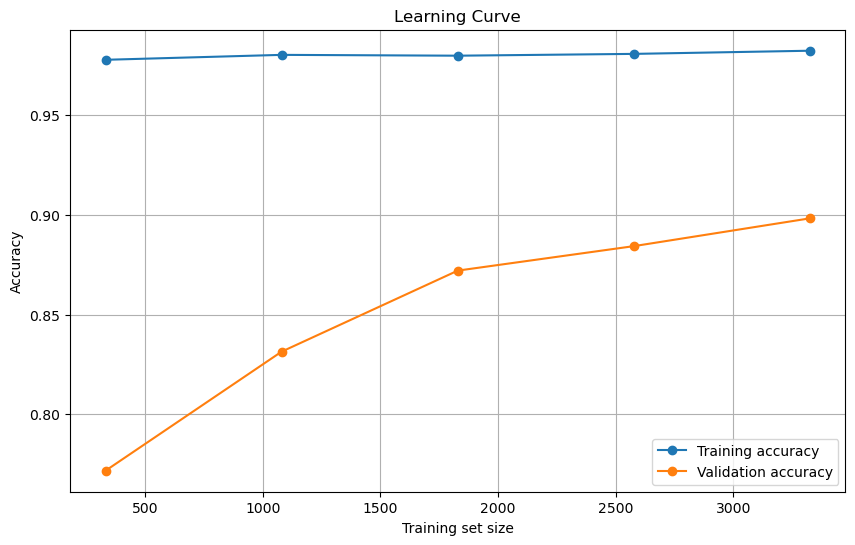


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.91      0.87      0.89       423
 baby_unsafe       0.88      0.91      0.89       409

    accuracy                           0.89       832
   macro avg       0.89      0.89      0.89       832
weighted avg       0.89      0.89      0.89       832

Confusion matrix---------------------------------------


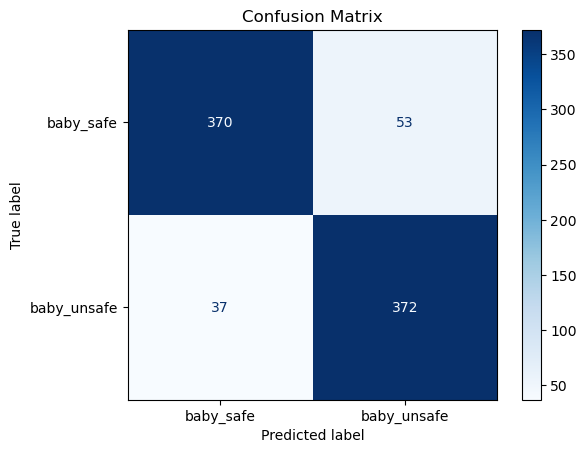

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


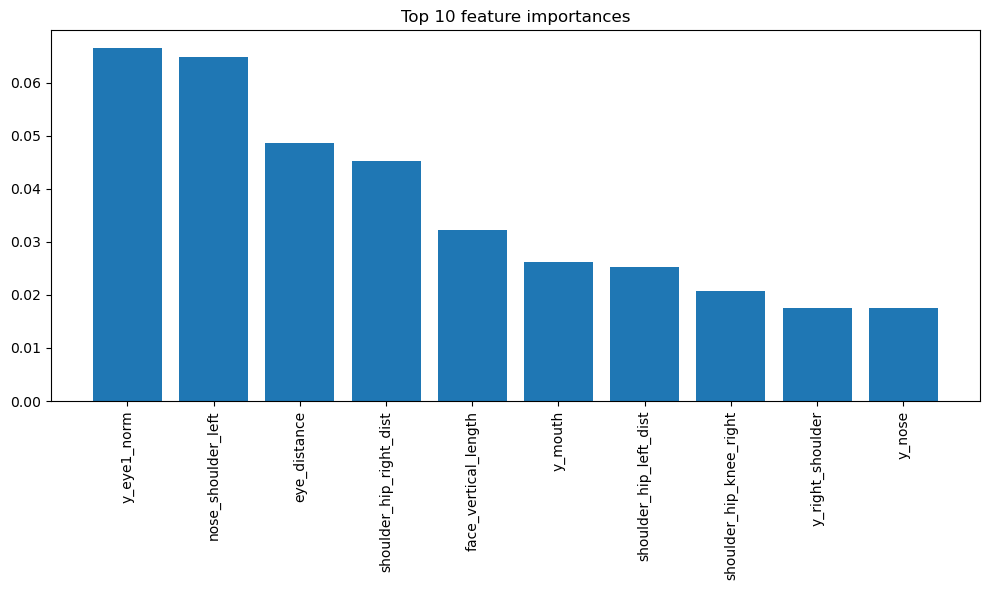

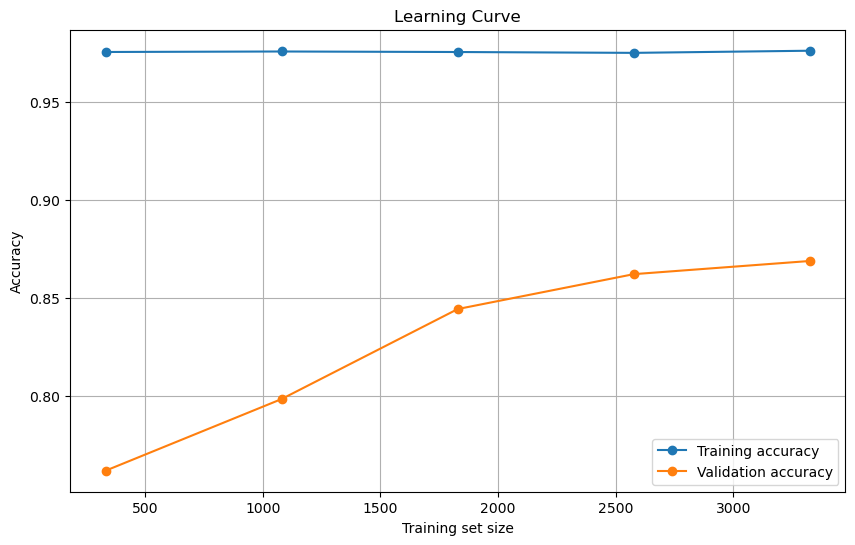


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.88      0.82      0.85       423
 baby_unsafe       0.82      0.89      0.86       409

    accuracy                           0.85       832
   macro avg       0.85      0.85      0.85       832
weighted avg       0.85      0.85      0.85       832

Confusion matrix---------------------------------------


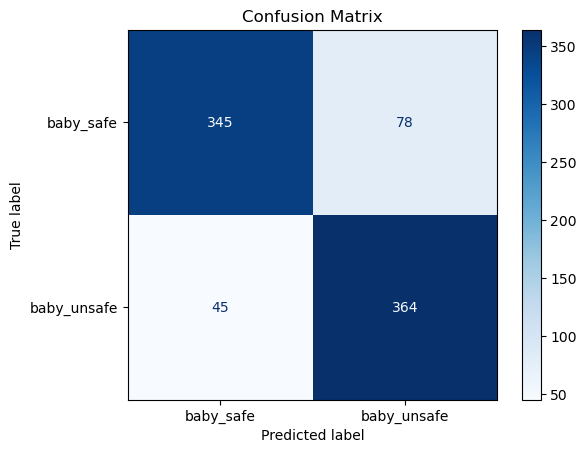

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


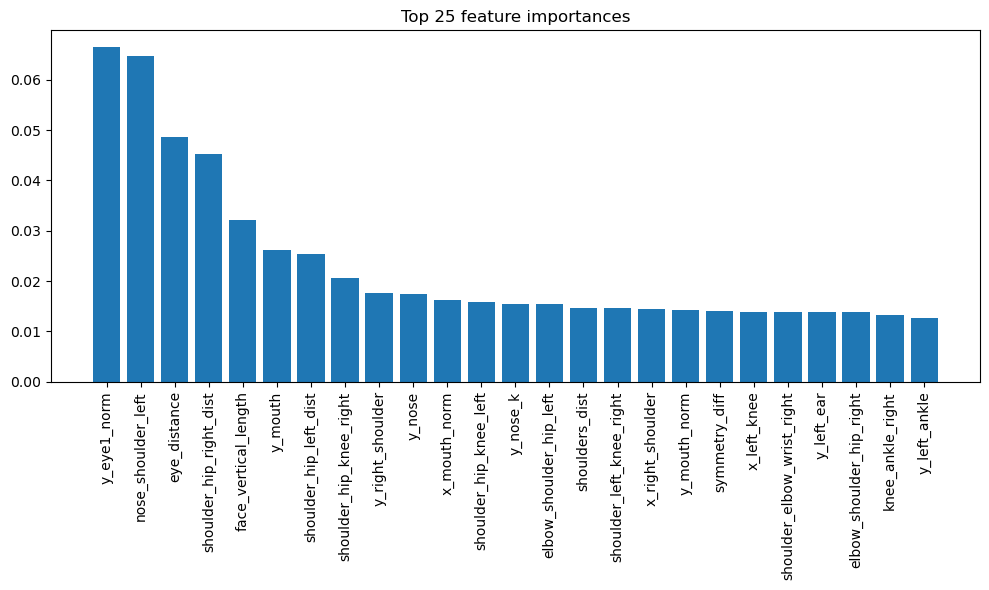

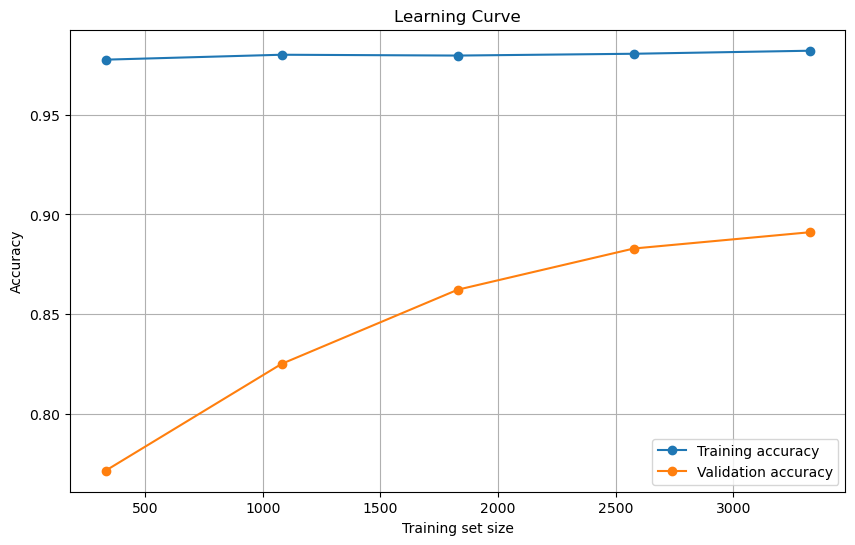


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.91      0.88      0.89       423
 baby_unsafe       0.88      0.90      0.89       409

    accuracy                           0.89       832
   macro avg       0.89      0.89      0.89       832
weighted avg       0.89      0.89      0.89       832

Confusion matrix---------------------------------------


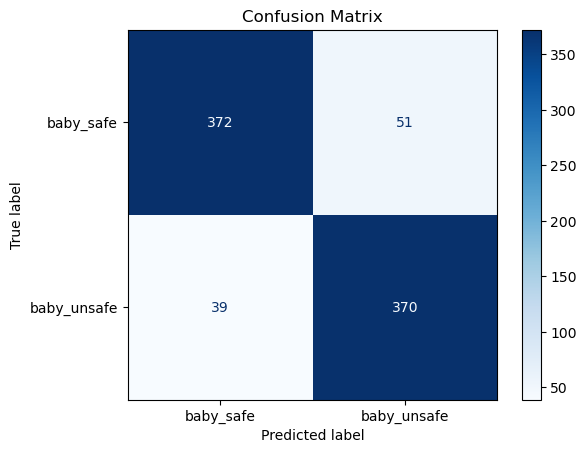

{'all_features': {'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=np.float64(0.9942601816442402), device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, feature_weights=None,
                gamma=np.float64(0.1210276357557502), grow_policy=None,
                importance_type=None, interaction_constraints=None,
                learning_rate=np.float64(0.21164066422176356), max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=5, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                multi_strategy=None, n_estimators=283, n_jobs=None,
                num_parallel_tree=None, ...),
  'X': array([[     1.4328,       0.744,      1.1713, ...,     0.76244,     0.77193,

In [66]:
clf = Classifier(df, emb_builder.y, emb_builder.classes_bs,figsize = (10, 6))
clf.evaluation_pipeline(xgbc_2,verbose=True)

In [67]:
df.drop(["y_eye2","x_eye2","flag_mouth"],axis=1,inplace=True)

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


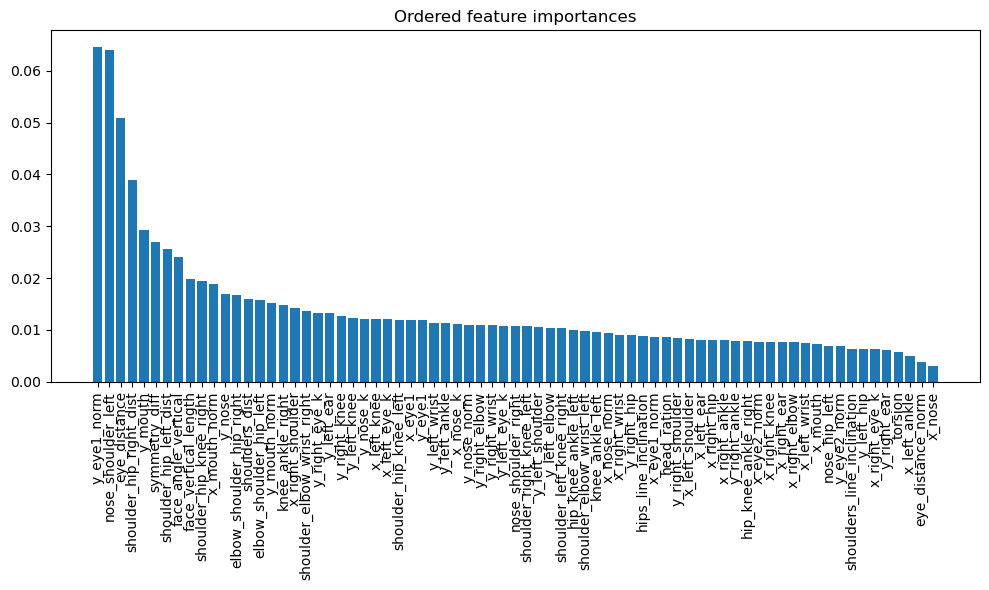

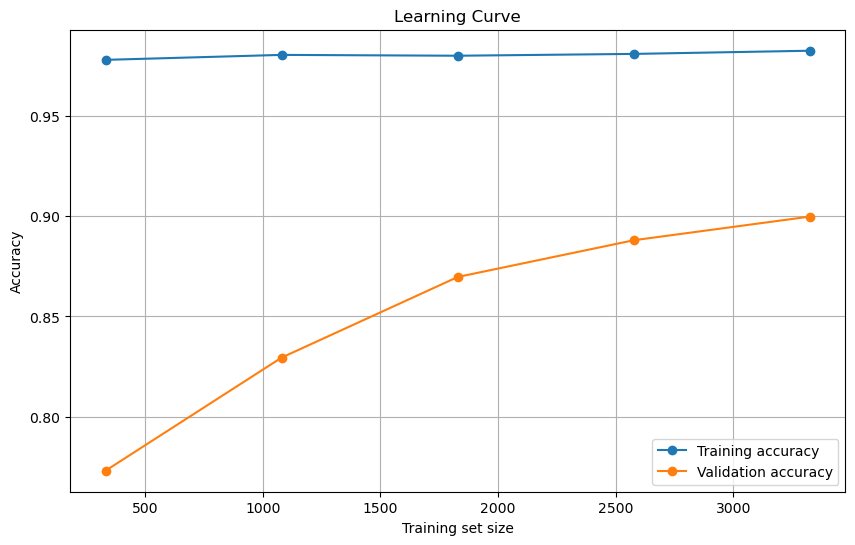


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.93      0.88      0.90       423
 baby_unsafe       0.88      0.93      0.90       409

    accuracy                           0.90       832
   macro avg       0.90      0.90      0.90       832
weighted avg       0.90      0.90      0.90       832

Confusion matrix---------------------------------------


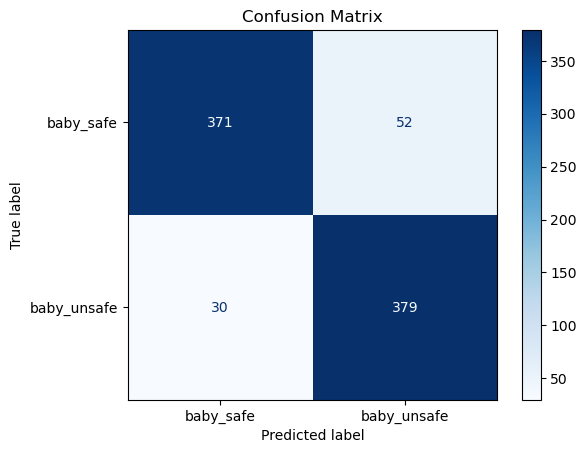

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


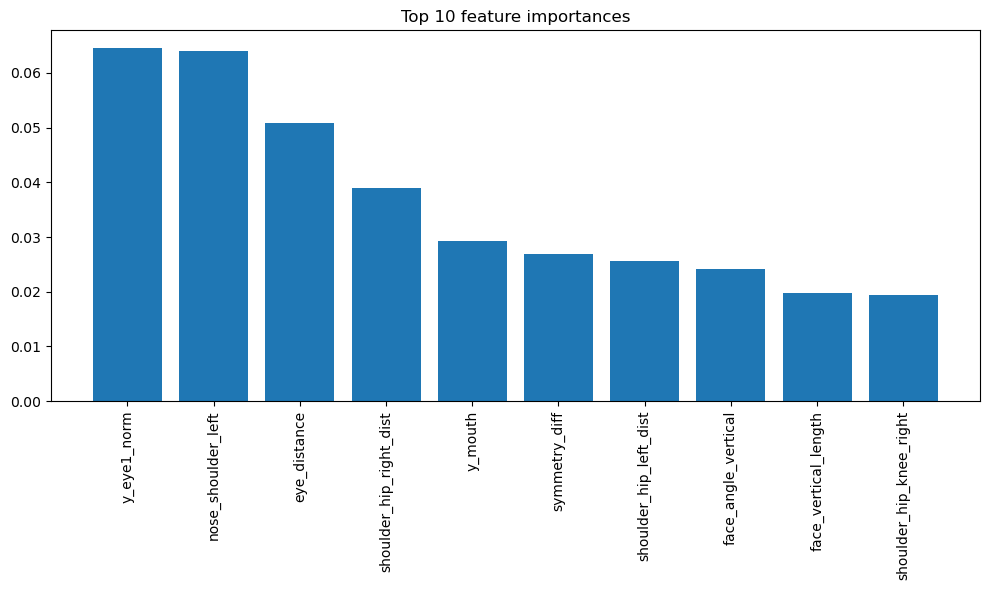

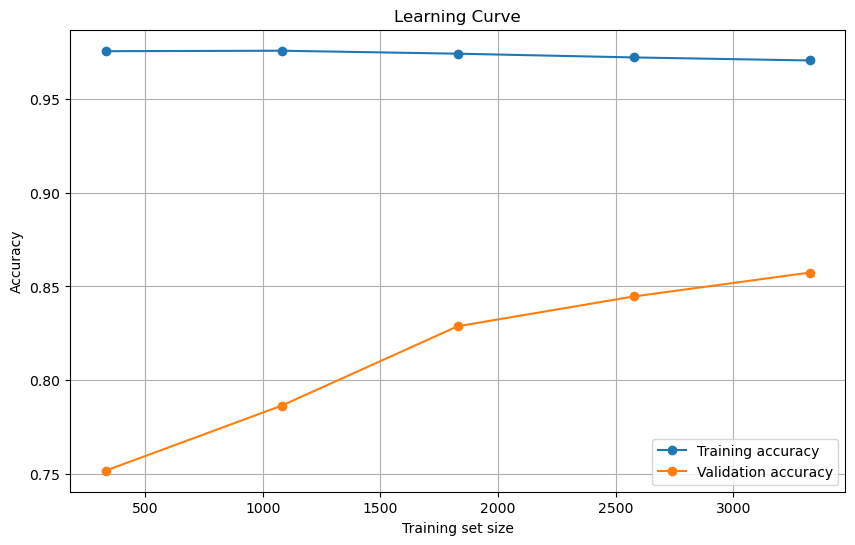


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.86      0.83      0.84       423
 baby_unsafe       0.83      0.86      0.84       409

    accuracy                           0.84       832
   macro avg       0.84      0.84      0.84       832
weighted avg       0.84      0.84      0.84       832

Confusion matrix---------------------------------------


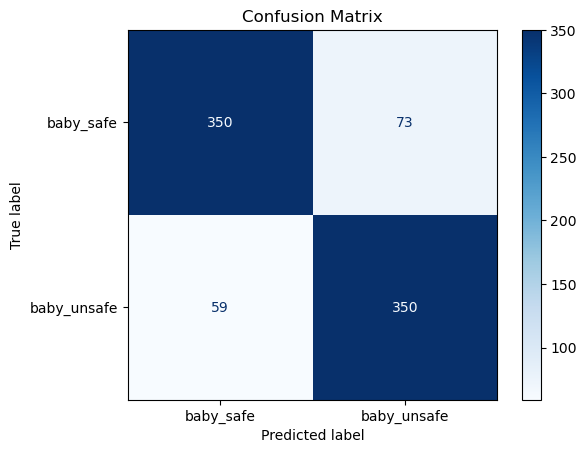

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


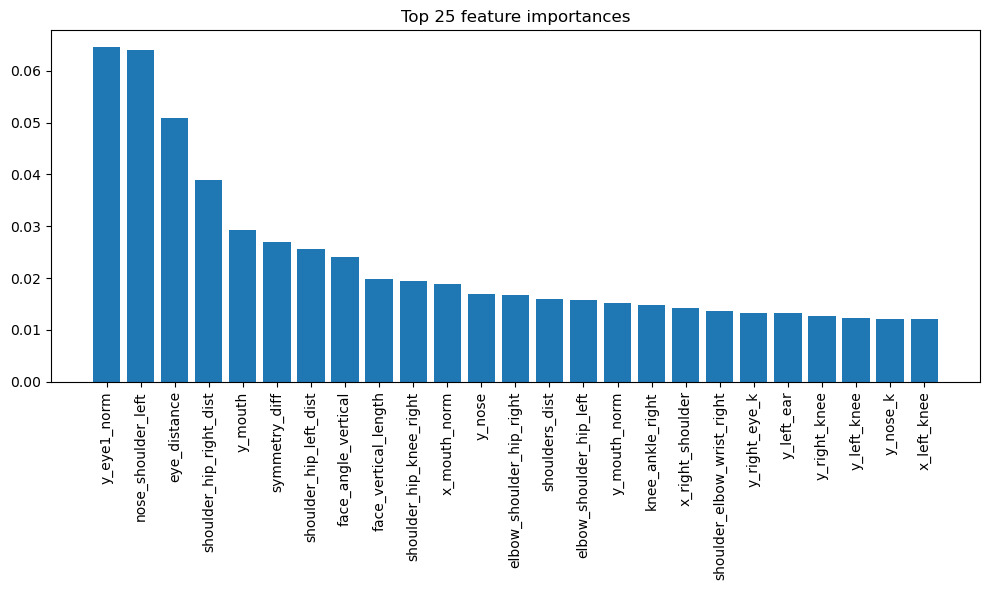

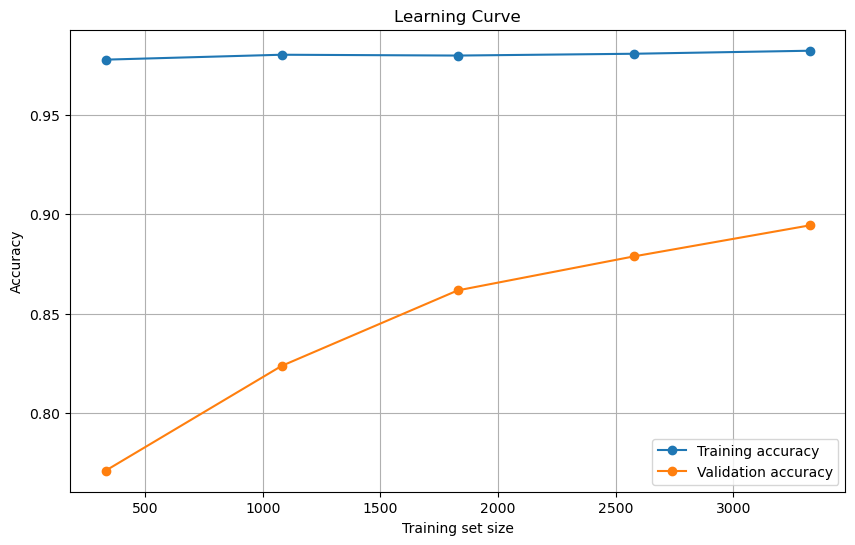


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.88      0.89       423
 baby_unsafe       0.88      0.90      0.89       409

    accuracy                           0.89       832
   macro avg       0.89      0.89      0.89       832
weighted avg       0.89      0.89      0.89       832

Confusion matrix---------------------------------------


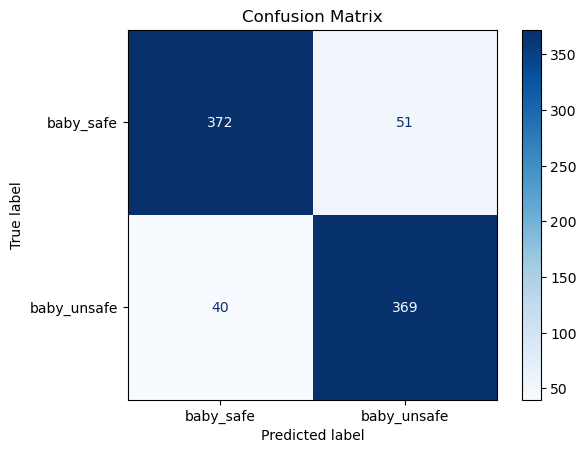

{'all_features': {'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=np.float64(0.9942601816442402), device=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, feature_weights=None,
                gamma=np.float64(0.1210276357557502), grow_policy=None,
                importance_type=None, interaction_constraints=None,
                learning_rate=np.float64(0.21164066422176356), max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=5, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                multi_strategy=None, n_estimators=283, n_jobs=None,
                num_parallel_tree=None, ...),
  'X': array([[      0.744,      1.1713,     0.88939, ...,     0.76244,     0.77193,

In [68]:
clf = Classifier(df, emb_builder.y, emb_builder.classes_bs,figsize = (10, 6))
clf.evaluation_pipeline(xgbc_2,verbose=True)

In [70]:
cols_diff = set(df.columns) ^ set(embeddings.columns)
print("Colonne presenti solo in uno dei due DF:", cols_diff)

Colonne presenti solo in uno dei due DF: {'face_vertical_length_norm', 'flag_mouth', 'flag_eye1', 'face_angle_horizontal', 'flag_nose', 'y_eye2', 'x_left_elbow', 'x_left_hip', 'x_eye2', 'nose_hip_right', 'flag_eye2'}


# 6) Another ensamble with xgbc_2 with less features

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


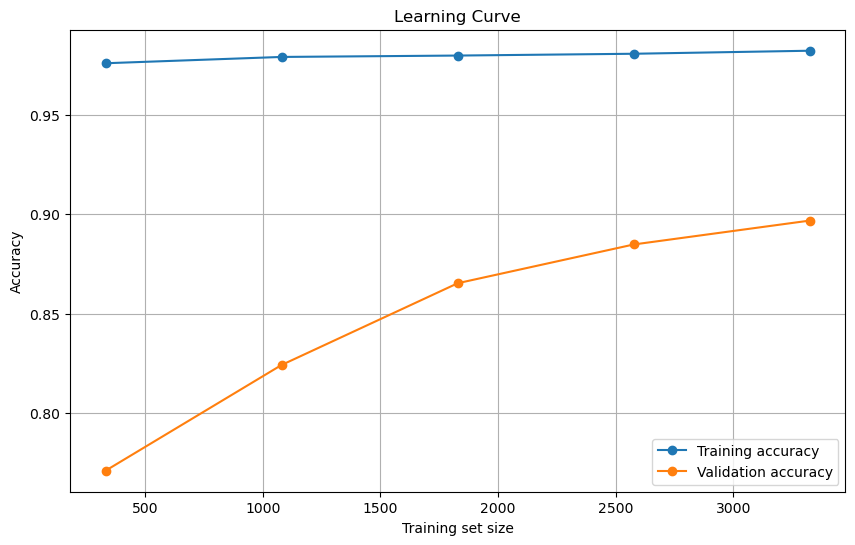


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.91      0.86      0.88       423
 baby_unsafe       0.86      0.91      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


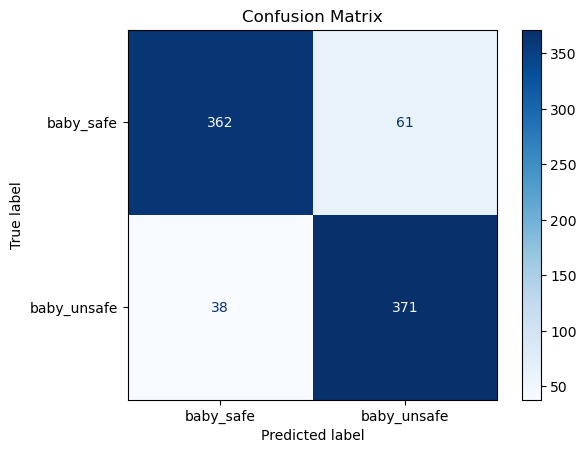

In [94]:
clf = Classifier(df, emb_builder.y, emb_builder.classes_bs,figsize = (10, 6))
voting_clf_soft = VotingClassifier(
    estimators=[('lr', lr_2), ('rf', random_forest_2), ('xgb', xgbc_2), ('bagging', bagging_2)],
    voting='soft'  # 'hard' per la maggioranza, 'soft' per le probabilità
)

results_voting_soft = clf.evaluation_pipeline(voting_clf_soft,verbose=True,is_ensemble=True)

------------------------------------------------------------------------------------------
-----------------------ENSEMBLE MODEL EVALUATION ON TOP 10 FEATURES-----------------------
------------------------------------------------------------------------------------------


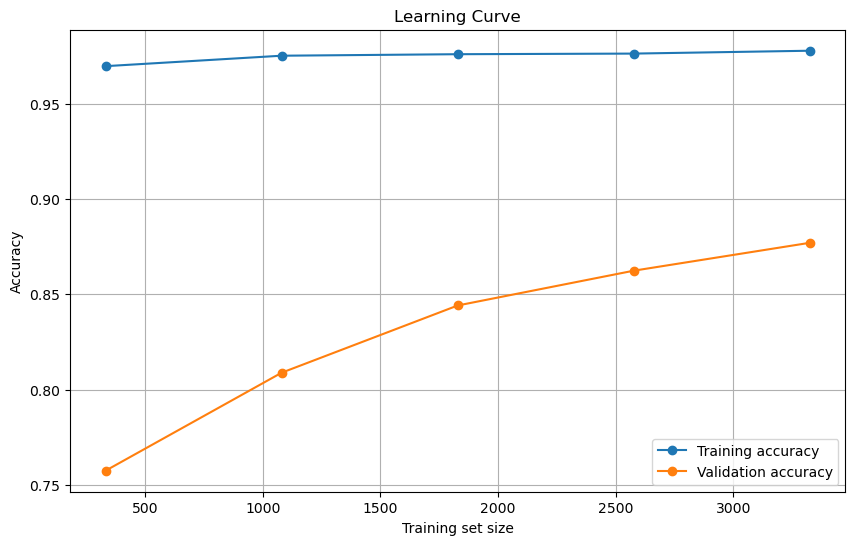


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.89      0.84      0.86       423
 baby_unsafe       0.84      0.90      0.87       409

    accuracy                           0.87       832
   macro avg       0.87      0.87      0.87       832
weighted avg       0.87      0.87      0.87       832

Confusion matrix---------------------------------------


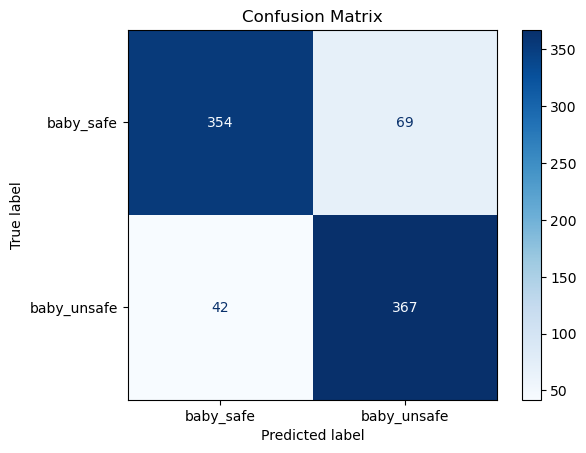

In [95]:
top_10_features_idx = results_lr_2['top_10_features']['top_features_idx']

results_voting_soft = clf.ensemble_on_top_features(
    ensemble_clf=voting_clf_soft,
    top_features_idx=top_10_features_idx,
    verbose=True
)

------------------------------------------------------------------------------------------
-----------------------ENSEMBLE MODEL EVALUATION ON TOP 25 FEATURES-----------------------
------------------------------------------------------------------------------------------


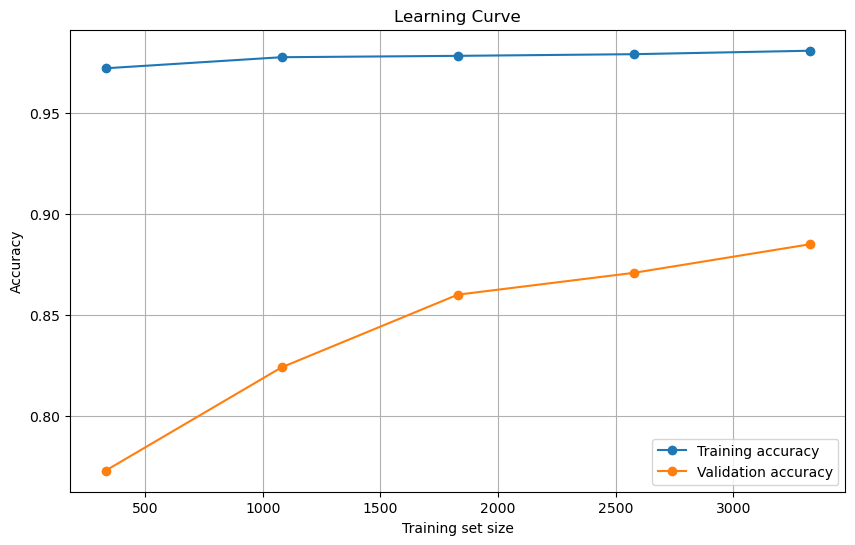


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.84      0.87       423
 baby_unsafe       0.85      0.90      0.87       409

    accuracy                           0.87       832
   macro avg       0.87      0.87      0.87       832
weighted avg       0.87      0.87      0.87       832

Confusion matrix---------------------------------------


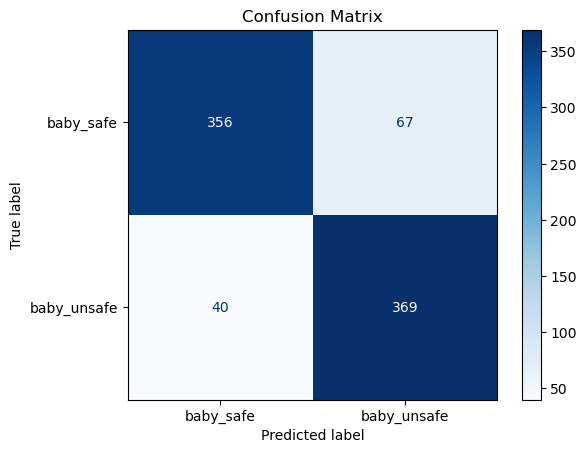

In [96]:
top_25_features_idx = results_lr_2['top_25_features']['top_features_idx']

results_voting_soft = clf.ensemble_on_top_features(
    ensemble_clf=voting_clf_soft,
    top_features_idx=top_25_features_idx,
    verbose=True
)

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


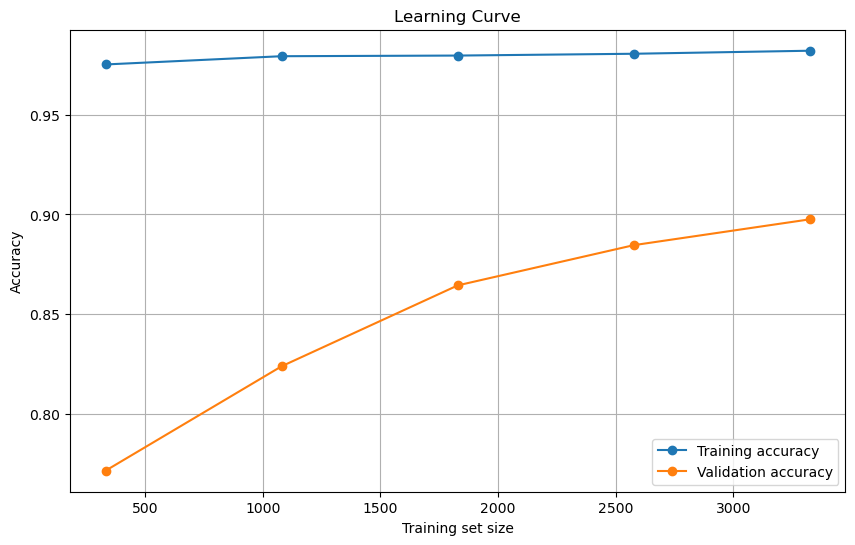


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.90      0.86      0.88       423
 baby_unsafe       0.86      0.90      0.88       409

    accuracy                           0.88       832
   macro avg       0.88      0.88      0.88       832
weighted avg       0.88      0.88      0.88       832

Confusion matrix---------------------------------------


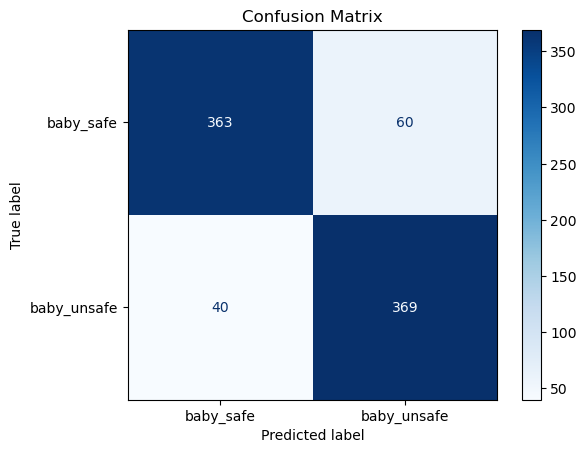

In [97]:
from sklearn.calibration import CalibratedClassifierCV
# Calibrazione dei modelli per migliorare le probabilità
# Per la Regressione Logistica, la calibrazione è solitamente meno necessaria, ma è una buona pratica
calibrated_lr = CalibratedClassifierCV(lr_2, method='isotonic', cv=5)

# Per il Random Forest e altri modelli basati su alberi, la calibrazione è molto utile
calibrated_rf = CalibratedClassifierCV(random_forest_2, method='isotonic', cv=5)

# Anche per XGBoost, la calibrazione può aiutare
calibrated_xgbc = CalibratedClassifierCV(xgbc_2, method='isotonic', cv=5)

calibrated_bagging = CalibratedClassifierCV(bagging_2, method='isotonic', cv=5)

# Creazione del VotingClassifier utilizzando i modelli calibrati
# Nota: La calibrazione richiede 'voting='soft' per funzionare correttamente
voting_clf_soft_calibrated = VotingClassifier(
    estimators=[
        ('lr_calibrated', calibrated_lr),
        ('rf_calibrated', calibrated_rf),
        ('xgbc_calibrated', calibrated_xgbc),
        ('bagging_calibrated', calibrated_bagging)
    ],
    voting='soft'
)
results_voting_soft_calibrated = clf.evaluation_pipeline(voting_clf_soft,verbose=True,is_ensemble=True)

------------------------------------------------------------------------------------------
-----------------------ENSEMBLE MODEL EVALUATION ON TOP 10 FEATURES-----------------------
------------------------------------------------------------------------------------------


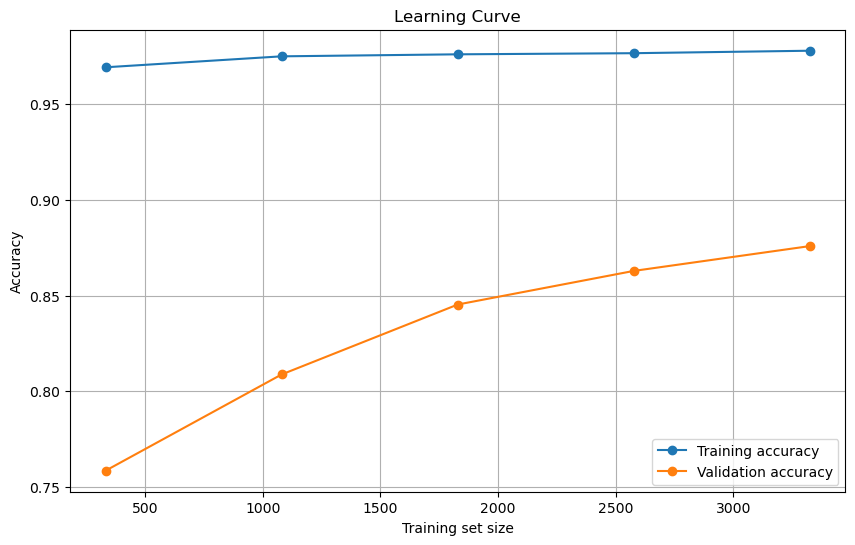


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.89      0.84      0.87       423
 baby_unsafe       0.85      0.90      0.87       409

    accuracy                           0.87       832
   macro avg       0.87      0.87      0.87       832
weighted avg       0.87      0.87      0.87       832

Confusion matrix---------------------------------------


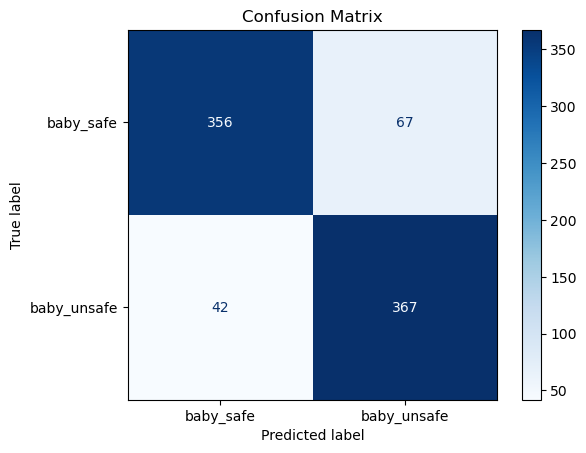

{'top_10_features': {'model': VotingClassifier(estimators=[('lr',
                                LogisticRegression(C=np.float64(1.6068111664741074),
                                                   solver='liblinear')),
                               ('rf',
                                RandomForestClassifier(bootstrap=False,
                                                       criterion='entropy',
                                                       max_depth=23,
                                                       max_features='log2',
                                                       min_samples_split=15,
                                                       n_estimators=570)),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                             

In [98]:
top_10_features_idx = results_lr_2['top_10_features']['top_features_idx']

clf.ensemble_on_top_features(
    ensemble_clf=voting_clf_soft,
    top_features_idx=top_10_features_idx,
    verbose=True
)

# Compare all the models


In [ ]:
data_to_plot_1 = [
        (results_lr_1['all_features']['model'], "LR1 - All Features", results_lr_1['all_features']['X'], results_lr_1['all_features']['y']),
        (results_lr_2['all_features']['model'], "LR2 - All Features", results_lr_2['all_features']['X'], results_lr_2['all_features']['y']),
        (results_rf1['all_features']['model'], "RF1 - All Features", results_rf1['all_features']['X'], results_rf1['all_features']['y']),
        (results_rf2['all_features']['model'], "RF2 - All Features", results_rf2['all_features']['X'], results_rf2['all_features']['y']),
        (results_xgbc_1['all_features']['model'], "xgbc_1 - All Features", results_xgbc_1['all_features']['X'], results_xgbc_1['all_features']['y']),
        (results_xgbc_2['all_features']['model'], "xgbc_2 - All Features", results_xgbc_2['all_features']['X'], results_xgbc_2['all_features']['y']),
        (results_bagging_2['all_features']['model'], "Bagging - All Features", results_bagging_2['all_features']['X'], results_bagging_2['all_features']['y'])
]

data_to_plot_2 = [
        (results_lr_1['top_10_features']['model'], "LR1 - Top 10 features", results_lr_1['top_10_features']['X'], results_lr_1['top_10_features']['y']),
        (results_lr_2['top_10_features']['model'], "LR2 - Top 10 features", results_lr_2['top_10_features']['X'], results_lr_2['top_10_features']['y']),
        (results_rf1['top_10_features']['model'], "RF1 - Top 10 features", results_rf1['top_10_features']['X'], results_rf1['top_10_features']['y']),
        (results_rf2['top_10_features']['model'], "RF2 - Top 10 features", results_rf2['top_10_features']['X'], results_rf2['top_10_features']['y']),
        (results_xgbc_1['top_10_features']['model'], "xgbc_1 - Top 10 features", results_xgbc_1['top_10_features']['X'], results_xgbc_1['top_10_features']['y']),
        (results_xgbc_2['top_10_features']['model'], "xgbc_2 - Top 10 features", results_xgbc_2['top_10_features']['X'], results_xgbc_2['top_10_features']['y'])
]

data_to_plot_3 = [
        (results_lr_1['top_25_features']['model'], "LR1 - Top 25 features", results_lr_1['top_25_features']['X'], results_lr_1['top_25_features']['y']),
        (results_lr_2['top_25_features']['model'], "LR2 - Top 25 features", results_lr_2['top_25_features']['X'], results_lr_2['top_25_features']['y']),
        (results_rf1['top_25_features']['model'], "RF1 - Top 25 features", results_rf1['top_25_features']['X'], results_rf1['top_25_features']['y']),
        (results_rf2['top_25_features']['model'], "RF2 - Top 25 features", results_rf2['top_25_features']['X'], results_rf2['top_25_features']['y']),
        (results_xgbc_1['top_25_features']['model'], "xgbc_1 - Top 25 features", results_xgbc_1['top_25_features']['X'], results_xgbc_1['top_25_features']['y']),
        (results_xgbc_2['top_25_features']['model'], "xgbc_2 - Top 25 features", results_xgbc_2['top_25_features']['X'], results_xgbc_2['top_25_features']['y'])
]


clf.plot_learning_curve_comparison(data_sets=data_to_plot_1, title="Comparison of all Learning Curves (all features)"
)
clf.plot_learning_curve_comparison(data_sets=data_to_plot_2, title="Comparison of all Learning Curves (top_10_features)"
)

clf.plot_learning_curve_comparison(data_sets=data_to_plot_3, title="Comparison of all Learning Curves (top_25_features)"
)

clf.plot_learning_curve_comparison(data_sets=data_to_plot_1 + data_to_plot_2 + data_to_plot_3, title="Comparison of all Learning Curves",figsize=(30,15)
)

__Our best is xgbc:__
- Best parameters:  {'colsample_bytree': np.float64(0.9942601816442402), 'gamma': np.float64(0.1210276357557502), 'learning_rate': np.float64(0.21164066422176356), 'max_depth': 5, 'n_estimators': 283, 'subsample': np.float64(0.6950550175969599)}
- Best embeddings: orginal - {'face_vertical_length_norm', 'flag_mouth', 'flag_eye1', 'face_angle_horizontal', 'flag_nose', 'y_eye2', 'x_left_elbow', 'x_left_hip', 'x_eye2', 'nose_hip_right', 'flag_eye2'}
- Performance: 0.90 with all feature, 0.89 with 25_top_features, 0.84 with top_10_features

__Best xgbx in accuracy:__
- Best parameters: {'colsample_bytree': np.float64(0.9942601816442402), 'gamma': np.float64(0.1210276357557502), 'learning_rate': np.float64(0.21164066422176356), 'max_depth': 5, 'n_estimators': 283, 'subsample': np.float64(0.6950550175969599)}
- Best embeddings: orginal - {'x_left_elbow', 'x_left_hip'}
- Performance: 0.92 with all feature, 0.88 with 25_top_features, 0.85 with top_10_features

# 8) Metric learning supervised

In [110]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")

Using device: mps


In [104]:
emb_builder = EmbeddingBuilder(model_path_fd, image_dataset_path, "load",weights_path_pe=model_path_pe)
embeddings = emb_builder.create_embedding(flags=True,positions=True, positions_normalized=True, geometric_info=True,k_positions_normalized=True ,k_geometric_info=True)


Extracting dataset info from .coco.json file:---------------------------------------------
Dataset contains 4158 valid samples, and labels are {'baby_on_back': 1, 'baby_on_stomach': 2}
------------------------------------------------------------------------------------------

Loading features from .csv----------------------------------------------------------------
Features loaded succesfully, in particular there are 4158 files in the dataset
------------------------------------------------------------------------------------------

Embedding builder initialized successfully------------------------------------------------
Face detection model: 4 (YOLOv8)
Dataset: /Users/lorenzodimaio/Download/SIDS_revelation_project/datasets/onback_onstomach_v3
Dataset dimension: 4158
Dataset labels: {'baby_safe': 0, 'baby_unsafe': 1}
------------------------------------------------------------------------------------------

Embedding creation-----------------------------------------------------------

In [100]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np

# -------------------------
# Dataset
# -------------------------
class EmbeddingDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# -------------------------
# Modello MLP -> embedding 32-dim
# -------------------------
class EmbeddingNet(nn.Module):
    def __init__(self, input_dim=86, embed_dim=32):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, embed_dim)
        )

    def forward(self, x):
        x = self.net(x)
        return F.normalize(x, p=2, dim=1)   # normalizza (cosine)

In [101]:
from pytorch_metric_learning.losses import SupConLoss
def train_embeddings(X, y, embed_dim=32, epochs=20, batch_size=128, lr=1e-3, device="cpu"):
    dataset = EmbeddingDataset(X, y)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    model = EmbeddingNet(input_dim=X.shape[1], embed_dim=embed_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    loss_fn = SupConLoss()  # supervised contrastive loss

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            emb = model(xb)  # (batch, embed_dim)
            loss = loss_fn(emb, yb)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        print(f"Epoch {epoch+1}/{epochs} - Loss: {total_loss/len(loader):.4f}")
    return model

numpy.ndarray

In [111]:
# Esempio di uso
# X: numpy array (4500, 86)
# y: numpy array (4500,) con labels (0=on_back, 1=on_stomach)

model = train_embeddings(embeddings.to_numpy(), emb_builder.y, embed_dim=32, epochs=30, device=device)

# Estrai embeddings finali
model.eval()
with torch.no_grad():
    X_new = model(torch.tensor(embeddings.to_numpy(), dtype=torch.float32).to(device)).cpu().numpy()

print("Nuovi embeddings:", X_new.shape)  # (4500, 32)

Epoch 1/30 - Loss: 4.9811
Epoch 2/30 - Loss: 4.7733
Epoch 3/30 - Loss: 4.7474
Epoch 4/30 - Loss: 4.7262
Epoch 5/30 - Loss: 4.7019
Epoch 6/30 - Loss: 4.6812
Epoch 7/30 - Loss: 4.6665
Epoch 8/30 - Loss: 4.6455
Epoch 9/30 - Loss: 4.6257
Epoch 10/30 - Loss: 4.6130
Epoch 11/30 - Loss: 4.5986
Epoch 12/30 - Loss: 4.5822
Epoch 13/30 - Loss: 4.5599
Epoch 14/30 - Loss: 4.5398
Epoch 15/30 - Loss: 4.5344
Epoch 16/30 - Loss: 4.5245
Epoch 17/30 - Loss: 4.5021
Epoch 18/30 - Loss: 4.4973
Epoch 19/30 - Loss: 4.4822
Epoch 20/30 - Loss: 4.4789
Epoch 21/30 - Loss: 4.4850
Epoch 22/30 - Loss: 4.4601
Epoch 23/30 - Loss: 4.4506
Epoch 24/30 - Loss: 4.4296
Epoch 25/30 - Loss: 4.4426
Epoch 26/30 - Loss: 4.4340
Epoch 27/30 - Loss: 4.4096
Epoch 28/30 - Loss: 4.4083
Epoch 29/30 - Loss: 4.4052
Epoch 30/30 - Loss: 4.3948
Nuovi embeddings: (4158, 32)


In [112]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold

clf = LogisticRegression(max_iter=1000, class_weight="balanced")
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X_new, emb_builder.y, cv=cv, scoring="balanced_accuracy")

print("Balanced accuracy (linear probe):", scores.mean())

Balanced accuracy (linear probe): 0.9564623595101365


In [122]:
df = DataFrame(X_new)

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


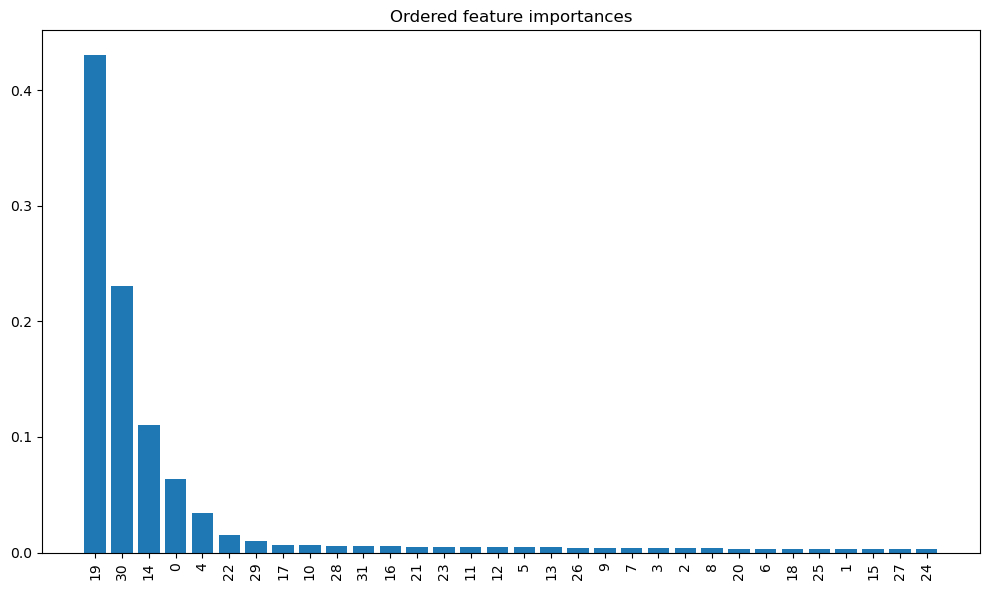

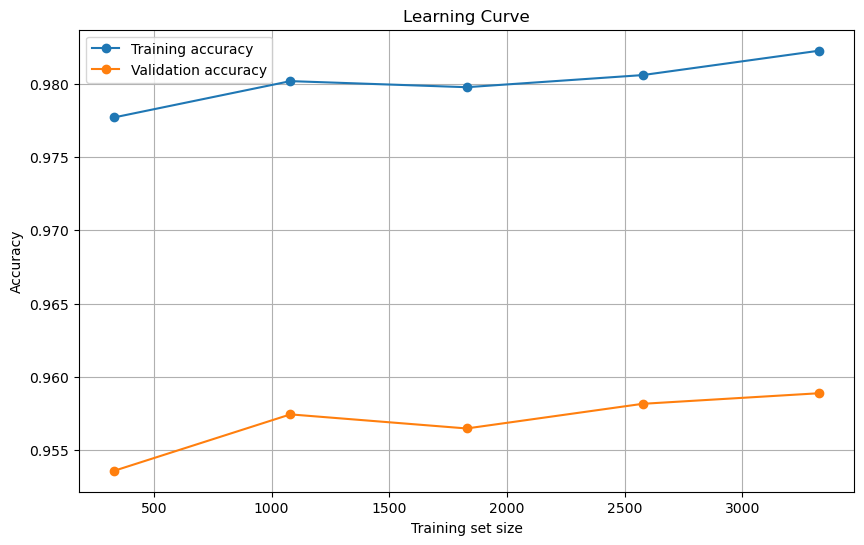


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.97      0.95      0.96       423
 baby_unsafe       0.95      0.97      0.96       409

    accuracy                           0.96       832
   macro avg       0.96      0.96      0.96       832
weighted avg       0.96      0.96      0.96       832

Confusion matrix---------------------------------------


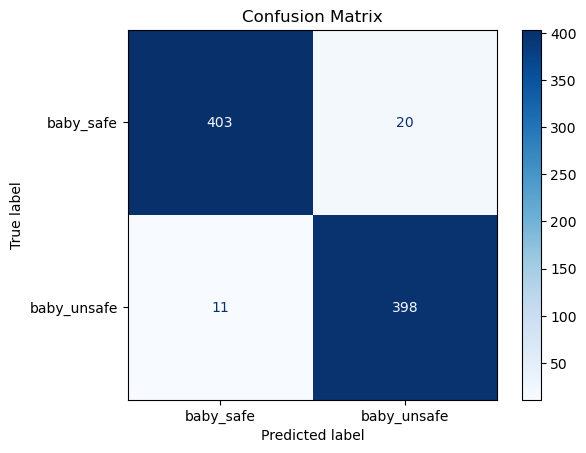

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


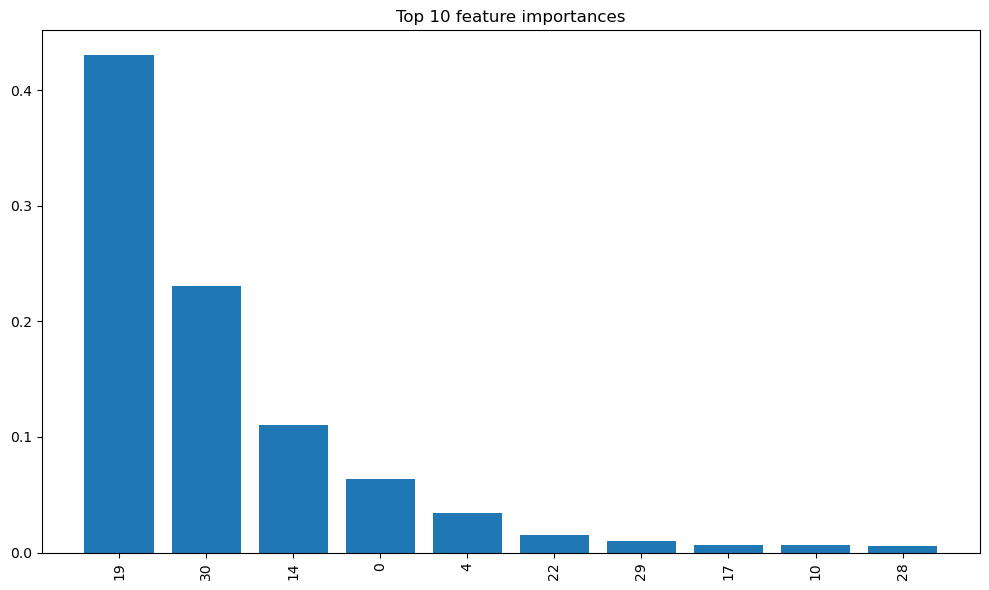

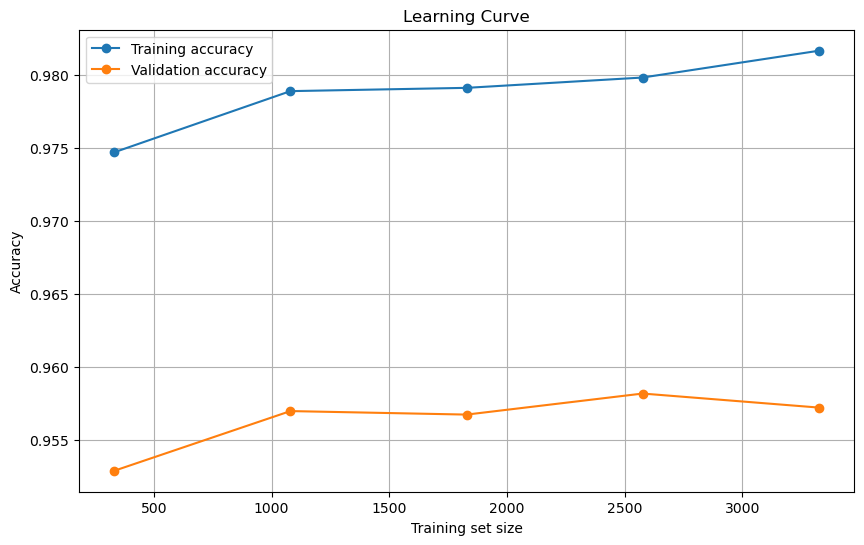


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.98      0.95      0.96       423
 baby_unsafe       0.95      0.98      0.96       409

    accuracy                           0.96       832
   macro avg       0.96      0.96      0.96       832
weighted avg       0.96      0.96      0.96       832

Confusion matrix---------------------------------------


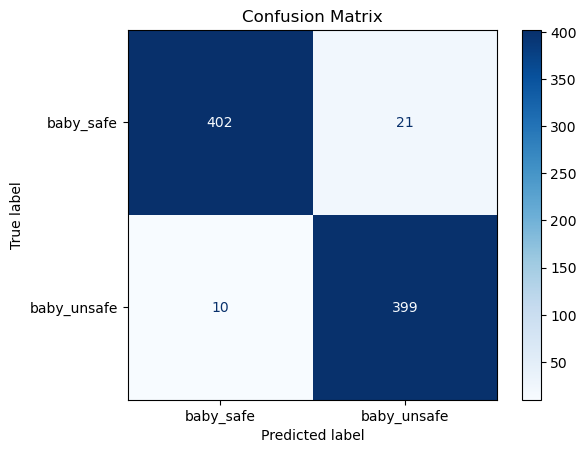

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


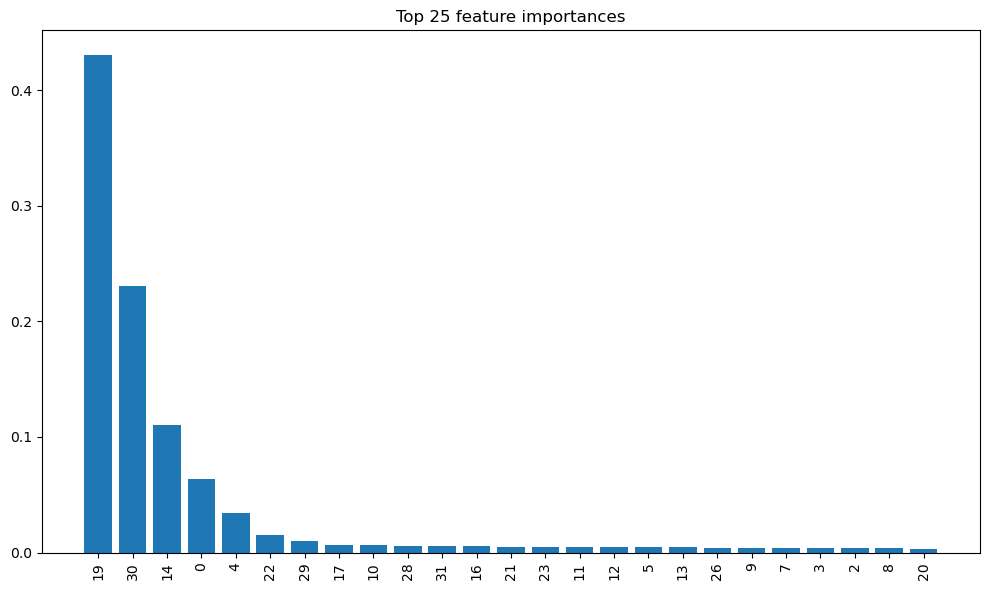

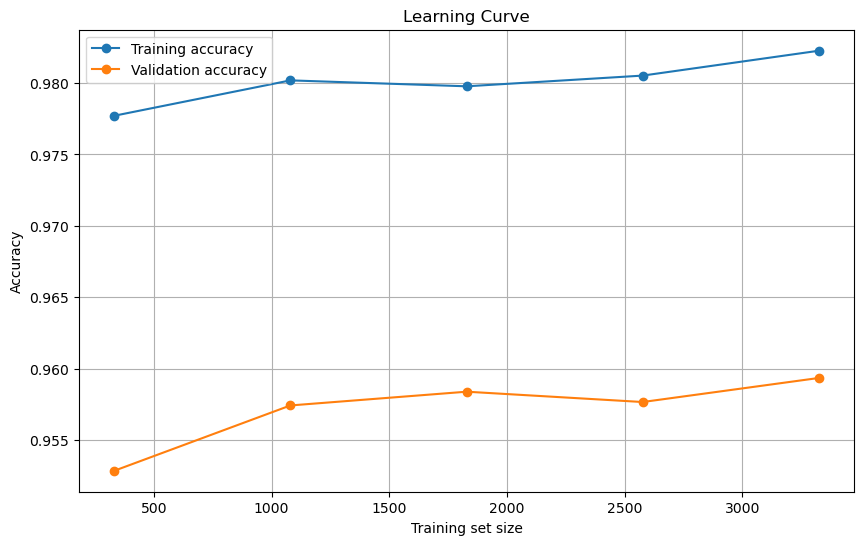


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.97      0.95      0.96       423
 baby_unsafe       0.95      0.97      0.96       409

    accuracy                           0.96       832
   macro avg       0.96      0.96      0.96       832
weighted avg       0.96      0.96      0.96       832

Confusion matrix---------------------------------------


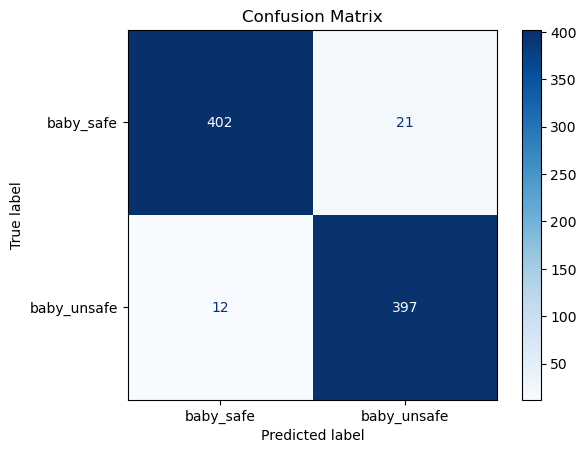

In [130]:
clf = Classifier(df, emb_builder.y, emb_builder.classes_bs,figsize = (10, 6))

new_xgbc, results_new = clf.XGBC(verbose=True)

------------------------------------------------------------------------------------------
--------------------------------------FIRST ANALYSIS--------------------------------------
------------------------------------------------------------------------------------------


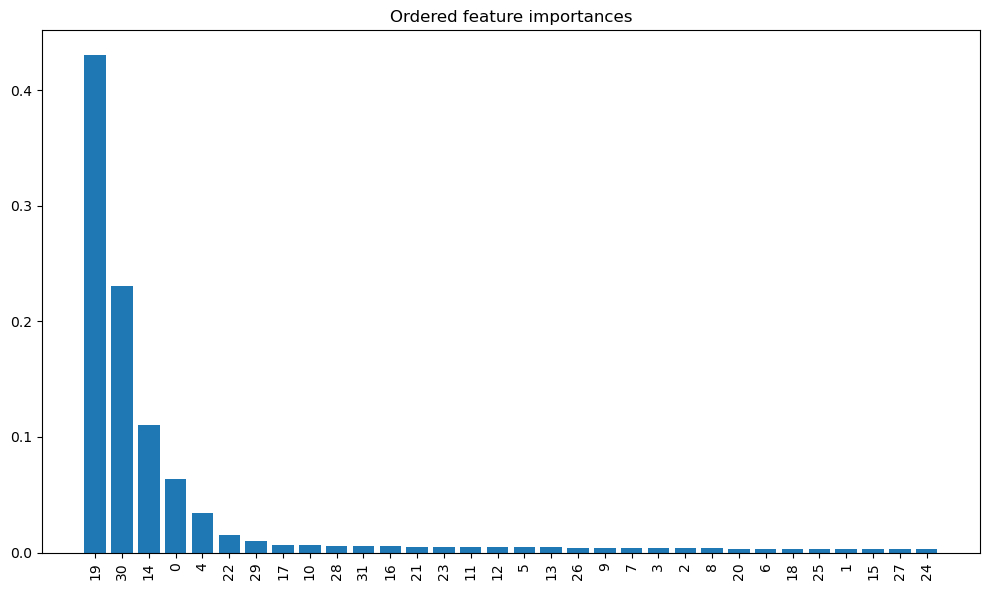

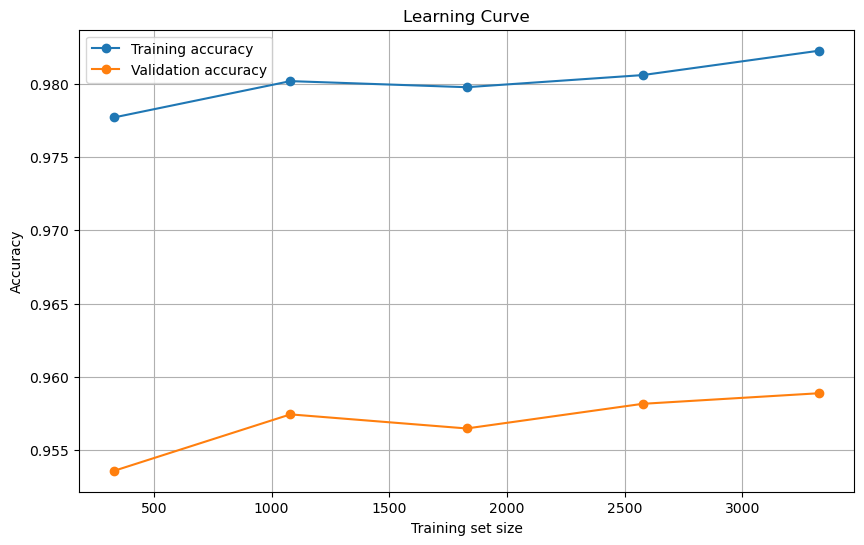


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.97      0.95      0.96       423
 baby_unsafe       0.95      0.97      0.96       409

    accuracy                           0.96       832
   macro avg       0.96      0.96      0.96       832
weighted avg       0.96      0.96      0.96       832

Confusion matrix---------------------------------------


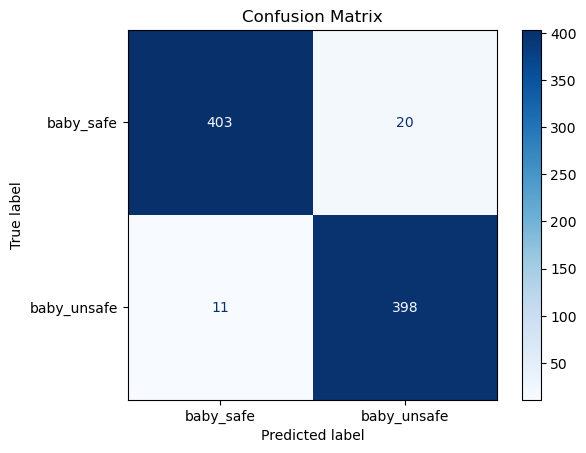

------------------------------------------------------------------------------------------
---------------------------------TOP 10 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


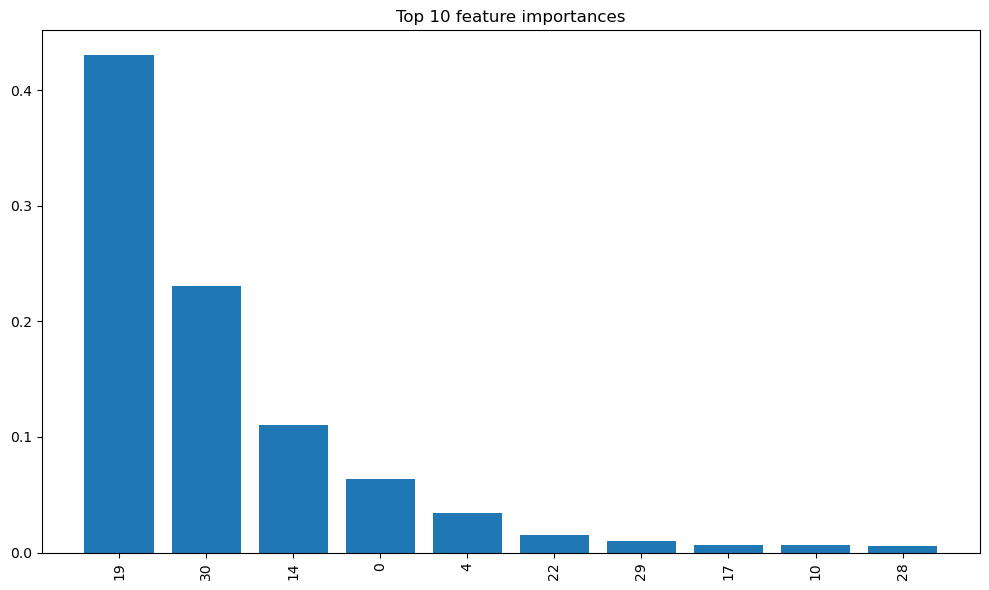

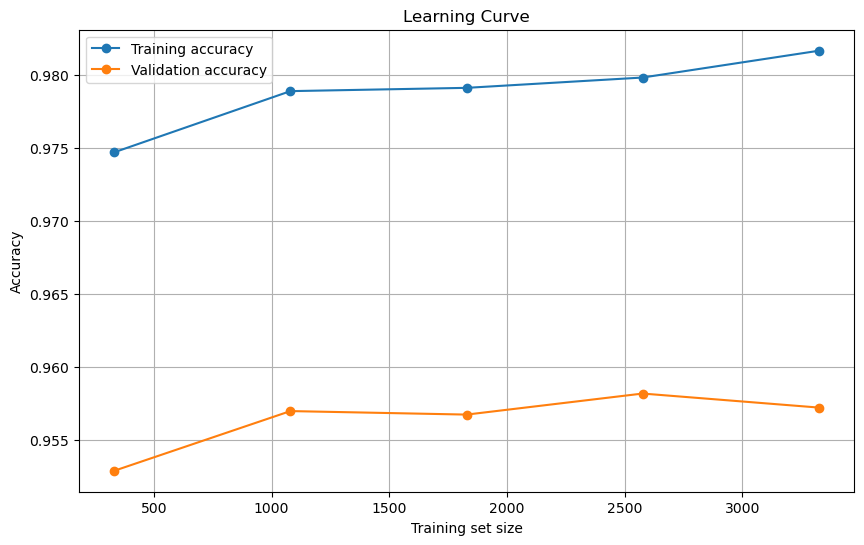


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.98      0.95      0.96       423
 baby_unsafe       0.95      0.98      0.96       409

    accuracy                           0.96       832
   macro avg       0.96      0.96      0.96       832
weighted avg       0.96      0.96      0.96       832

Confusion matrix---------------------------------------


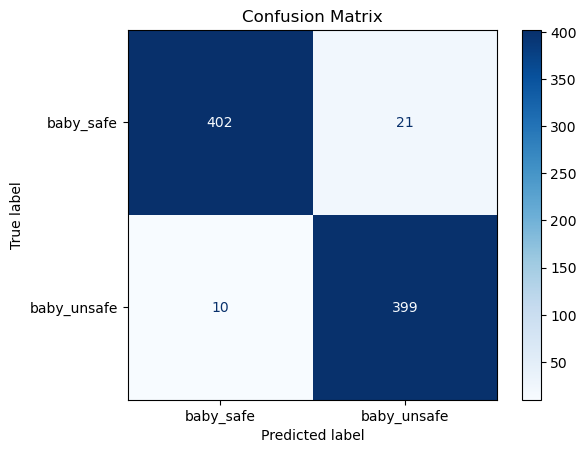

------------------------------------------------------------------------------------------
---------------------------------TOP 25 FEATURES ANALYSIS---------------------------------
------------------------------------------------------------------------------------------


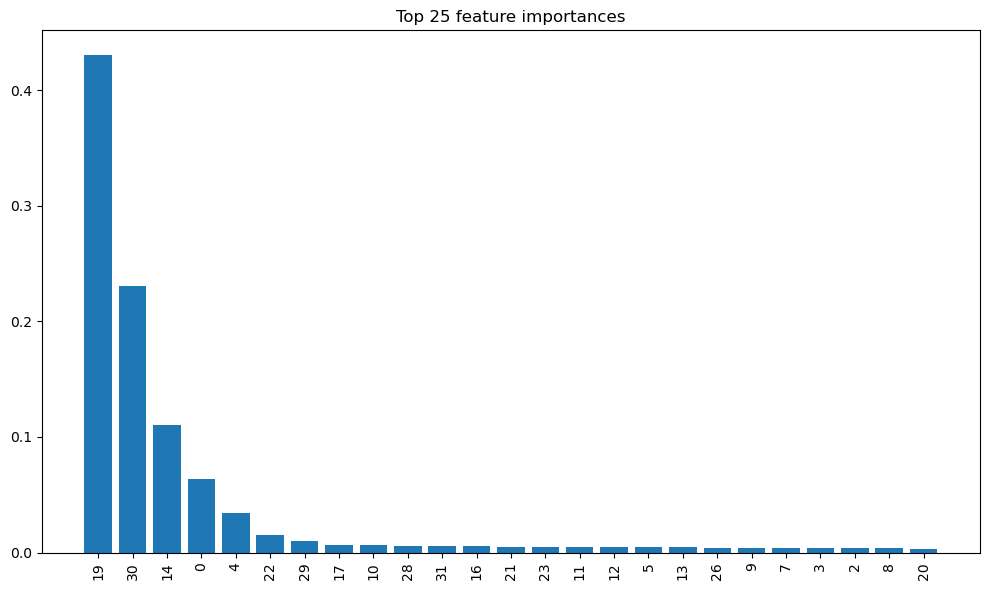

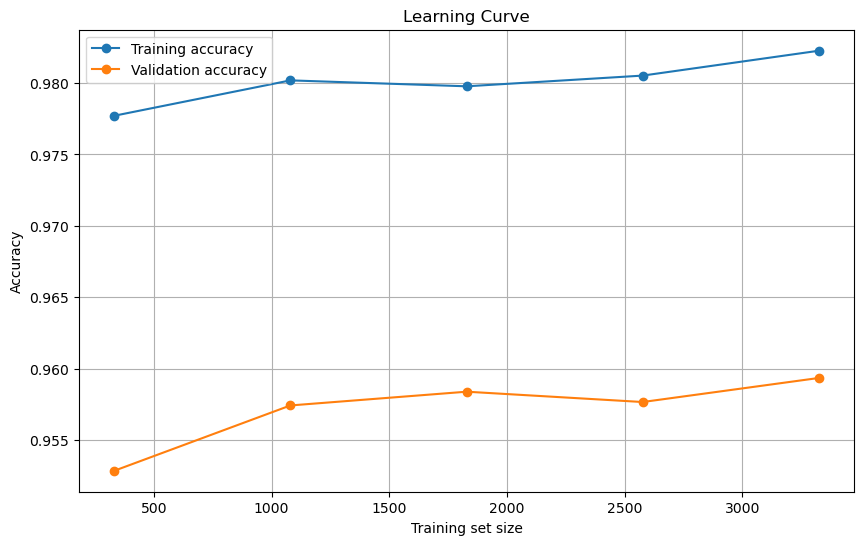


Dataset labels:----------------------------------------
{'baby_safe': 0, 'baby_unsafe': 1}

Report-------------------------------------------------
              precision    recall  f1-score   support

   baby_safe       0.97      0.95      0.96       423
 baby_unsafe       0.95      0.97      0.96       409

    accuracy                           0.96       832
   macro avg       0.96      0.96      0.96       832
weighted avg       0.96      0.96      0.96       832

Confusion matrix---------------------------------------


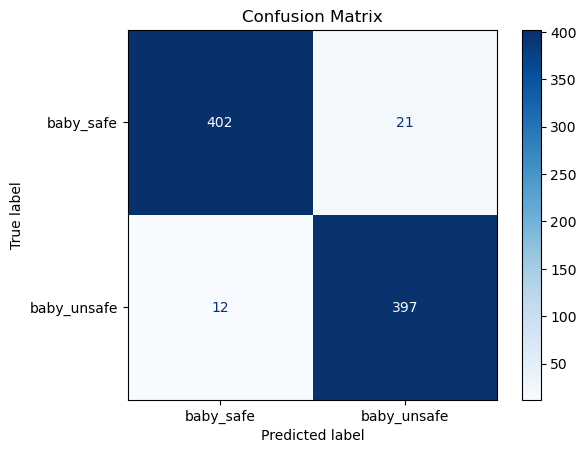

{'all_features': {'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=0.8, device=None, early_stopping_rounds=None,
                enable_categorical=False, eval_metric=None, feature_types=None,
                feature_weights=None, gamma=None, grow_policy=None,
                importance_type=None, interaction_constraints=None,
                learning_rate=0.05, max_bin=None, max_cat_threshold=None,
                max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
                max_leaves=None, min_child_weight=None, missing=nan,
                monotone_constraints=None, multi_strategy=None, n_estimators=300,
                n_jobs=None, num_parallel_tree=None, ...),
  'X': array([[  -0.068322,    -0.12876,     0.20589, ...,   -0.054089,      0.1056,    -0.15761],
         [   -0.32411,    -0.23001,     0.21229, ...,    -0.14206,   -0.027892,    -0.14148],
   

In [131]:
clf.evaluation_pipeline(new_xgbc,verbose=True)

In [137]:
from libraries.retrieval_utils import *
ret = ImageRetrieval(df, emb_builder.y, emb_builder.image_paths, image_dataset_path, emb_builder.classes_bs)

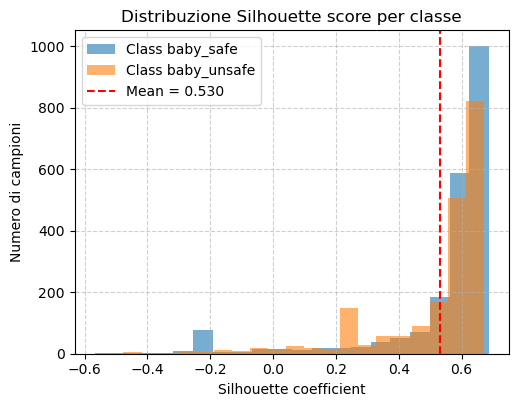

Silhouette score (euclidean): 0.530


np.float64(0.5300388015439411)

In [139]:
ret.build_index()
ret.plot_silhouette_per_class(verbose=True)

# Save Notebook

In [ ]:
os.environ["PATH"] = "/Library/TeX/texbin:" + os.environ["PATH"]
save_as_pdf(ipynbname.path())